# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

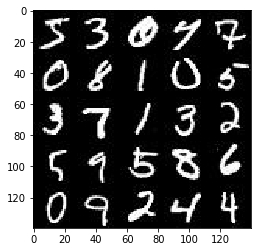

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

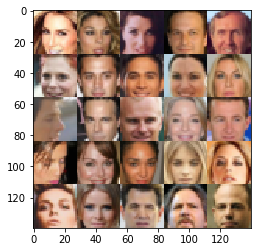

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.5.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], "input_real")
    input_z = tf.placeholder(tf.float32, [None, z_dim], "input_z")
    learning_rate = tf.placeholder(tf.float32, None, "learning_rate")

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # no alpha in args???
    alpha = 0.2
    # TODO: Implement Function
    leaky_relu = lambda x: tf.maximum(alpha * x, x)
    
    def conv(inputs, filters, batch_norm=True):
        outputs = tf.layers.conv2d(inputs, filters, 5, 2, 'same')
        if batch_norm:
            outputs = tf.layers.batch_normalization(outputs, training=True)
        return leaky_relu(outputs)
        
    
    with tf.variable_scope("discriminator", reuse=reuse):
        
        x1 = conv(images, 64, batch_norm=False)
        x2 = conv(x1, 128)
        x3 = conv(x2, 256)
        
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    leaky_relu = lambda x: tf.maximum(alpha * x, x)
    with tf.variable_scope("generator", reuse=not is_train):
        x1 = tf.layers.dense(z, 7*7*512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = leaky_relu(x1)
        # 7*7*512
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, 1, 'SAME')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = leaky_relu(x2)
        # 7*7*256
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, 2, 'SAME')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = leaky_relu(x3)
        # 14*14*128
    
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, 2, 'SAME')
        out = tf.tanh(logits)
        # 28*28*out_channel_dim
        return out
    return None


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    alpha = 0.9
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real) * alpha))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)

    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])

    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            steps = 0
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps +=1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Batch {}...".format(steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 100 == 0:
                    show_generator_output(sess, show_n_images, input_z, data_shape[3], data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/5... Batch 10... Discriminator Loss: 5.6533... Generator Loss: 0.0062
Epoch 1/5... Batch 20... Discriminator Loss: 3.8653... Generator Loss: 0.0313
Epoch 1/5... Batch 30... Discriminator Loss: 2.9615... Generator Loss: 0.0851
Epoch 1/5... Batch 40... Discriminator Loss: 2.9858... Generator Loss: 0.0783
Epoch 1/5... Batch 50... Discriminator Loss: 2.2766... Generator Loss: 0.1674
Epoch 1/5... Batch 60... Discriminator Loss: 2.2351... Generator Loss: 0.1899
Epoch 1/5... Batch 70... Discriminator Loss: 2.1587... Generator Loss: 0.1902
Epoch 1/5... Batch 80... Discriminator Loss: 1.9944... Generator Loss: 0.2432
Epoch 1/5... Batch 90... Discriminator Loss: 2.0313... Generator Loss: 0.2431
Epoch 1/5... Batch 100... Discriminator Loss: 1.9831... Generator Loss: 0.2333


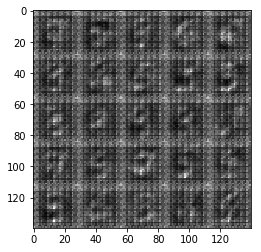

Epoch 1/5... Batch 110... Discriminator Loss: 1.6385... Generator Loss: 0.3752
Epoch 1/5... Batch 120... Discriminator Loss: 1.6900... Generator Loss: 0.3434
Epoch 1/5... Batch 130... Discriminator Loss: 1.5459... Generator Loss: 0.4467
Epoch 1/5... Batch 140... Discriminator Loss: 1.6339... Generator Loss: 0.3699
Epoch 1/5... Batch 150... Discriminator Loss: 1.6190... Generator Loss: 0.3780
Epoch 1/5... Batch 160... Discriminator Loss: 1.6620... Generator Loss: 0.3336
Epoch 1/5... Batch 170... Discriminator Loss: 1.7233... Generator Loss: 0.3166
Epoch 1/5... Batch 180... Discriminator Loss: 1.6372... Generator Loss: 0.3692
Epoch 1/5... Batch 190... Discriminator Loss: 1.4455... Generator Loss: 0.4652
Epoch 1/5... Batch 200... Discriminator Loss: 1.6858... Generator Loss: 0.3428


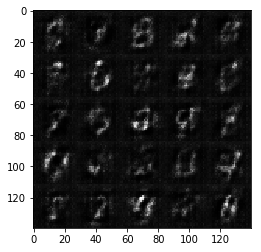

Epoch 1/5... Batch 210... Discriminator Loss: 1.2525... Generator Loss: 0.6684
Epoch 1/5... Batch 220... Discriminator Loss: 1.4571... Generator Loss: 0.4389
Epoch 1/5... Batch 230... Discriminator Loss: 1.5138... Generator Loss: 0.4283
Epoch 1/5... Batch 240... Discriminator Loss: 1.4465... Generator Loss: 0.4840
Epoch 1/5... Batch 250... Discriminator Loss: 1.4425... Generator Loss: 0.4753
Epoch 1/5... Batch 260... Discriminator Loss: 1.1855... Generator Loss: 1.3958
Epoch 1/5... Batch 270... Discriminator Loss: 1.2527... Generator Loss: 1.3660
Epoch 1/5... Batch 280... Discriminator Loss: 1.2021... Generator Loss: 1.0769
Epoch 1/5... Batch 290... Discriminator Loss: 1.2126... Generator Loss: 1.0558
Epoch 1/5... Batch 300... Discriminator Loss: 1.3084... Generator Loss: 1.1172


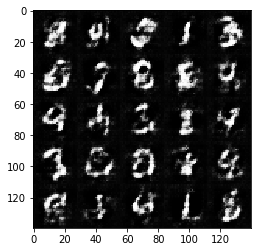

Epoch 1/5... Batch 310... Discriminator Loss: 1.2925... Generator Loss: 0.7280
Epoch 1/5... Batch 320... Discriminator Loss: 1.3716... Generator Loss: 1.2755
Epoch 1/5... Batch 330... Discriminator Loss: 1.6019... Generator Loss: 1.3783
Epoch 1/5... Batch 340... Discriminator Loss: 1.2762... Generator Loss: 1.1799
Epoch 1/5... Batch 350... Discriminator Loss: 1.3522... Generator Loss: 0.5690
Epoch 1/5... Batch 360... Discriminator Loss: 1.5840... Generator Loss: 0.3946
Epoch 1/5... Batch 370... Discriminator Loss: 1.2736... Generator Loss: 1.2756
Epoch 1/5... Batch 380... Discriminator Loss: 1.1577... Generator Loss: 0.9530
Epoch 1/5... Batch 390... Discriminator Loss: 1.0833... Generator Loss: 1.0217
Epoch 1/5... Batch 400... Discriminator Loss: 1.1722... Generator Loss: 1.0542


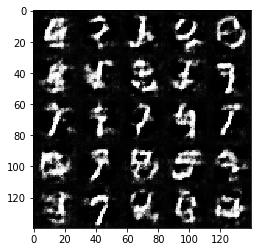

Epoch 1/5... Batch 410... Discriminator Loss: 1.4410... Generator Loss: 0.5318
Epoch 1/5... Batch 420... Discriminator Loss: 1.7594... Generator Loss: 0.3453
Epoch 1/5... Batch 430... Discriminator Loss: 1.3300... Generator Loss: 0.6037
Epoch 1/5... Batch 440... Discriminator Loss: 1.7237... Generator Loss: 0.3236
Epoch 1/5... Batch 450... Discriminator Loss: 1.4654... Generator Loss: 0.4494
Epoch 1/5... Batch 460... Discriminator Loss: 1.2023... Generator Loss: 1.3904
Epoch 1/5... Batch 470... Discriminator Loss: 1.1726... Generator Loss: 0.7552
Epoch 1/5... Batch 480... Discriminator Loss: 1.6334... Generator Loss: 0.3442
Epoch 1/5... Batch 490... Discriminator Loss: 1.6352... Generator Loss: 0.3642
Epoch 1/5... Batch 500... Discriminator Loss: 1.4091... Generator Loss: 0.4595


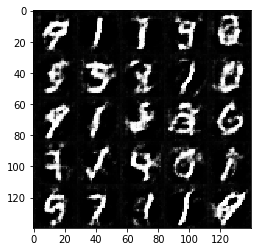

Epoch 1/5... Batch 510... Discriminator Loss: 1.3656... Generator Loss: 0.6607
Epoch 1/5... Batch 520... Discriminator Loss: 1.0578... Generator Loss: 0.8537
Epoch 1/5... Batch 530... Discriminator Loss: 1.0701... Generator Loss: 1.2101
Epoch 1/5... Batch 540... Discriminator Loss: 1.5196... Generator Loss: 1.7573
Epoch 1/5... Batch 550... Discriminator Loss: 1.1144... Generator Loss: 0.9889
Epoch 1/5... Batch 560... Discriminator Loss: 1.2137... Generator Loss: 1.4808
Epoch 1/5... Batch 570... Discriminator Loss: 1.4065... Generator Loss: 1.3041
Epoch 1/5... Batch 580... Discriminator Loss: 1.1770... Generator Loss: 1.0516
Epoch 1/5... Batch 590... Discriminator Loss: 1.0785... Generator Loss: 1.2036
Epoch 1/5... Batch 600... Discriminator Loss: 1.5566... Generator Loss: 0.3973


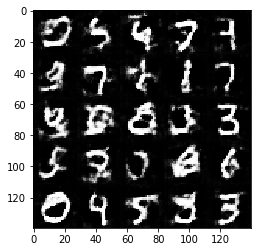

Epoch 1/5... Batch 610... Discriminator Loss: 1.1738... Generator Loss: 0.8417
Epoch 1/5... Batch 620... Discriminator Loss: 1.3840... Generator Loss: 0.5469
Epoch 1/5... Batch 630... Discriminator Loss: 1.5069... Generator Loss: 0.4303
Epoch 1/5... Batch 640... Discriminator Loss: 1.2334... Generator Loss: 0.9725
Epoch 1/5... Batch 650... Discriminator Loss: 1.1227... Generator Loss: 1.0563
Epoch 1/5... Batch 660... Discriminator Loss: 1.5960... Generator Loss: 0.3875
Epoch 1/5... Batch 670... Discriminator Loss: 1.3340... Generator Loss: 0.8848
Epoch 1/5... Batch 680... Discriminator Loss: 1.6705... Generator Loss: 0.3354
Epoch 1/5... Batch 690... Discriminator Loss: 1.5504... Generator Loss: 0.3887
Epoch 1/5... Batch 700... Discriminator Loss: 1.2528... Generator Loss: 0.6131


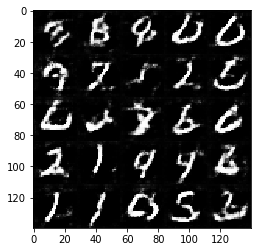

Epoch 1/5... Batch 710... Discriminator Loss: 1.5578... Generator Loss: 0.4067
Epoch 1/5... Batch 720... Discriminator Loss: 1.5850... Generator Loss: 0.3655
Epoch 1/5... Batch 730... Discriminator Loss: 1.3343... Generator Loss: 0.5222
Epoch 1/5... Batch 740... Discriminator Loss: 1.4145... Generator Loss: 0.4964
Epoch 1/5... Batch 750... Discriminator Loss: 1.2446... Generator Loss: 0.6339
Epoch 1/5... Batch 760... Discriminator Loss: 1.4253... Generator Loss: 2.1071
Epoch 1/5... Batch 770... Discriminator Loss: 1.1055... Generator Loss: 1.1953
Epoch 1/5... Batch 780... Discriminator Loss: 1.1975... Generator Loss: 1.0332
Epoch 1/5... Batch 790... Discriminator Loss: 1.4295... Generator Loss: 0.4950
Epoch 1/5... Batch 800... Discriminator Loss: 1.1665... Generator Loss: 1.0490


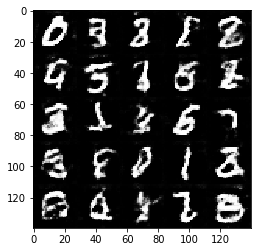

Epoch 1/5... Batch 810... Discriminator Loss: 1.0775... Generator Loss: 0.8654
Epoch 1/5... Batch 820... Discriminator Loss: 1.2763... Generator Loss: 0.5919
Epoch 1/5... Batch 830... Discriminator Loss: 2.0284... Generator Loss: 0.2789
Epoch 1/5... Batch 840... Discriminator Loss: 1.1076... Generator Loss: 1.0017
Epoch 1/5... Batch 850... Discriminator Loss: 1.5346... Generator Loss: 0.4107
Epoch 1/5... Batch 860... Discriminator Loss: 1.1972... Generator Loss: 0.6865
Epoch 1/5... Batch 870... Discriminator Loss: 1.2327... Generator Loss: 1.4840
Epoch 1/5... Batch 880... Discriminator Loss: 1.2027... Generator Loss: 0.7964
Epoch 1/5... Batch 890... Discriminator Loss: 1.1783... Generator Loss: 1.5230
Epoch 1/5... Batch 900... Discriminator Loss: 1.1628... Generator Loss: 0.7065


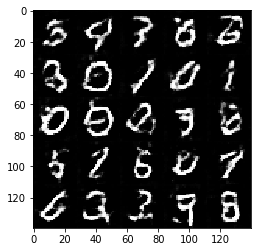

Epoch 1/5... Batch 910... Discriminator Loss: 1.3040... Generator Loss: 0.5600
Epoch 1/5... Batch 920... Discriminator Loss: 2.5129... Generator Loss: 0.1690
Epoch 1/5... Batch 930... Discriminator Loss: 1.2987... Generator Loss: 0.5819
Epoch 1/5... Batch 940... Discriminator Loss: 1.4360... Generator Loss: 0.4788
Epoch 1/5... Batch 950... Discriminator Loss: 1.1482... Generator Loss: 0.7468
Epoch 1/5... Batch 960... Discriminator Loss: 0.9836... Generator Loss: 1.0382
Epoch 1/5... Batch 970... Discriminator Loss: 1.1132... Generator Loss: 0.8279
Epoch 1/5... Batch 980... Discriminator Loss: 1.0114... Generator Loss: 1.3444
Epoch 1/5... Batch 990... Discriminator Loss: 1.2354... Generator Loss: 0.7852
Epoch 1/5... Batch 1000... Discriminator Loss: 1.1550... Generator Loss: 0.7259


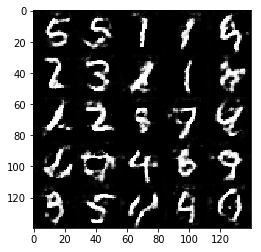

Epoch 1/5... Batch 1010... Discriminator Loss: 1.3917... Generator Loss: 1.8188
Epoch 1/5... Batch 1020... Discriminator Loss: 1.1337... Generator Loss: 0.9734
Epoch 1/5... Batch 1030... Discriminator Loss: 1.7180... Generator Loss: 0.3207
Epoch 1/5... Batch 1040... Discriminator Loss: 1.3522... Generator Loss: 0.5028
Epoch 1/5... Batch 1050... Discriminator Loss: 0.9913... Generator Loss: 0.9104
Epoch 1/5... Batch 1060... Discriminator Loss: 1.5125... Generator Loss: 2.3865
Epoch 1/5... Batch 1070... Discriminator Loss: 1.1802... Generator Loss: 0.6762
Epoch 1/5... Batch 1080... Discriminator Loss: 1.0638... Generator Loss: 1.6888
Epoch 1/5... Batch 1090... Discriminator Loss: 0.9681... Generator Loss: 1.0528
Epoch 1/5... Batch 1100... Discriminator Loss: 1.0758... Generator Loss: 0.7683


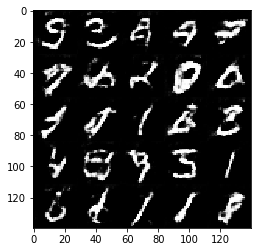

Epoch 1/5... Batch 1110... Discriminator Loss: 1.0389... Generator Loss: 1.6004
Epoch 1/5... Batch 1120... Discriminator Loss: 1.7244... Generator Loss: 2.4127
Epoch 1/5... Batch 1130... Discriminator Loss: 0.9628... Generator Loss: 1.0754
Epoch 1/5... Batch 1140... Discriminator Loss: 0.9972... Generator Loss: 1.0693
Epoch 1/5... Batch 1150... Discriminator Loss: 0.9582... Generator Loss: 0.9996
Epoch 1/5... Batch 1160... Discriminator Loss: 1.0684... Generator Loss: 0.8062
Epoch 1/5... Batch 1170... Discriminator Loss: 1.4228... Generator Loss: 1.3950
Epoch 1/5... Batch 1180... Discriminator Loss: 1.0784... Generator Loss: 0.8132
Epoch 1/5... Batch 1190... Discriminator Loss: 0.8662... Generator Loss: 1.5435
Epoch 1/5... Batch 1200... Discriminator Loss: 0.8737... Generator Loss: 1.7671


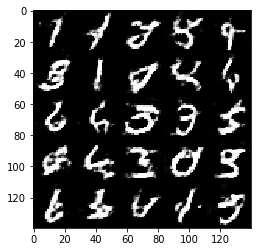

Epoch 1/5... Batch 1210... Discriminator Loss: 0.8743... Generator Loss: 1.3109
Epoch 1/5... Batch 1220... Discriminator Loss: 1.3140... Generator Loss: 2.5477
Epoch 1/5... Batch 1230... Discriminator Loss: 1.0369... Generator Loss: 1.1416
Epoch 1/5... Batch 1240... Discriminator Loss: 1.0427... Generator Loss: 0.8753
Epoch 1/5... Batch 1250... Discriminator Loss: 1.6856... Generator Loss: 0.4251
Epoch 1/5... Batch 1260... Discriminator Loss: 2.1807... Generator Loss: 0.2111
Epoch 1/5... Batch 1270... Discriminator Loss: 1.2459... Generator Loss: 0.5985
Epoch 1/5... Batch 1280... Discriminator Loss: 0.9720... Generator Loss: 0.9505
Epoch 1/5... Batch 1290... Discriminator Loss: 0.9098... Generator Loss: 1.0437
Epoch 1/5... Batch 1300... Discriminator Loss: 1.2794... Generator Loss: 0.5508


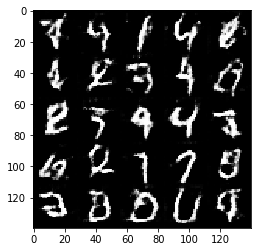

Epoch 1/5... Batch 1310... Discriminator Loss: 1.4055... Generator Loss: 2.3221
Epoch 1/5... Batch 1320... Discriminator Loss: 1.4558... Generator Loss: 0.4625
Epoch 1/5... Batch 1330... Discriminator Loss: 1.0265... Generator Loss: 0.9448
Epoch 1/5... Batch 1340... Discriminator Loss: 1.0595... Generator Loss: 0.7716
Epoch 1/5... Batch 1350... Discriminator Loss: 1.3398... Generator Loss: 0.5284
Epoch 1/5... Batch 1360... Discriminator Loss: 2.1832... Generator Loss: 0.2110
Epoch 1/5... Batch 1370... Discriminator Loss: 0.9485... Generator Loss: 0.9084
Epoch 1/5... Batch 1380... Discriminator Loss: 1.1664... Generator Loss: 0.6248
Epoch 1/5... Batch 1390... Discriminator Loss: 1.0879... Generator Loss: 0.7438
Epoch 1/5... Batch 1400... Discriminator Loss: 1.1506... Generator Loss: 0.6973


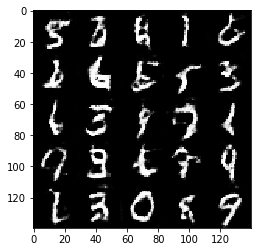

Epoch 1/5... Batch 1410... Discriminator Loss: 1.4941... Generator Loss: 0.4434
Epoch 1/5... Batch 1420... Discriminator Loss: 1.0942... Generator Loss: 0.8663
Epoch 1/5... Batch 1430... Discriminator Loss: 1.1958... Generator Loss: 1.2630
Epoch 1/5... Batch 1440... Discriminator Loss: 1.1508... Generator Loss: 0.7716
Epoch 1/5... Batch 1450... Discriminator Loss: 0.9511... Generator Loss: 0.9375
Epoch 1/5... Batch 1460... Discriminator Loss: 0.8842... Generator Loss: 1.0499
Epoch 1/5... Batch 1470... Discriminator Loss: 1.0556... Generator Loss: 0.8072
Epoch 1/5... Batch 1480... Discriminator Loss: 1.0444... Generator Loss: 0.8530
Epoch 1/5... Batch 1490... Discriminator Loss: 1.0970... Generator Loss: 1.0918
Epoch 1/5... Batch 1500... Discriminator Loss: 1.1455... Generator Loss: 1.3533


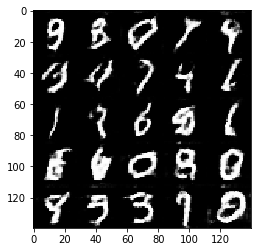

Epoch 1/5... Batch 1510... Discriminator Loss: 1.5207... Generator Loss: 0.4096
Epoch 1/5... Batch 1520... Discriminator Loss: 1.0110... Generator Loss: 0.8435
Epoch 1/5... Batch 1530... Discriminator Loss: 1.1721... Generator Loss: 0.6399
Epoch 1/5... Batch 1540... Discriminator Loss: 0.7634... Generator Loss: 1.4963
Epoch 1/5... Batch 1550... Discriminator Loss: 0.9934... Generator Loss: 0.9123
Epoch 1/5... Batch 1560... Discriminator Loss: 0.9952... Generator Loss: 1.2141
Epoch 1/5... Batch 1570... Discriminator Loss: 1.2995... Generator Loss: 1.7533
Epoch 1/5... Batch 1580... Discriminator Loss: 0.9749... Generator Loss: 1.0319
Epoch 1/5... Batch 1590... Discriminator Loss: 0.9395... Generator Loss: 1.9835
Epoch 1/5... Batch 1600... Discriminator Loss: 1.2353... Generator Loss: 0.6477


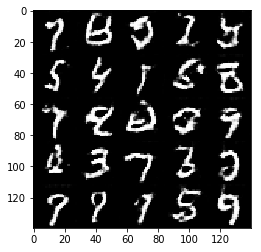

Epoch 1/5... Batch 1610... Discriminator Loss: 1.3451... Generator Loss: 0.5322
Epoch 1/5... Batch 1620... Discriminator Loss: 0.9392... Generator Loss: 0.9686
Epoch 1/5... Batch 1630... Discriminator Loss: 0.7475... Generator Loss: 1.3732
Epoch 1/5... Batch 1640... Discriminator Loss: 0.8987... Generator Loss: 1.5472
Epoch 1/5... Batch 1650... Discriminator Loss: 0.7506... Generator Loss: 1.2175
Epoch 1/5... Batch 1660... Discriminator Loss: 0.8393... Generator Loss: 1.5132
Epoch 1/5... Batch 1670... Discriminator Loss: 0.8621... Generator Loss: 1.4167
Epoch 1/5... Batch 1680... Discriminator Loss: 1.1598... Generator Loss: 0.6707
Epoch 1/5... Batch 1690... Discriminator Loss: 1.1864... Generator Loss: 2.3407
Epoch 1/5... Batch 1700... Discriminator Loss: 0.7723... Generator Loss: 1.1865


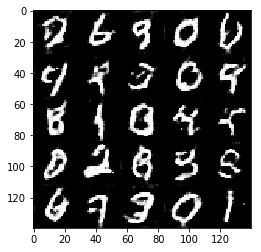

Epoch 1/5... Batch 1710... Discriminator Loss: 0.7932... Generator Loss: 1.1674
Epoch 1/5... Batch 1720... Discriminator Loss: 1.6397... Generator Loss: 2.6913
Epoch 1/5... Batch 1730... Discriminator Loss: 0.9628... Generator Loss: 1.4430
Epoch 1/5... Batch 1740... Discriminator Loss: 1.3167... Generator Loss: 2.5149
Epoch 1/5... Batch 1750... Discriminator Loss: 0.8134... Generator Loss: 1.3090
Epoch 1/5... Batch 1760... Discriminator Loss: 1.0435... Generator Loss: 0.8062
Epoch 1/5... Batch 1770... Discriminator Loss: 1.8524... Generator Loss: 3.4169
Epoch 1/5... Batch 1780... Discriminator Loss: 0.9570... Generator Loss: 0.9003
Epoch 1/5... Batch 1790... Discriminator Loss: 0.9119... Generator Loss: 0.9352
Epoch 1/5... Batch 1800... Discriminator Loss: 0.6400... Generator Loss: 1.5099


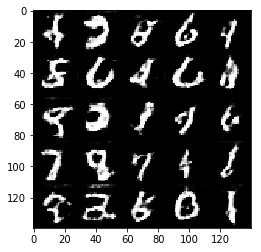

Epoch 1/5... Batch 1810... Discriminator Loss: 1.0339... Generator Loss: 2.0115
Epoch 1/5... Batch 1820... Discriminator Loss: 0.8653... Generator Loss: 1.0803
Epoch 1/5... Batch 1830... Discriminator Loss: 2.2867... Generator Loss: 0.2121
Epoch 1/5... Batch 1840... Discriminator Loss: 0.8353... Generator Loss: 1.3348
Epoch 1/5... Batch 1850... Discriminator Loss: 0.9625... Generator Loss: 0.9416
Epoch 1/5... Batch 1860... Discriminator Loss: 1.4814... Generator Loss: 0.4415
Epoch 1/5... Batch 1870... Discriminator Loss: 0.9330... Generator Loss: 0.8669
Epoch 2/5... Batch 10... Discriminator Loss: 1.5894... Generator Loss: 0.3866
Epoch 2/5... Batch 20... Discriminator Loss: 1.1965... Generator Loss: 0.6161
Epoch 2/5... Batch 30... Discriminator Loss: 0.9429... Generator Loss: 0.8829
Epoch 2/5... Batch 40... Discriminator Loss: 2.0283... Generator Loss: 0.2572
Epoch 2/5... Batch 50... Discriminator Loss: 1.3194... Generator Loss: 0.5275
Epoch 2/5... Batch 60... Discriminator Loss: 1.474

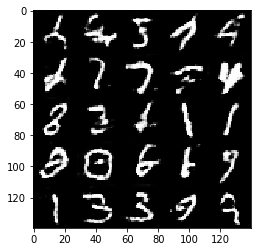

Epoch 2/5... Batch 110... Discriminator Loss: 1.0511... Generator Loss: 0.7888
Epoch 2/5... Batch 120... Discriminator Loss: 0.9165... Generator Loss: 0.9424
Epoch 2/5... Batch 130... Discriminator Loss: 0.9217... Generator Loss: 1.0409
Epoch 2/5... Batch 140... Discriminator Loss: 1.2417... Generator Loss: 0.5669
Epoch 2/5... Batch 150... Discriminator Loss: 0.9799... Generator Loss: 0.8603
Epoch 2/5... Batch 160... Discriminator Loss: 0.7202... Generator Loss: 1.3470
Epoch 2/5... Batch 170... Discriminator Loss: 1.1050... Generator Loss: 0.7481
Epoch 2/5... Batch 180... Discriminator Loss: 1.2180... Generator Loss: 2.0570
Epoch 2/5... Batch 190... Discriminator Loss: 0.7643... Generator Loss: 1.2700
Epoch 2/5... Batch 200... Discriminator Loss: 0.7773... Generator Loss: 1.2042


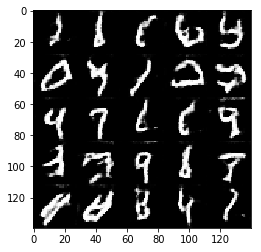

Epoch 2/5... Batch 210... Discriminator Loss: 1.7090... Generator Loss: 0.3266
Epoch 2/5... Batch 220... Discriminator Loss: 1.0359... Generator Loss: 0.7747
Epoch 2/5... Batch 230... Discriminator Loss: 1.0284... Generator Loss: 0.8861
Epoch 2/5... Batch 240... Discriminator Loss: 0.8570... Generator Loss: 1.0369
Epoch 2/5... Batch 250... Discriminator Loss: 1.2063... Generator Loss: 0.6391
Epoch 2/5... Batch 260... Discriminator Loss: 1.0151... Generator Loss: 0.8922
Epoch 2/5... Batch 270... Discriminator Loss: 0.7653... Generator Loss: 1.7086
Epoch 2/5... Batch 280... Discriminator Loss: 0.9097... Generator Loss: 1.9618
Epoch 2/5... Batch 290... Discriminator Loss: 0.9284... Generator Loss: 0.9894
Epoch 2/5... Batch 300... Discriminator Loss: 0.9614... Generator Loss: 0.8802


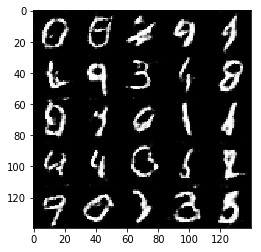

Epoch 2/5... Batch 310... Discriminator Loss: 0.8040... Generator Loss: 1.1179
Epoch 2/5... Batch 320... Discriminator Loss: 1.0691... Generator Loss: 0.7392
Epoch 2/5... Batch 330... Discriminator Loss: 0.7624... Generator Loss: 1.1871
Epoch 2/5... Batch 340... Discriminator Loss: 1.5518... Generator Loss: 0.4048
Epoch 2/5... Batch 350... Discriminator Loss: 0.7743... Generator Loss: 1.3273
Epoch 2/5... Batch 360... Discriminator Loss: 0.8926... Generator Loss: 1.0721
Epoch 2/5... Batch 370... Discriminator Loss: 0.7888... Generator Loss: 1.2802
Epoch 2/5... Batch 380... Discriminator Loss: 1.4487... Generator Loss: 0.4945
Epoch 2/5... Batch 390... Discriminator Loss: 1.1877... Generator Loss: 0.6752
Epoch 2/5... Batch 400... Discriminator Loss: 0.7647... Generator Loss: 1.1842


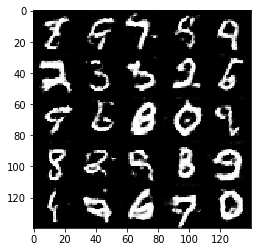

Epoch 2/5... Batch 410... Discriminator Loss: 1.1974... Generator Loss: 0.6444
Epoch 2/5... Batch 420... Discriminator Loss: 1.3966... Generator Loss: 0.6001
Epoch 2/5... Batch 430... Discriminator Loss: 0.8753... Generator Loss: 1.3501
Epoch 2/5... Batch 440... Discriminator Loss: 1.6105... Generator Loss: 0.3960
Epoch 2/5... Batch 450... Discriminator Loss: 0.6946... Generator Loss: 1.4940
Epoch 2/5... Batch 460... Discriminator Loss: 1.5379... Generator Loss: 0.5132
Epoch 2/5... Batch 470... Discriminator Loss: 1.0175... Generator Loss: 0.8815
Epoch 2/5... Batch 480... Discriminator Loss: 0.8478... Generator Loss: 1.5284
Epoch 2/5... Batch 490... Discriminator Loss: 1.7799... Generator Loss: 0.3467
Epoch 2/5... Batch 500... Discriminator Loss: 2.1292... Generator Loss: 0.2724


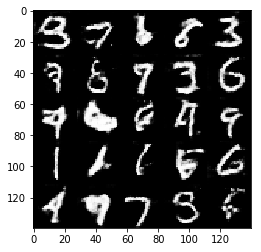

Epoch 2/5... Batch 510... Discriminator Loss: 0.9432... Generator Loss: 1.8178
Epoch 2/5... Batch 520... Discriminator Loss: 0.7824... Generator Loss: 1.2591
Epoch 2/5... Batch 530... Discriminator Loss: 0.7004... Generator Loss: 1.3913
Epoch 2/5... Batch 540... Discriminator Loss: 1.1850... Generator Loss: 0.6390
Epoch 2/5... Batch 550... Discriminator Loss: 0.6626... Generator Loss: 1.6464
Epoch 2/5... Batch 560... Discriminator Loss: 1.0852... Generator Loss: 2.2763
Epoch 2/5... Batch 570... Discriminator Loss: 1.3438... Generator Loss: 2.5434
Epoch 2/5... Batch 580... Discriminator Loss: 1.1324... Generator Loss: 0.6875
Epoch 2/5... Batch 590... Discriminator Loss: 0.7539... Generator Loss: 1.2717
Epoch 2/5... Batch 600... Discriminator Loss: 0.7555... Generator Loss: 1.5712


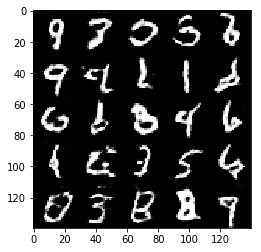

Epoch 2/5... Batch 610... Discriminator Loss: 1.5149... Generator Loss: 0.4708
Epoch 2/5... Batch 620... Discriminator Loss: 0.8823... Generator Loss: 1.0760
Epoch 2/5... Batch 630... Discriminator Loss: 0.7773... Generator Loss: 1.7662
Epoch 2/5... Batch 640... Discriminator Loss: 0.8638... Generator Loss: 0.9966
Epoch 2/5... Batch 650... Discriminator Loss: 0.7205... Generator Loss: 2.1101
Epoch 2/5... Batch 660... Discriminator Loss: 1.1246... Generator Loss: 0.7091
Epoch 2/5... Batch 670... Discriminator Loss: 0.8845... Generator Loss: 0.9941
Epoch 2/5... Batch 680... Discriminator Loss: 0.8517... Generator Loss: 0.9978
Epoch 2/5... Batch 690... Discriminator Loss: 0.9809... Generator Loss: 2.5955
Epoch 2/5... Batch 700... Discriminator Loss: 0.6198... Generator Loss: 1.9225


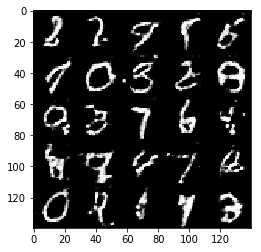

Epoch 2/5... Batch 710... Discriminator Loss: 0.9691... Generator Loss: 0.9010
Epoch 2/5... Batch 720... Discriminator Loss: 0.7193... Generator Loss: 1.8375
Epoch 2/5... Batch 730... Discriminator Loss: 0.8929... Generator Loss: 0.9758
Epoch 2/5... Batch 740... Discriminator Loss: 0.7606... Generator Loss: 1.2587
Epoch 2/5... Batch 750... Discriminator Loss: 1.1950... Generator Loss: 0.6780
Epoch 2/5... Batch 760... Discriminator Loss: 0.6331... Generator Loss: 1.7794
Epoch 2/5... Batch 770... Discriminator Loss: 1.1978... Generator Loss: 2.2831
Epoch 2/5... Batch 780... Discriminator Loss: 0.8677... Generator Loss: 1.0101
Epoch 2/5... Batch 790... Discriminator Loss: 0.8404... Generator Loss: 1.1440
Epoch 2/5... Batch 800... Discriminator Loss: 1.0487... Generator Loss: 0.7679


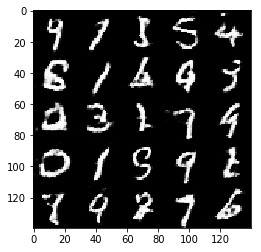

Epoch 2/5... Batch 810... Discriminator Loss: 0.6628... Generator Loss: 1.4696
Epoch 2/5... Batch 820... Discriminator Loss: 0.7299... Generator Loss: 1.2351
Epoch 2/5... Batch 830... Discriminator Loss: 0.7905... Generator Loss: 1.1023
Epoch 2/5... Batch 840... Discriminator Loss: 0.7286... Generator Loss: 1.2810
Epoch 2/5... Batch 850... Discriminator Loss: 0.7429... Generator Loss: 1.3126
Epoch 2/5... Batch 860... Discriminator Loss: 2.5591... Generator Loss: 4.1236
Epoch 2/5... Batch 870... Discriminator Loss: 1.0546... Generator Loss: 0.7754
Epoch 2/5... Batch 880... Discriminator Loss: 1.0341... Generator Loss: 0.7806
Epoch 2/5... Batch 890... Discriminator Loss: 0.6655... Generator Loss: 1.4607
Epoch 2/5... Batch 900... Discriminator Loss: 1.8244... Generator Loss: 0.3638


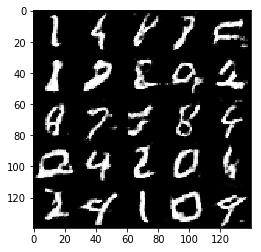

Epoch 2/5... Batch 910... Discriminator Loss: 0.6550... Generator Loss: 1.4872
Epoch 2/5... Batch 920... Discriminator Loss: 0.8789... Generator Loss: 1.0496
Epoch 2/5... Batch 930... Discriminator Loss: 2.8297... Generator Loss: 0.1398
Epoch 2/5... Batch 940... Discriminator Loss: 1.5884... Generator Loss: 0.4106
Epoch 2/5... Batch 950... Discriminator Loss: 0.8260... Generator Loss: 1.0526
Epoch 2/5... Batch 960... Discriminator Loss: 0.7109... Generator Loss: 1.5030
Epoch 2/5... Batch 970... Discriminator Loss: 0.8347... Generator Loss: 1.0663
Epoch 2/5... Batch 980... Discriminator Loss: 0.7881... Generator Loss: 1.6324
Epoch 2/5... Batch 990... Discriminator Loss: 0.8627... Generator Loss: 1.0199
Epoch 2/5... Batch 1000... Discriminator Loss: 0.7802... Generator Loss: 1.2181


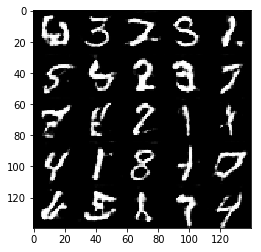

Epoch 2/5... Batch 1010... Discriminator Loss: 0.8345... Generator Loss: 1.2838
Epoch 2/5... Batch 1020... Discriminator Loss: 1.3463... Generator Loss: 0.5964
Epoch 2/5... Batch 1030... Discriminator Loss: 1.6808... Generator Loss: 0.4718
Epoch 2/5... Batch 1040... Discriminator Loss: 1.1253... Generator Loss: 0.7252
Epoch 2/5... Batch 1050... Discriminator Loss: 0.6369... Generator Loss: 1.6430
Epoch 2/5... Batch 1060... Discriminator Loss: 0.7153... Generator Loss: 1.4010
Epoch 2/5... Batch 1070... Discriminator Loss: 0.6167... Generator Loss: 1.5888
Epoch 2/5... Batch 1080... Discriminator Loss: 0.8561... Generator Loss: 1.0380
Epoch 2/5... Batch 1090... Discriminator Loss: 0.6615... Generator Loss: 1.5148
Epoch 2/5... Batch 1100... Discriminator Loss: 1.2013... Generator Loss: 0.6581


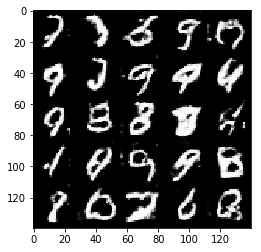

Epoch 2/5... Batch 1110... Discriminator Loss: 1.2950... Generator Loss: 0.5985
Epoch 2/5... Batch 1120... Discriminator Loss: 1.2064... Generator Loss: 0.6320
Epoch 2/5... Batch 1130... Discriminator Loss: 0.8414... Generator Loss: 1.2636
Epoch 2/5... Batch 1140... Discriminator Loss: 1.4552... Generator Loss: 0.4860
Epoch 2/5... Batch 1150... Discriminator Loss: 0.8858... Generator Loss: 0.9957
Epoch 2/5... Batch 1160... Discriminator Loss: 1.1275... Generator Loss: 0.6842
Epoch 2/5... Batch 1170... Discriminator Loss: 1.0456... Generator Loss: 0.7823
Epoch 2/5... Batch 1180... Discriminator Loss: 0.7495... Generator Loss: 1.2397
Epoch 2/5... Batch 1190... Discriminator Loss: 0.6266... Generator Loss: 1.5781
Epoch 2/5... Batch 1200... Discriminator Loss: 0.7696... Generator Loss: 1.1862


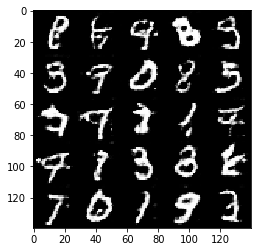

Epoch 2/5... Batch 1210... Discriminator Loss: 0.7075... Generator Loss: 1.4423
Epoch 2/5... Batch 1220... Discriminator Loss: 1.3192... Generator Loss: 2.9106
Epoch 2/5... Batch 1230... Discriminator Loss: 0.9652... Generator Loss: 2.1447
Epoch 2/5... Batch 1240... Discriminator Loss: 0.6775... Generator Loss: 1.4346
Epoch 2/5... Batch 1250... Discriminator Loss: 0.6775... Generator Loss: 1.8375
Epoch 2/5... Batch 1260... Discriminator Loss: 0.6811... Generator Loss: 1.8985
Epoch 2/5... Batch 1270... Discriminator Loss: 0.6858... Generator Loss: 1.5367
Epoch 2/5... Batch 1280... Discriminator Loss: 0.8756... Generator Loss: 1.0639
Epoch 2/5... Batch 1290... Discriminator Loss: 0.8349... Generator Loss: 1.0979
Epoch 2/5... Batch 1300... Discriminator Loss: 1.4723... Generator Loss: 0.4720


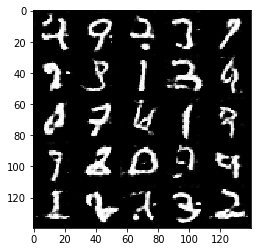

Epoch 2/5... Batch 1310... Discriminator Loss: 0.7119... Generator Loss: 1.3403
Epoch 2/5... Batch 1320... Discriminator Loss: 0.9126... Generator Loss: 0.9276
Epoch 2/5... Batch 1330... Discriminator Loss: 1.0519... Generator Loss: 0.8033
Epoch 2/5... Batch 1340... Discriminator Loss: 1.8475... Generator Loss: 0.3924
Epoch 2/5... Batch 1350... Discriminator Loss: 0.9433... Generator Loss: 0.8903
Epoch 2/5... Batch 1360... Discriminator Loss: 1.4843... Generator Loss: 0.4944
Epoch 2/5... Batch 1370... Discriminator Loss: 0.7357... Generator Loss: 1.4794
Epoch 2/5... Batch 1380... Discriminator Loss: 0.7407... Generator Loss: 1.2877
Epoch 2/5... Batch 1390... Discriminator Loss: 0.8003... Generator Loss: 1.2230
Epoch 2/5... Batch 1400... Discriminator Loss: 1.3587... Generator Loss: 0.5258


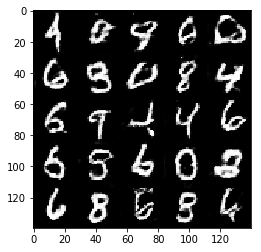

Epoch 2/5... Batch 1410... Discriminator Loss: 1.1573... Generator Loss: 0.7031
Epoch 2/5... Batch 1420... Discriminator Loss: 2.7432... Generator Loss: 3.8479
Epoch 2/5... Batch 1430... Discriminator Loss: 0.8830... Generator Loss: 1.7730
Epoch 2/5... Batch 1440... Discriminator Loss: 0.8114... Generator Loss: 1.1582
Epoch 2/5... Batch 1450... Discriminator Loss: 0.9201... Generator Loss: 0.9451
Epoch 2/5... Batch 1460... Discriminator Loss: 0.6953... Generator Loss: 1.4093
Epoch 2/5... Batch 1470... Discriminator Loss: 1.2260... Generator Loss: 0.6624
Epoch 2/5... Batch 1480... Discriminator Loss: 0.7380... Generator Loss: 1.3321
Epoch 2/5... Batch 1490... Discriminator Loss: 1.0636... Generator Loss: 2.1439
Epoch 2/5... Batch 1500... Discriminator Loss: 0.9422... Generator Loss: 1.2416


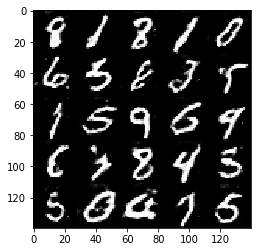

Epoch 2/5... Batch 1510... Discriminator Loss: 1.4273... Generator Loss: 0.5062
Epoch 2/5... Batch 1520... Discriminator Loss: 0.7443... Generator Loss: 1.2665
Epoch 2/5... Batch 1530... Discriminator Loss: 0.9653... Generator Loss: 0.9298
Epoch 2/5... Batch 1540... Discriminator Loss: 0.5358... Generator Loss: 2.4082
Epoch 2/5... Batch 1550... Discriminator Loss: 0.7428... Generator Loss: 1.2473
Epoch 2/5... Batch 1560... Discriminator Loss: 0.7319... Generator Loss: 2.3929
Epoch 2/5... Batch 1570... Discriminator Loss: 0.7920... Generator Loss: 1.2587
Epoch 2/5... Batch 1580... Discriminator Loss: 1.8635... Generator Loss: 0.3271
Epoch 2/5... Batch 1590... Discriminator Loss: 1.2741... Generator Loss: 0.5931
Epoch 2/5... Batch 1600... Discriminator Loss: 1.1963... Generator Loss: 0.6423


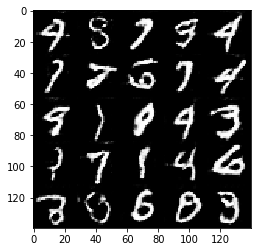

Epoch 2/5... Batch 1610... Discriminator Loss: 1.6109... Generator Loss: 0.4625
Epoch 2/5... Batch 1620... Discriminator Loss: 1.2943... Generator Loss: 0.6488
Epoch 2/5... Batch 1630... Discriminator Loss: 0.7164... Generator Loss: 1.6652
Epoch 2/5... Batch 1640... Discriminator Loss: 1.1463... Generator Loss: 0.7090
Epoch 2/5... Batch 1650... Discriminator Loss: 0.5665... Generator Loss: 2.3538
Epoch 2/5... Batch 1660... Discriminator Loss: 0.6807... Generator Loss: 1.4562
Epoch 2/5... Batch 1670... Discriminator Loss: 1.0710... Generator Loss: 0.7193
Epoch 2/5... Batch 1680... Discriminator Loss: 0.5268... Generator Loss: 1.9161
Epoch 2/5... Batch 1690... Discriminator Loss: 1.1048... Generator Loss: 0.8171
Epoch 2/5... Batch 1700... Discriminator Loss: 0.5511... Generator Loss: 1.9243


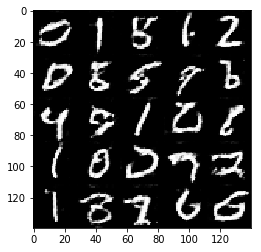

Epoch 2/5... Batch 1710... Discriminator Loss: 0.6142... Generator Loss: 1.5901
Epoch 2/5... Batch 1720... Discriminator Loss: 0.6382... Generator Loss: 2.9429
Epoch 2/5... Batch 1730... Discriminator Loss: 1.7052... Generator Loss: 0.4060
Epoch 2/5... Batch 1740... Discriminator Loss: 1.2693... Generator Loss: 2.2117
Epoch 2/5... Batch 1750... Discriminator Loss: 0.6403... Generator Loss: 1.6070
Epoch 2/5... Batch 1760... Discriminator Loss: 1.3953... Generator Loss: 0.5436
Epoch 2/5... Batch 1770... Discriminator Loss: 1.0466... Generator Loss: 1.9567
Epoch 2/5... Batch 1780... Discriminator Loss: 0.6144... Generator Loss: 2.3297
Epoch 2/5... Batch 1790... Discriminator Loss: 0.6919... Generator Loss: 1.3710
Epoch 2/5... Batch 1800... Discriminator Loss: 0.5412... Generator Loss: 2.4155


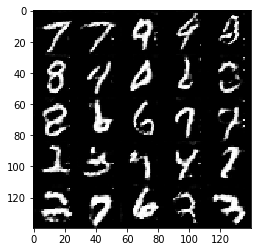

Epoch 2/5... Batch 1810... Discriminator Loss: 0.7314... Generator Loss: 2.1883
Epoch 2/5... Batch 1820... Discriminator Loss: 0.4815... Generator Loss: 2.1740
Epoch 2/5... Batch 1830... Discriminator Loss: 1.6359... Generator Loss: 0.3951
Epoch 2/5... Batch 1840... Discriminator Loss: 0.7135... Generator Loss: 1.3902
Epoch 2/5... Batch 1850... Discriminator Loss: 0.7172... Generator Loss: 1.4330
Epoch 2/5... Batch 1860... Discriminator Loss: 1.2480... Generator Loss: 0.6733
Epoch 2/5... Batch 1870... Discriminator Loss: 0.5558... Generator Loss: 1.8885
Epoch 3/5... Batch 10... Discriminator Loss: 1.1681... Generator Loss: 0.7729
Epoch 3/5... Batch 20... Discriminator Loss: 1.5587... Generator Loss: 0.4405
Epoch 3/5... Batch 30... Discriminator Loss: 2.7157... Generator Loss: 0.1594
Epoch 3/5... Batch 40... Discriminator Loss: 0.8199... Generator Loss: 1.2288
Epoch 3/5... Batch 50... Discriminator Loss: 0.6744... Generator Loss: 1.6582
Epoch 3/5... Batch 60... Discriminator Loss: 1.481

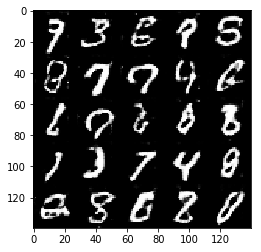

Epoch 3/5... Batch 110... Discriminator Loss: 0.7903... Generator Loss: 1.1216
Epoch 3/5... Batch 120... Discriminator Loss: 0.5549... Generator Loss: 1.9770
Epoch 3/5... Batch 130... Discriminator Loss: 1.4794... Generator Loss: 0.4889
Epoch 3/5... Batch 140... Discriminator Loss: 1.1868... Generator Loss: 0.6481
Epoch 3/5... Batch 150... Discriminator Loss: 0.9378... Generator Loss: 0.9085
Epoch 3/5... Batch 160... Discriminator Loss: 0.6452... Generator Loss: 1.5479
Epoch 3/5... Batch 170... Discriminator Loss: 1.6225... Generator Loss: 0.4463
Epoch 3/5... Batch 180... Discriminator Loss: 0.9240... Generator Loss: 0.9476
Epoch 3/5... Batch 190... Discriminator Loss: 0.4960... Generator Loss: 2.0413
Epoch 3/5... Batch 200... Discriminator Loss: 0.8116... Generator Loss: 1.0963


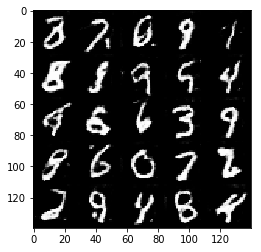

Epoch 3/5... Batch 210... Discriminator Loss: 0.9279... Generator Loss: 1.0886
Epoch 3/5... Batch 220... Discriminator Loss: 0.9988... Generator Loss: 0.8436
Epoch 3/5... Batch 230... Discriminator Loss: 0.6519... Generator Loss: 1.4372
Epoch 3/5... Batch 240... Discriminator Loss: 0.7182... Generator Loss: 1.2872
Epoch 3/5... Batch 250... Discriminator Loss: 0.8195... Generator Loss: 1.1500
Epoch 3/5... Batch 260... Discriminator Loss: 0.5361... Generator Loss: 1.9019
Epoch 3/5... Batch 270... Discriminator Loss: 0.7023... Generator Loss: 2.7170
Epoch 3/5... Batch 280... Discriminator Loss: 0.7481... Generator Loss: 1.2280
Epoch 3/5... Batch 290... Discriminator Loss: 0.6982... Generator Loss: 1.6059
Epoch 3/5... Batch 300... Discriminator Loss: 1.0582... Generator Loss: 0.9068


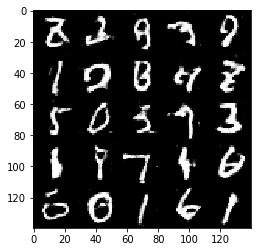

Epoch 3/5... Batch 310... Discriminator Loss: 0.5325... Generator Loss: 2.0242
Epoch 3/5... Batch 320... Discriminator Loss: 1.0816... Generator Loss: 0.8246
Epoch 3/5... Batch 330... Discriminator Loss: 0.6403... Generator Loss: 1.9598
Epoch 3/5... Batch 340... Discriminator Loss: 0.8708... Generator Loss: 1.8811
Epoch 3/5... Batch 350... Discriminator Loss: 0.7327... Generator Loss: 1.2994
Epoch 3/5... Batch 360... Discriminator Loss: 0.6890... Generator Loss: 1.3906
Epoch 3/5... Batch 370... Discriminator Loss: 0.8864... Generator Loss: 0.9827
Epoch 3/5... Batch 380... Discriminator Loss: 1.0389... Generator Loss: 0.7863
Epoch 3/5... Batch 390... Discriminator Loss: 0.7410... Generator Loss: 1.2637
Epoch 3/5... Batch 400... Discriminator Loss: 0.7405... Generator Loss: 1.2742


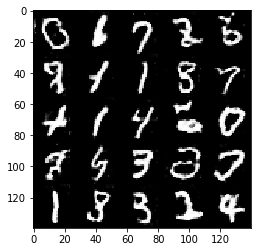

Epoch 3/5... Batch 410... Discriminator Loss: 0.9874... Generator Loss: 0.8767
Epoch 3/5... Batch 420... Discriminator Loss: 0.6246... Generator Loss: 2.1169
Epoch 3/5... Batch 430... Discriminator Loss: 1.5554... Generator Loss: 0.5158
Epoch 3/5... Batch 440... Discriminator Loss: 1.8344... Generator Loss: 0.3687
Epoch 3/5... Batch 450... Discriminator Loss: 0.6003... Generator Loss: 1.7233
Epoch 3/5... Batch 460... Discriminator Loss: 0.8680... Generator Loss: 1.0496
Epoch 3/5... Batch 470... Discriminator Loss: 0.7749... Generator Loss: 1.2321
Epoch 3/5... Batch 480... Discriminator Loss: 0.7462... Generator Loss: 1.2793
Epoch 3/5... Batch 490... Discriminator Loss: 0.7062... Generator Loss: 1.3496
Epoch 3/5... Batch 500... Discriminator Loss: 0.6195... Generator Loss: 1.5774


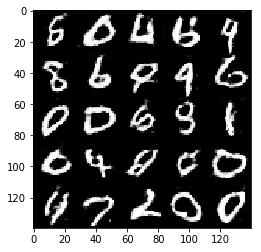

Epoch 3/5... Batch 510... Discriminator Loss: 0.7120... Generator Loss: 2.3769
Epoch 3/5... Batch 520... Discriminator Loss: 0.6004... Generator Loss: 1.6359
Epoch 3/5... Batch 530... Discriminator Loss: 0.7687... Generator Loss: 1.1897
Epoch 3/5... Batch 540... Discriminator Loss: 0.9258... Generator Loss: 1.0018
Epoch 3/5... Batch 550... Discriminator Loss: 0.5199... Generator Loss: 2.3883
Epoch 3/5... Batch 560... Discriminator Loss: 0.6779... Generator Loss: 1.7333
Epoch 3/5... Batch 570... Discriminator Loss: 0.8478... Generator Loss: 1.9244
Epoch 3/5... Batch 580... Discriminator Loss: 0.5689... Generator Loss: 2.5624
Epoch 3/5... Batch 590... Discriminator Loss: 0.8413... Generator Loss: 2.5684
Epoch 3/5... Batch 600... Discriminator Loss: 1.1692... Generator Loss: 0.7371


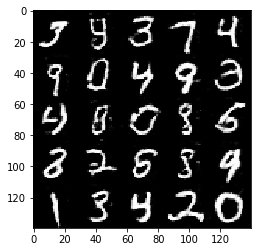

Epoch 3/5... Batch 610... Discriminator Loss: 0.8028... Generator Loss: 1.0879
Epoch 3/5... Batch 620... Discriminator Loss: 0.7085... Generator Loss: 1.2670
Epoch 3/5... Batch 630... Discriminator Loss: 1.4519... Generator Loss: 2.7280
Epoch 3/5... Batch 640... Discriminator Loss: 1.3320... Generator Loss: 3.0984
Epoch 3/5... Batch 650... Discriminator Loss: 0.6201... Generator Loss: 1.9993
Epoch 3/5... Batch 660... Discriminator Loss: 0.7912... Generator Loss: 1.2817
Epoch 3/5... Batch 670... Discriminator Loss: 0.6306... Generator Loss: 2.0073
Epoch 3/5... Batch 680... Discriminator Loss: 0.9923... Generator Loss: 2.6214
Epoch 3/5... Batch 690... Discriminator Loss: 0.8361... Generator Loss: 1.0763
Epoch 3/5... Batch 700... Discriminator Loss: 0.5697... Generator Loss: 2.0926


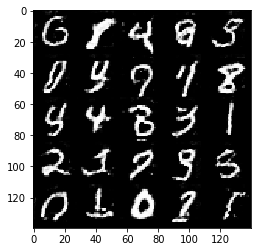

Epoch 3/5... Batch 710... Discriminator Loss: 0.7760... Generator Loss: 1.1872
Epoch 3/5... Batch 720... Discriminator Loss: 0.7169... Generator Loss: 1.3440
Epoch 3/5... Batch 730... Discriminator Loss: 0.9178... Generator Loss: 0.9663
Epoch 3/5... Batch 740... Discriminator Loss: 0.6763... Generator Loss: 1.4162
Epoch 3/5... Batch 750... Discriminator Loss: 0.5781... Generator Loss: 2.1339
Epoch 3/5... Batch 760... Discriminator Loss: 0.5769... Generator Loss: 1.9749
Epoch 3/5... Batch 770... Discriminator Loss: 2.7781... Generator Loss: 5.3385
Epoch 3/5... Batch 780... Discriminator Loss: 0.8686... Generator Loss: 1.4291
Epoch 3/5... Batch 790... Discriminator Loss: 0.7949... Generator Loss: 1.5027
Epoch 3/5... Batch 800... Discriminator Loss: 1.0596... Generator Loss: 0.7858


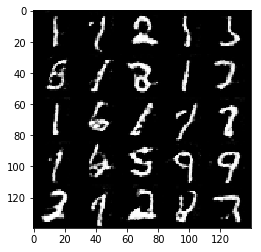

Epoch 3/5... Batch 810... Discriminator Loss: 0.6410... Generator Loss: 1.5950
Epoch 3/5... Batch 820... Discriminator Loss: 0.7528... Generator Loss: 1.2606
Epoch 3/5... Batch 830... Discriminator Loss: 1.2896... Generator Loss: 0.6070
Epoch 3/5... Batch 840... Discriminator Loss: 0.8356... Generator Loss: 1.1045
Epoch 3/5... Batch 850... Discriminator Loss: 1.0137... Generator Loss: 0.8831
Epoch 3/5... Batch 860... Discriminator Loss: 0.6388... Generator Loss: 2.1991
Epoch 3/5... Batch 870... Discriminator Loss: 1.0616... Generator Loss: 0.8534
Epoch 3/5... Batch 880... Discriminator Loss: 1.2738... Generator Loss: 0.6259
Epoch 3/5... Batch 890... Discriminator Loss: 0.5541... Generator Loss: 1.7818
Epoch 3/5... Batch 900... Discriminator Loss: 1.2846... Generator Loss: 0.6311


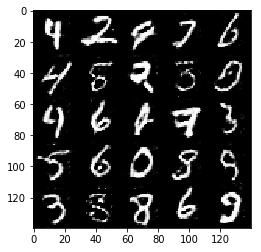

Epoch 3/5... Batch 910... Discriminator Loss: 2.2888... Generator Loss: 0.3428
Epoch 3/5... Batch 920... Discriminator Loss: 1.2980... Generator Loss: 0.8978
Epoch 3/5... Batch 930... Discriminator Loss: 1.4878... Generator Loss: 0.4652
Epoch 3/5... Batch 940... Discriminator Loss: 0.8870... Generator Loss: 1.0118
Epoch 3/5... Batch 950... Discriminator Loss: 0.7357... Generator Loss: 1.2751
Epoch 3/5... Batch 960... Discriminator Loss: 0.6501... Generator Loss: 1.5190
Epoch 3/5... Batch 970... Discriminator Loss: 0.8456... Generator Loss: 1.0899
Epoch 3/5... Batch 980... Discriminator Loss: 0.7484... Generator Loss: 1.2170
Epoch 3/5... Batch 990... Discriminator Loss: 0.9542... Generator Loss: 0.9622
Epoch 3/5... Batch 1000... Discriminator Loss: 0.8135... Generator Loss: 1.1807


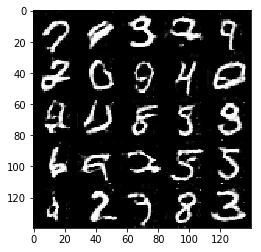

Epoch 3/5... Batch 1010... Discriminator Loss: 0.6461... Generator Loss: 1.4402
Epoch 3/5... Batch 1020... Discriminator Loss: 0.6697... Generator Loss: 1.4458
Epoch 3/5... Batch 1030... Discriminator Loss: 0.9748... Generator Loss: 1.0656
Epoch 3/5... Batch 1040... Discriminator Loss: 0.6545... Generator Loss: 1.6798
Epoch 3/5... Batch 1050... Discriminator Loss: 0.7429... Generator Loss: 1.6140
Epoch 3/5... Batch 1060... Discriminator Loss: 1.2573... Generator Loss: 0.7258
Epoch 3/5... Batch 1070... Discriminator Loss: 0.5412... Generator Loss: 1.9425
Epoch 3/5... Batch 1080... Discriminator Loss: 0.6227... Generator Loss: 1.5856
Epoch 3/5... Batch 1090... Discriminator Loss: 0.5485... Generator Loss: 1.8070
Epoch 3/5... Batch 1100... Discriminator Loss: 1.0287... Generator Loss: 0.9150


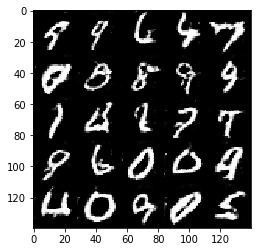

Epoch 3/5... Batch 1110... Discriminator Loss: 0.7950... Generator Loss: 1.1440
Epoch 3/5... Batch 1120... Discriminator Loss: 0.7529... Generator Loss: 1.1915
Epoch 3/5... Batch 1130... Discriminator Loss: 0.5800... Generator Loss: 2.7121
Epoch 3/5... Batch 1140... Discriminator Loss: 0.5912... Generator Loss: 1.6340
Epoch 3/5... Batch 1150... Discriminator Loss: 0.6676... Generator Loss: 1.6187
Epoch 3/5... Batch 1160... Discriminator Loss: 0.7119... Generator Loss: 1.3340
Epoch 3/5... Batch 1170... Discriminator Loss: 1.2915... Generator Loss: 0.6551
Epoch 3/5... Batch 1180... Discriminator Loss: 2.4434... Generator Loss: 0.2188
Epoch 3/5... Batch 1190... Discriminator Loss: 0.5683... Generator Loss: 1.7612
Epoch 3/5... Batch 1200... Discriminator Loss: 1.0477... Generator Loss: 0.8227


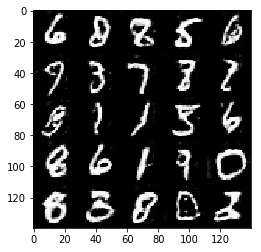

Epoch 3/5... Batch 1210... Discriminator Loss: 0.8579... Generator Loss: 0.9784
Epoch 3/5... Batch 1220... Discriminator Loss: 0.6347... Generator Loss: 2.2520
Epoch 3/5... Batch 1230... Discriminator Loss: 0.7016... Generator Loss: 1.3664
Epoch 3/5... Batch 1240... Discriminator Loss: 0.9804... Generator Loss: 0.9456
Epoch 3/5... Batch 1250... Discriminator Loss: 0.7196... Generator Loss: 1.3685
Epoch 3/5... Batch 1260... Discriminator Loss: 0.6470... Generator Loss: 1.5225
Epoch 3/5... Batch 1270... Discriminator Loss: 1.1487... Generator Loss: 0.7521
Epoch 3/5... Batch 1280... Discriminator Loss: 0.7259... Generator Loss: 1.4500
Epoch 3/5... Batch 1290... Discriminator Loss: 0.6250... Generator Loss: 1.5457
Epoch 3/5... Batch 1300... Discriminator Loss: 0.6306... Generator Loss: 1.8398


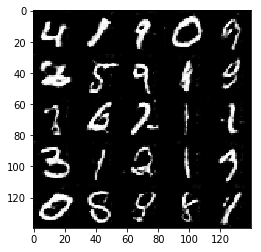

Epoch 3/5... Batch 1310... Discriminator Loss: 0.7111... Generator Loss: 2.1150
Epoch 3/5... Batch 1320... Discriminator Loss: 1.1749... Generator Loss: 0.7139
Epoch 3/5... Batch 1330... Discriminator Loss: 0.6026... Generator Loss: 1.7088
Epoch 3/5... Batch 1340... Discriminator Loss: 0.6041... Generator Loss: 1.6473
Epoch 3/5... Batch 1350... Discriminator Loss: 0.7572... Generator Loss: 1.2347
Epoch 3/5... Batch 1360... Discriminator Loss: 2.4278... Generator Loss: 0.2148
Epoch 3/5... Batch 1370... Discriminator Loss: 1.0235... Generator Loss: 0.9924
Epoch 3/5... Batch 1380... Discriminator Loss: 0.5100... Generator Loss: 2.2323
Epoch 3/5... Batch 1390... Discriminator Loss: 0.5251... Generator Loss: 1.9860
Epoch 3/5... Batch 1400... Discriminator Loss: 0.8874... Generator Loss: 0.9818


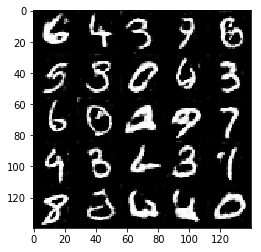

Epoch 3/5... Batch 1410... Discriminator Loss: 1.5632... Generator Loss: 0.6218
Epoch 3/5... Batch 1420... Discriminator Loss: 0.7440... Generator Loss: 2.0459
Epoch 3/5... Batch 1430... Discriminator Loss: 0.8815... Generator Loss: 1.0285
Epoch 3/5... Batch 1440... Discriminator Loss: 0.8859... Generator Loss: 0.9786
Epoch 3/5... Batch 1450... Discriminator Loss: 0.5503... Generator Loss: 1.9179
Epoch 3/5... Batch 1460... Discriminator Loss: 0.5522... Generator Loss: 1.8664
Epoch 3/5... Batch 1470... Discriminator Loss: 1.0353... Generator Loss: 0.8097
Epoch 3/5... Batch 1480... Discriminator Loss: 0.7728... Generator Loss: 1.2766
Epoch 3/5... Batch 1490... Discriminator Loss: 2.1096... Generator Loss: 0.3814
Epoch 3/5... Batch 1500... Discriminator Loss: 0.8901... Generator Loss: 1.2491


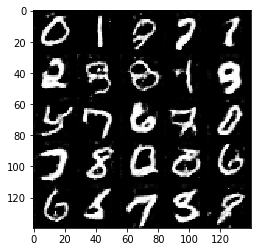

Epoch 3/5... Batch 1510... Discriminator Loss: 1.4427... Generator Loss: 0.6106
Epoch 3/5... Batch 1520... Discriminator Loss: 0.9898... Generator Loss: 0.9271
Epoch 3/5... Batch 1530... Discriminator Loss: 0.8401... Generator Loss: 1.0951
Epoch 3/5... Batch 1540... Discriminator Loss: 0.6617... Generator Loss: 2.2132
Epoch 3/5... Batch 1550... Discriminator Loss: 0.9938... Generator Loss: 0.8066
Epoch 3/5... Batch 1560... Discriminator Loss: 0.8875... Generator Loss: 1.0379
Epoch 3/5... Batch 1570... Discriminator Loss: 0.7184... Generator Loss: 1.3029
Epoch 3/5... Batch 1580... Discriminator Loss: 0.8626... Generator Loss: 1.1358
Epoch 3/5... Batch 1590... Discriminator Loss: 2.2448... Generator Loss: 0.2315
Epoch 3/5... Batch 1600... Discriminator Loss: 1.7260... Generator Loss: 0.4709


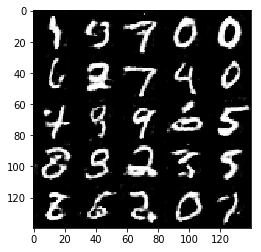

Epoch 3/5... Batch 1610... Discriminator Loss: 0.9116... Generator Loss: 0.8982
Epoch 3/5... Batch 1620... Discriminator Loss: 1.6418... Generator Loss: 0.4712
Epoch 3/5... Batch 1630... Discriminator Loss: 0.6195... Generator Loss: 1.5204
Epoch 3/5... Batch 1640... Discriminator Loss: 0.6477... Generator Loss: 1.3981
Epoch 3/5... Batch 1650... Discriminator Loss: 0.4567... Generator Loss: 2.6314
Epoch 3/5... Batch 1660... Discriminator Loss: 0.5677... Generator Loss: 1.8506
Epoch 3/5... Batch 1670... Discriminator Loss: 1.7029... Generator Loss: 0.3724
Epoch 3/5... Batch 1680... Discriminator Loss: 0.4757... Generator Loss: 2.3716
Epoch 3/5... Batch 1690... Discriminator Loss: 1.3937... Generator Loss: 0.7003
Epoch 3/5... Batch 1700... Discriminator Loss: 0.8294... Generator Loss: 1.1693


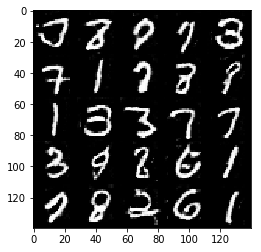

Epoch 3/5... Batch 1710... Discriminator Loss: 0.5269... Generator Loss: 1.9869
Epoch 3/5... Batch 1720... Discriminator Loss: 0.7788... Generator Loss: 3.4995
Epoch 3/5... Batch 1730... Discriminator Loss: 0.6707... Generator Loss: 1.9233
Epoch 3/5... Batch 1740... Discriminator Loss: 1.5955... Generator Loss: 3.7228
Epoch 3/5... Batch 1750... Discriminator Loss: 0.8428... Generator Loss: 1.2248
Epoch 3/5... Batch 1760... Discriminator Loss: 1.6262... Generator Loss: 0.4430
Epoch 3/5... Batch 1770... Discriminator Loss: 1.0542... Generator Loss: 0.7757
Epoch 3/5... Batch 1780... Discriminator Loss: 0.5814... Generator Loss: 1.6451
Epoch 3/5... Batch 1790... Discriminator Loss: 0.8105... Generator Loss: 1.1027
Epoch 3/5... Batch 1800... Discriminator Loss: 0.4933... Generator Loss: 2.5399


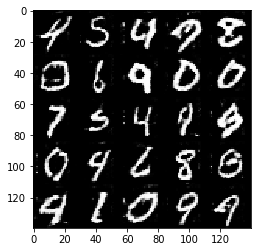

Epoch 3/5... Batch 1810... Discriminator Loss: 0.4894... Generator Loss: 2.1816
Epoch 3/5... Batch 1820... Discriminator Loss: 0.6172... Generator Loss: 1.5297
Epoch 3/5... Batch 1830... Discriminator Loss: 1.4199... Generator Loss: 0.5461
Epoch 3/5... Batch 1840... Discriminator Loss: 0.7944... Generator Loss: 1.1147
Epoch 3/5... Batch 1850... Discriminator Loss: 0.7020... Generator Loss: 1.3839
Epoch 3/5... Batch 1860... Discriminator Loss: 1.7430... Generator Loss: 0.4714
Epoch 3/5... Batch 1870... Discriminator Loss: 0.5796... Generator Loss: 1.7700
Epoch 4/5... Batch 10... Discriminator Loss: 1.0017... Generator Loss: 1.1163
Epoch 4/5... Batch 20... Discriminator Loss: 0.8105... Generator Loss: 1.1220
Epoch 4/5... Batch 30... Discriminator Loss: 0.6913... Generator Loss: 1.5920
Epoch 4/5... Batch 40... Discriminator Loss: 0.7041... Generator Loss: 1.3759
Epoch 4/5... Batch 50... Discriminator Loss: 0.5955... Generator Loss: 1.6687
Epoch 4/5... Batch 60... Discriminator Loss: 1.769

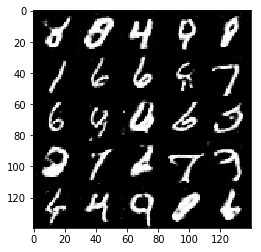

Epoch 4/5... Batch 110... Discriminator Loss: 0.6215... Generator Loss: 1.5607
Epoch 4/5... Batch 120... Discriminator Loss: 0.8863... Generator Loss: 0.9349
Epoch 4/5... Batch 130... Discriminator Loss: 0.7042... Generator Loss: 1.3990
Epoch 4/5... Batch 140... Discriminator Loss: 0.6167... Generator Loss: 1.6157
Epoch 4/5... Batch 150... Discriminator Loss: 0.6712... Generator Loss: 1.5289
Epoch 4/5... Batch 160... Discriminator Loss: 0.5238... Generator Loss: 1.9416
Epoch 4/5... Batch 170... Discriminator Loss: 1.2604... Generator Loss: 0.6178
Epoch 4/5... Batch 180... Discriminator Loss: 1.2418... Generator Loss: 0.7176
Epoch 4/5... Batch 190... Discriminator Loss: 0.5608... Generator Loss: 1.8102
Epoch 4/5... Batch 200... Discriminator Loss: 0.6788... Generator Loss: 1.4017


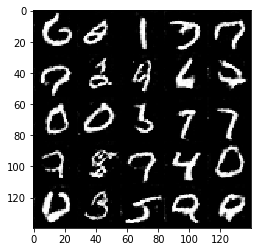

Epoch 4/5... Batch 210... Discriminator Loss: 2.7712... Generator Loss: 0.1536
Epoch 4/5... Batch 220... Discriminator Loss: 0.7492... Generator Loss: 1.2121
Epoch 4/5... Batch 230... Discriminator Loss: 0.5575... Generator Loss: 1.8212
Epoch 4/5... Batch 240... Discriminator Loss: 0.8294... Generator Loss: 1.1248
Epoch 4/5... Batch 250... Discriminator Loss: 0.6447... Generator Loss: 1.5405
Epoch 4/5... Batch 260... Discriminator Loss: 0.4465... Generator Loss: 2.5546
Epoch 4/5... Batch 270... Discriminator Loss: 0.6576... Generator Loss: 2.0532
Epoch 4/5... Batch 280... Discriminator Loss: 0.7659... Generator Loss: 1.5741
Epoch 4/5... Batch 290... Discriminator Loss: 0.6354... Generator Loss: 1.5540
Epoch 4/5... Batch 300... Discriminator Loss: 0.7916... Generator Loss: 1.2130


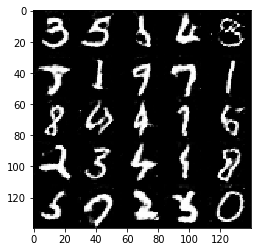

Epoch 4/5... Batch 310... Discriminator Loss: 0.4366... Generator Loss: 2.4730
Epoch 4/5... Batch 320... Discriminator Loss: 0.8517... Generator Loss: 1.1061
Epoch 4/5... Batch 330... Discriminator Loss: 0.9587... Generator Loss: 2.8606
Epoch 4/5... Batch 340... Discriminator Loss: 0.7961... Generator Loss: 1.1068
Epoch 4/5... Batch 350... Discriminator Loss: 0.9024... Generator Loss: 1.0605
Epoch 4/5... Batch 360... Discriminator Loss: 1.1321... Generator Loss: 0.7217
Epoch 4/5... Batch 370... Discriminator Loss: 0.8102... Generator Loss: 1.0906
Epoch 4/5... Batch 380... Discriminator Loss: 0.7984... Generator Loss: 1.2010
Epoch 4/5... Batch 390... Discriminator Loss: 0.5206... Generator Loss: 1.9956
Epoch 4/5... Batch 400... Discriminator Loss: 0.6550... Generator Loss: 1.4755


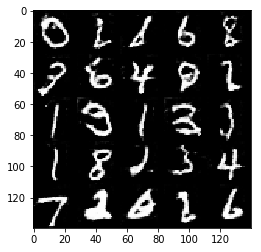

Epoch 4/5... Batch 410... Discriminator Loss: 0.9129... Generator Loss: 1.0550
Epoch 4/5... Batch 420... Discriminator Loss: 0.5399... Generator Loss: 1.9825
Epoch 4/5... Batch 430... Discriminator Loss: 0.5774... Generator Loss: 1.7826
Epoch 4/5... Batch 440... Discriminator Loss: 1.0229... Generator Loss: 0.8873
Epoch 4/5... Batch 450... Discriminator Loss: 0.5932... Generator Loss: 1.6566
Epoch 4/5... Batch 460... Discriminator Loss: 0.8813... Generator Loss: 1.2434
Epoch 4/5... Batch 470... Discriminator Loss: 0.6566... Generator Loss: 1.4813
Epoch 4/5... Batch 480... Discriminator Loss: 0.6559... Generator Loss: 1.6833
Epoch 4/5... Batch 490... Discriminator Loss: 1.7671... Generator Loss: 0.3797
Epoch 4/5... Batch 500... Discriminator Loss: 0.6336... Generator Loss: 1.6212


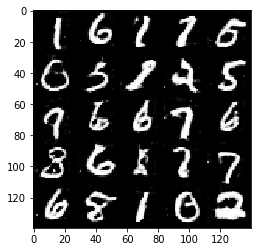

Epoch 4/5... Batch 510... Discriminator Loss: 1.0461... Generator Loss: 0.7948
Epoch 4/5... Batch 520... Discriminator Loss: 0.5150... Generator Loss: 2.0748
Epoch 4/5... Batch 530... Discriminator Loss: 0.4932... Generator Loss: 2.4536
Epoch 4/5... Batch 540... Discriminator Loss: 0.9384... Generator Loss: 1.0022
Epoch 4/5... Batch 550... Discriminator Loss: 0.5228... Generator Loss: 1.9544
Epoch 4/5... Batch 560... Discriminator Loss: 1.9252... Generator Loss: 3.6398
Epoch 4/5... Batch 570... Discriminator Loss: 0.9569... Generator Loss: 2.3418
Epoch 4/5... Batch 580... Discriminator Loss: 0.7042... Generator Loss: 3.2815
Epoch 4/5... Batch 590... Discriminator Loss: 0.6089... Generator Loss: 1.6330
Epoch 4/5... Batch 600... Discriminator Loss: 1.0975... Generator Loss: 0.8217


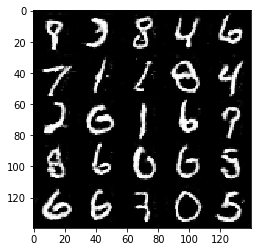

Epoch 4/5... Batch 610... Discriminator Loss: 1.5299... Generator Loss: 0.4944
Epoch 4/5... Batch 620... Discriminator Loss: 0.5692... Generator Loss: 1.7739
Epoch 4/5... Batch 630... Discriminator Loss: 0.6531... Generator Loss: 2.2955
Epoch 4/5... Batch 640... Discriminator Loss: 1.0247... Generator Loss: 0.8712
Epoch 4/5... Batch 650... Discriminator Loss: 0.6160... Generator Loss: 1.5095
Epoch 4/5... Batch 660... Discriminator Loss: 0.6567... Generator Loss: 1.7129
Epoch 4/5... Batch 670... Discriminator Loss: 0.7549... Generator Loss: 2.1374
Epoch 4/5... Batch 680... Discriminator Loss: 0.8833... Generator Loss: 1.0884
Epoch 4/5... Batch 690... Discriminator Loss: 0.6532... Generator Loss: 1.4277
Epoch 4/5... Batch 700... Discriminator Loss: 0.5604... Generator Loss: 1.9765


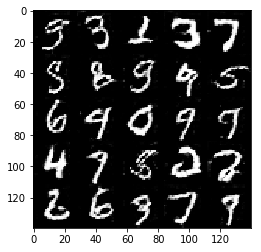

Epoch 4/5... Batch 710... Discriminator Loss: 0.7312... Generator Loss: 2.1151
Epoch 4/5... Batch 720... Discriminator Loss: 0.7278... Generator Loss: 1.4597
Epoch 4/5... Batch 730... Discriminator Loss: 0.7167... Generator Loss: 1.4523
Epoch 4/5... Batch 740... Discriminator Loss: 0.7967... Generator Loss: 1.1486
Epoch 4/5... Batch 750... Discriminator Loss: 0.5280... Generator Loss: 2.1867
Epoch 4/5... Batch 760... Discriminator Loss: 0.5766... Generator Loss: 1.7426
Epoch 4/5... Batch 770... Discriminator Loss: 0.7016... Generator Loss: 1.3924
Epoch 4/5... Batch 780... Discriminator Loss: 0.6029... Generator Loss: 1.6960
Epoch 4/5... Batch 790... Discriminator Loss: 1.6036... Generator Loss: 0.5528
Epoch 4/5... Batch 800... Discriminator Loss: 1.8549... Generator Loss: 0.4968


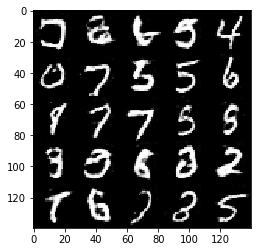

Epoch 4/5... Batch 810... Discriminator Loss: 0.7637... Generator Loss: 1.2467
Epoch 4/5... Batch 820... Discriminator Loss: 0.7816... Generator Loss: 1.1803
Epoch 4/5... Batch 830... Discriminator Loss: 0.8776... Generator Loss: 1.1714
Epoch 4/5... Batch 840... Discriminator Loss: 0.5022... Generator Loss: 2.0527
Epoch 4/5... Batch 850... Discriminator Loss: 0.5420... Generator Loss: 2.0352
Epoch 4/5... Batch 860... Discriminator Loss: 0.6768... Generator Loss: 1.9666
Epoch 4/5... Batch 870... Discriminator Loss: 0.8115... Generator Loss: 1.2312
Epoch 4/5... Batch 880... Discriminator Loss: 1.0972... Generator Loss: 0.7582
Epoch 4/5... Batch 890... Discriminator Loss: 0.5843... Generator Loss: 1.6952
Epoch 4/5... Batch 900... Discriminator Loss: 0.6444... Generator Loss: 1.4746


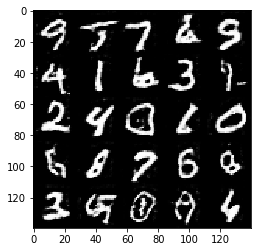

Epoch 4/5... Batch 910... Discriminator Loss: 0.7500... Generator Loss: 1.2459
Epoch 4/5... Batch 920... Discriminator Loss: 0.8478... Generator Loss: 1.0722
Epoch 4/5... Batch 930... Discriminator Loss: 0.7432... Generator Loss: 2.8518
Epoch 4/5... Batch 940... Discriminator Loss: 1.0459... Generator Loss: 0.7843
Epoch 4/5... Batch 950... Discriminator Loss: 1.1681... Generator Loss: 0.7370
Epoch 4/5... Batch 960... Discriminator Loss: 0.6763... Generator Loss: 1.5336
Epoch 4/5... Batch 970... Discriminator Loss: 0.6053... Generator Loss: 1.6762
Epoch 4/5... Batch 980... Discriminator Loss: 2.2787... Generator Loss: 4.9155
Epoch 4/5... Batch 990... Discriminator Loss: 0.6188... Generator Loss: 1.8763
Epoch 4/5... Batch 1000... Discriminator Loss: 0.8138... Generator Loss: 1.1481


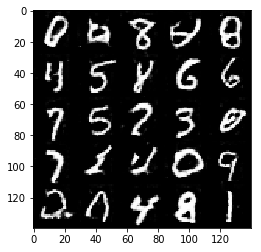

Epoch 4/5... Batch 1010... Discriminator Loss: 0.7907... Generator Loss: 1.1711
Epoch 4/5... Batch 1020... Discriminator Loss: 0.6530... Generator Loss: 1.4459
Epoch 4/5... Batch 1030... Discriminator Loss: 0.9013... Generator Loss: 1.2477
Epoch 4/5... Batch 1040... Discriminator Loss: 1.0251... Generator Loss: 0.8392
Epoch 4/5... Batch 1050... Discriminator Loss: 0.6556... Generator Loss: 1.5347
Epoch 4/5... Batch 1060... Discriminator Loss: 0.6740... Generator Loss: 2.2735
Epoch 4/5... Batch 1070... Discriminator Loss: 0.5621... Generator Loss: 1.7522
Epoch 4/5... Batch 1080... Discriminator Loss: 0.8610... Generator Loss: 1.0999
Epoch 4/5... Batch 1090... Discriminator Loss: 0.7486... Generator Loss: 1.2456
Epoch 4/5... Batch 1100... Discriminator Loss: 1.2655... Generator Loss: 0.7040


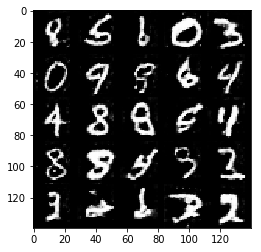

Epoch 4/5... Batch 1110... Discriminator Loss: 1.4926... Generator Loss: 0.6671
Epoch 4/5... Batch 1120... Discriminator Loss: 0.6462... Generator Loss: 1.5943
Epoch 4/5... Batch 1130... Discriminator Loss: 0.6422... Generator Loss: 1.5400
Epoch 4/5... Batch 1140... Discriminator Loss: 0.5887... Generator Loss: 1.7339
Epoch 4/5... Batch 1150... Discriminator Loss: 0.6527... Generator Loss: 1.4963
Epoch 4/5... Batch 1160... Discriminator Loss: 0.7449... Generator Loss: 1.3830
Epoch 4/5... Batch 1170... Discriminator Loss: 0.9561... Generator Loss: 0.9113
Epoch 4/5... Batch 1180... Discriminator Loss: 0.5617... Generator Loss: 1.9389
Epoch 4/5... Batch 1190... Discriminator Loss: 0.5639... Generator Loss: 1.7724
Epoch 4/5... Batch 1200... Discriminator Loss: 0.6402... Generator Loss: 1.4679


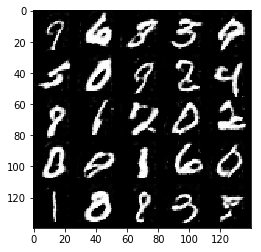

Epoch 4/5... Batch 1210... Discriminator Loss: 0.8942... Generator Loss: 1.0793
Epoch 4/5... Batch 1220... Discriminator Loss: 0.6731... Generator Loss: 1.5374
Epoch 4/5... Batch 1230... Discriminator Loss: 0.8643... Generator Loss: 1.1148
Epoch 4/5... Batch 1240... Discriminator Loss: 0.7062... Generator Loss: 1.4769
Epoch 4/5... Batch 1250... Discriminator Loss: 0.7184... Generator Loss: 1.5092
Epoch 4/5... Batch 1260... Discriminator Loss: 1.4081... Generator Loss: 3.4050
Epoch 4/5... Batch 1270... Discriminator Loss: 0.6552... Generator Loss: 1.7822
Epoch 4/5... Batch 1280... Discriminator Loss: 0.4473... Generator Loss: 2.4727
Epoch 4/5... Batch 1290... Discriminator Loss: 0.6967... Generator Loss: 1.3505
Epoch 4/5... Batch 1300... Discriminator Loss: 0.7081... Generator Loss: 1.3349


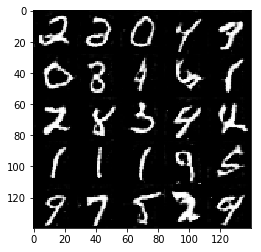

Epoch 4/5... Batch 1310... Discriminator Loss: 0.4948... Generator Loss: 2.1598
Epoch 4/5... Batch 1320... Discriminator Loss: 0.6523... Generator Loss: 1.5610
Epoch 4/5... Batch 1330... Discriminator Loss: 0.8916... Generator Loss: 1.1958
Epoch 4/5... Batch 1340... Discriminator Loss: 0.5250... Generator Loss: 2.0895
Epoch 4/5... Batch 1350... Discriminator Loss: 0.7025... Generator Loss: 1.3399
Epoch 4/5... Batch 1360... Discriminator Loss: 2.7452... Generator Loss: 0.1484
Epoch 4/5... Batch 1370... Discriminator Loss: 0.6406... Generator Loss: 1.5274
Epoch 4/5... Batch 1380... Discriminator Loss: 0.5062... Generator Loss: 2.2254
Epoch 4/5... Batch 1390... Discriminator Loss: 0.5001... Generator Loss: 2.1401
Epoch 4/5... Batch 1400... Discriminator Loss: 0.9358... Generator Loss: 0.9673


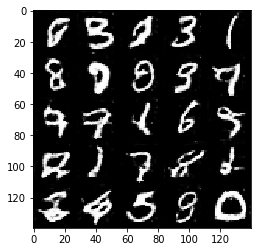

Epoch 4/5... Batch 1410... Discriminator Loss: 0.6409... Generator Loss: 1.5479
Epoch 4/5... Batch 1420... Discriminator Loss: 0.8902... Generator Loss: 1.8584
Epoch 4/5... Batch 1430... Discriminator Loss: 0.9713... Generator Loss: 0.8646
Epoch 4/5... Batch 1440... Discriminator Loss: 1.0102... Generator Loss: 0.8013
Epoch 4/5... Batch 1450... Discriminator Loss: 0.5228... Generator Loss: 1.9143
Epoch 4/5... Batch 1460... Discriminator Loss: 0.5783... Generator Loss: 1.7414
Epoch 4/5... Batch 1470... Discriminator Loss: 1.0662... Generator Loss: 0.8644
Epoch 4/5... Batch 1480... Discriminator Loss: 0.7007... Generator Loss: 1.4647
Epoch 4/5... Batch 1490... Discriminator Loss: 2.0524... Generator Loss: 3.7548
Epoch 4/5... Batch 1500... Discriminator Loss: 1.2263... Generator Loss: 3.5295


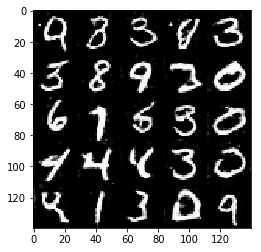

Epoch 4/5... Batch 1510... Discriminator Loss: 1.5380... Generator Loss: 0.4464
Epoch 4/5... Batch 1520... Discriminator Loss: 0.7080... Generator Loss: 1.3821
Epoch 4/5... Batch 1530... Discriminator Loss: 1.1954... Generator Loss: 0.8349
Epoch 4/5... Batch 1540... Discriminator Loss: 0.7029... Generator Loss: 1.4496
Epoch 4/5... Batch 1550... Discriminator Loss: 0.4906... Generator Loss: 2.3823
Epoch 4/5... Batch 1560... Discriminator Loss: 0.6286... Generator Loss: 1.5580
Epoch 4/5... Batch 1570... Discriminator Loss: 0.7111... Generator Loss: 1.3258
Epoch 4/5... Batch 1580... Discriminator Loss: 0.7688... Generator Loss: 1.1855
Epoch 4/5... Batch 1590... Discriminator Loss: 0.8533... Generator Loss: 0.9754
Epoch 4/5... Batch 1600... Discriminator Loss: 1.1368... Generator Loss: 0.8234


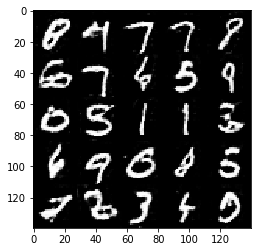

Epoch 4/5... Batch 1610... Discriminator Loss: 1.3153... Generator Loss: 0.6445
Epoch 4/5... Batch 1620... Discriminator Loss: 0.9921... Generator Loss: 0.9347
Epoch 4/5... Batch 1630... Discriminator Loss: 0.6889... Generator Loss: 1.4286
Epoch 4/5... Batch 1640... Discriminator Loss: 0.7186... Generator Loss: 1.3361
Epoch 4/5... Batch 1650... Discriminator Loss: 0.5902... Generator Loss: 1.6705
Epoch 4/5... Batch 1660... Discriminator Loss: 0.5384... Generator Loss: 2.2158
Epoch 4/5... Batch 1670... Discriminator Loss: 1.0900... Generator Loss: 0.7772
Epoch 4/5... Batch 1680... Discriminator Loss: 0.5800... Generator Loss: 1.9677
Epoch 4/5... Batch 1690... Discriminator Loss: 1.2357... Generator Loss: 0.7572
Epoch 4/5... Batch 1700... Discriminator Loss: 0.5589... Generator Loss: 2.3854


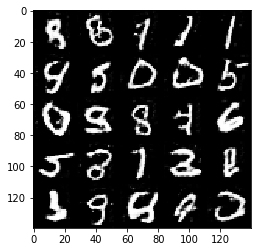

Epoch 4/5... Batch 1710... Discriminator Loss: 0.5736... Generator Loss: 1.8151
Epoch 4/5... Batch 1720... Discriminator Loss: 0.7695... Generator Loss: 2.6900
Epoch 4/5... Batch 1730... Discriminator Loss: 1.0231... Generator Loss: 0.8844
Epoch 4/5... Batch 1740... Discriminator Loss: 0.8516... Generator Loss: 1.6620
Epoch 4/5... Batch 1750... Discriminator Loss: 2.0052... Generator Loss: 0.4089
Epoch 4/5... Batch 1760... Discriminator Loss: 1.8251... Generator Loss: 0.3497
Epoch 4/5... Batch 1770... Discriminator Loss: 0.7595... Generator Loss: 1.6695
Epoch 4/5... Batch 1780... Discriminator Loss: 0.6345... Generator Loss: 1.5749
Epoch 4/5... Batch 1790... Discriminator Loss: 0.6144... Generator Loss: 1.5502
Epoch 4/5... Batch 1800... Discriminator Loss: 0.5631... Generator Loss: 1.8268


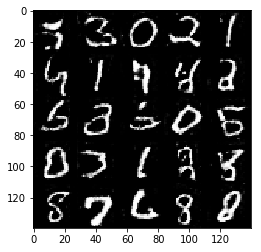

Epoch 4/5... Batch 1810... Discriminator Loss: 0.5567... Generator Loss: 2.0035
Epoch 4/5... Batch 1820... Discriminator Loss: 0.6943... Generator Loss: 1.3540
Epoch 4/5... Batch 1830... Discriminator Loss: 1.0274... Generator Loss: 2.2853
Epoch 4/5... Batch 1840... Discriminator Loss: 0.7616... Generator Loss: 2.5580
Epoch 4/5... Batch 1850... Discriminator Loss: 0.6878... Generator Loss: 1.4848
Epoch 4/5... Batch 1860... Discriminator Loss: 0.7439... Generator Loss: 1.2185
Epoch 4/5... Batch 1870... Discriminator Loss: 0.6981... Generator Loss: 1.4103
Epoch 5/5... Batch 10... Discriminator Loss: 2.5340... Generator Loss: 0.2026
Epoch 5/5... Batch 20... Discriminator Loss: 0.9440... Generator Loss: 0.9858
Epoch 5/5... Batch 30... Discriminator Loss: 1.2978... Generator Loss: 0.6426
Epoch 5/5... Batch 40... Discriminator Loss: 0.8989... Generator Loss: 0.9575
Epoch 5/5... Batch 50... Discriminator Loss: 0.6689... Generator Loss: 1.6559
Epoch 5/5... Batch 60... Discriminator Loss: 0.815

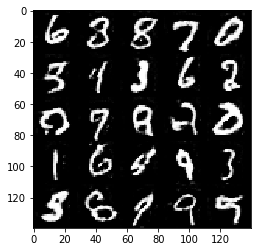

Epoch 5/5... Batch 110... Discriminator Loss: 0.8145... Generator Loss: 1.1179
Epoch 5/5... Batch 120... Discriminator Loss: 1.6530... Generator Loss: 0.6030
Epoch 5/5... Batch 130... Discriminator Loss: 1.2970... Generator Loss: 0.6106
Epoch 5/5... Batch 140... Discriminator Loss: 0.7372... Generator Loss: 1.2179
Epoch 5/5... Batch 150... Discriminator Loss: 0.7733... Generator Loss: 1.2058
Epoch 5/5... Batch 160... Discriminator Loss: 0.5123... Generator Loss: 2.0020
Epoch 5/5... Batch 170... Discriminator Loss: 1.1552... Generator Loss: 0.6899
Epoch 5/5... Batch 180... Discriminator Loss: 0.8610... Generator Loss: 1.0449
Epoch 5/5... Batch 190... Discriminator Loss: 0.5873... Generator Loss: 1.6138
Epoch 5/5... Batch 200... Discriminator Loss: 0.9756... Generator Loss: 0.8669


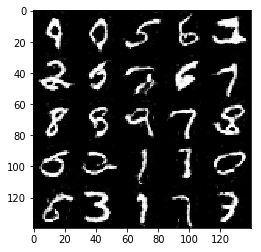

Epoch 5/5... Batch 210... Discriminator Loss: 1.8383... Generator Loss: 0.3844
Epoch 5/5... Batch 220... Discriminator Loss: 2.0934... Generator Loss: 0.3183
Epoch 5/5... Batch 230... Discriminator Loss: 0.5580... Generator Loss: 2.0838
Epoch 5/5... Batch 240... Discriminator Loss: 1.2085... Generator Loss: 0.6834
Epoch 5/5... Batch 250... Discriminator Loss: 0.5271... Generator Loss: 1.9241
Epoch 5/5... Batch 260... Discriminator Loss: 0.4919... Generator Loss: 2.2133
Epoch 5/5... Batch 270... Discriminator Loss: 0.7811... Generator Loss: 1.8282
Epoch 5/5... Batch 280... Discriminator Loss: 0.5617... Generator Loss: 1.7375
Epoch 5/5... Batch 290... Discriminator Loss: 0.7161... Generator Loss: 1.3149
Epoch 5/5... Batch 300... Discriminator Loss: 1.1948... Generator Loss: 0.6921


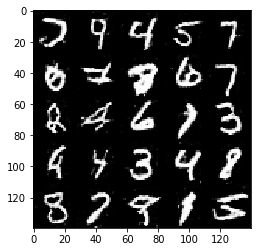

Epoch 5/5... Batch 310... Discriminator Loss: 0.6290... Generator Loss: 1.5103
Epoch 5/5... Batch 320... Discriminator Loss: 0.7886... Generator Loss: 1.2415
Epoch 5/5... Batch 330... Discriminator Loss: 0.6995... Generator Loss: 1.3908
Epoch 5/5... Batch 340... Discriminator Loss: 0.7651... Generator Loss: 1.2068
Epoch 5/5... Batch 350... Discriminator Loss: 0.8184... Generator Loss: 1.3148
Epoch 5/5... Batch 360... Discriminator Loss: 1.3554... Generator Loss: 0.5895
Epoch 5/5... Batch 370... Discriminator Loss: 0.7559... Generator Loss: 1.2153
Epoch 5/5... Batch 380... Discriminator Loss: 0.7106... Generator Loss: 1.3517
Epoch 5/5... Batch 390... Discriminator Loss: 0.4670... Generator Loss: 2.5632
Epoch 5/5... Batch 400... Discriminator Loss: 0.7288... Generator Loss: 1.4266


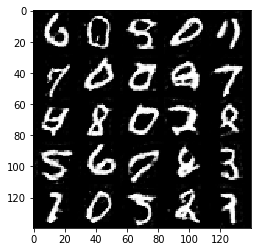

Epoch 5/5... Batch 410... Discriminator Loss: 0.9804... Generator Loss: 0.9503
Epoch 5/5... Batch 420... Discriminator Loss: 0.5630... Generator Loss: 1.8361
Epoch 5/5... Batch 430... Discriminator Loss: 0.5650... Generator Loss: 1.9021
Epoch 5/5... Batch 440... Discriminator Loss: 1.4483... Generator Loss: 0.5580
Epoch 5/5... Batch 450... Discriminator Loss: 0.5254... Generator Loss: 1.9909
Epoch 5/5... Batch 460... Discriminator Loss: 0.7986... Generator Loss: 1.1248
Epoch 5/5... Batch 470... Discriminator Loss: 0.7237... Generator Loss: 1.3267
Epoch 5/5... Batch 480... Discriminator Loss: 0.6449... Generator Loss: 1.5863
Epoch 5/5... Batch 490... Discriminator Loss: 2.9665... Generator Loss: 4.8228
Epoch 5/5... Batch 500... Discriminator Loss: 0.6127... Generator Loss: 1.7881


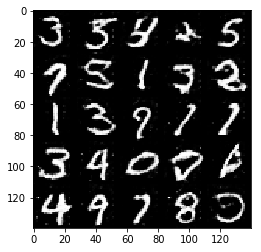

Epoch 5/5... Batch 510... Discriminator Loss: 0.6500... Generator Loss: 2.2870
Epoch 5/5... Batch 520... Discriminator Loss: 0.6316... Generator Loss: 1.6356
Epoch 5/5... Batch 530... Discriminator Loss: 0.6549... Generator Loss: 1.4204
Epoch 5/5... Batch 540... Discriminator Loss: 1.0886... Generator Loss: 0.7902
Epoch 5/5... Batch 550... Discriminator Loss: 0.6449... Generator Loss: 1.5442
Epoch 5/5... Batch 560... Discriminator Loss: 1.9617... Generator Loss: 3.8107
Epoch 5/5... Batch 570... Discriminator Loss: 0.7294... Generator Loss: 1.3440
Epoch 5/5... Batch 580... Discriminator Loss: 0.6406... Generator Loss: 1.9894
Epoch 5/5... Batch 590... Discriminator Loss: 0.6415... Generator Loss: 1.5990
Epoch 5/5... Batch 600... Discriminator Loss: 0.8610... Generator Loss: 1.0375


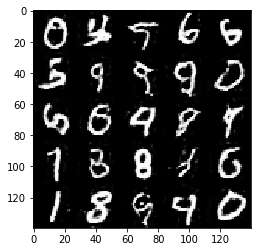

Epoch 5/5... Batch 610... Discriminator Loss: 0.6594... Generator Loss: 1.4570
Epoch 5/5... Batch 620... Discriminator Loss: 0.7618... Generator Loss: 1.2464
Epoch 5/5... Batch 630... Discriminator Loss: 0.5698... Generator Loss: 1.8193
Epoch 5/5... Batch 640... Discriminator Loss: 0.9508... Generator Loss: 1.0535
Epoch 5/5... Batch 650... Discriminator Loss: 0.8163... Generator Loss: 1.1781
Epoch 5/5... Batch 660... Discriminator Loss: 0.7217... Generator Loss: 1.3218
Epoch 5/5... Batch 670... Discriminator Loss: 1.0674... Generator Loss: 0.7225
Epoch 5/5... Batch 680... Discriminator Loss: 0.9378... Generator Loss: 0.9258
Epoch 5/5... Batch 690... Discriminator Loss: 0.5327... Generator Loss: 1.9117
Epoch 5/5... Batch 700... Discriminator Loss: 0.7151... Generator Loss: 1.4125


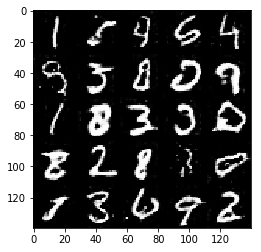

Epoch 5/5... Batch 710... Discriminator Loss: 0.8154... Generator Loss: 1.1516
Epoch 5/5... Batch 720... Discriminator Loss: 0.6192... Generator Loss: 1.5113
Epoch 5/5... Batch 730... Discriminator Loss: 0.5465... Generator Loss: 1.9727
Epoch 5/5... Batch 740... Discriminator Loss: 0.5646... Generator Loss: 1.7266
Epoch 5/5... Batch 750... Discriminator Loss: 0.5908... Generator Loss: 2.3436
Epoch 5/5... Batch 760... Discriminator Loss: 0.6276... Generator Loss: 1.7035
Epoch 5/5... Batch 770... Discriminator Loss: 2.1715... Generator Loss: 0.3816
Epoch 5/5... Batch 780... Discriminator Loss: 0.9476... Generator Loss: 0.9431
Epoch 5/5... Batch 790... Discriminator Loss: 0.9617... Generator Loss: 0.9677
Epoch 5/5... Batch 800... Discriminator Loss: 0.9186... Generator Loss: 1.0577


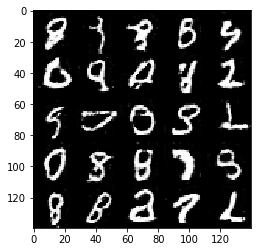

Epoch 5/5... Batch 810... Discriminator Loss: 0.5698... Generator Loss: 1.7686
Epoch 5/5... Batch 820... Discriminator Loss: 0.7099... Generator Loss: 1.4114
Epoch 5/5... Batch 830... Discriminator Loss: 0.5681... Generator Loss: 1.9049
Epoch 5/5... Batch 840... Discriminator Loss: 0.5917... Generator Loss: 1.7415
Epoch 5/5... Batch 850... Discriminator Loss: 0.4664... Generator Loss: 2.3676
Epoch 5/5... Batch 860... Discriminator Loss: 0.6818... Generator Loss: 2.3722
Epoch 5/5... Batch 870... Discriminator Loss: 0.9507... Generator Loss: 1.0740
Epoch 5/5... Batch 880... Discriminator Loss: 1.0055... Generator Loss: 0.9390
Epoch 5/5... Batch 890... Discriminator Loss: 0.5193... Generator Loss: 2.0220
Epoch 5/5... Batch 900... Discriminator Loss: 0.7838... Generator Loss: 1.1543


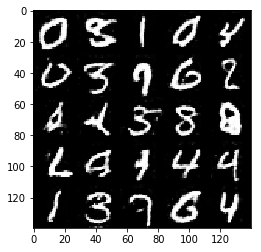

Epoch 5/5... Batch 910... Discriminator Loss: 0.5976... Generator Loss: 1.8469
Epoch 5/5... Batch 920... Discriminator Loss: 1.6302... Generator Loss: 0.5472
Epoch 5/5... Batch 930... Discriminator Loss: 1.8672... Generator Loss: 0.4238
Epoch 5/5... Batch 940... Discriminator Loss: 0.8646... Generator Loss: 1.0545
Epoch 5/5... Batch 950... Discriminator Loss: 0.8922... Generator Loss: 1.0782
Epoch 5/5... Batch 960... Discriminator Loss: 0.6702... Generator Loss: 1.4403
Epoch 5/5... Batch 970... Discriminator Loss: 0.6137... Generator Loss: 1.6140
Epoch 5/5... Batch 980... Discriminator Loss: 0.6859... Generator Loss: 1.3680
Epoch 5/5... Batch 990... Discriminator Loss: 0.7635... Generator Loss: 1.2833
Epoch 5/5... Batch 1000... Discriminator Loss: 0.6060... Generator Loss: 1.6014


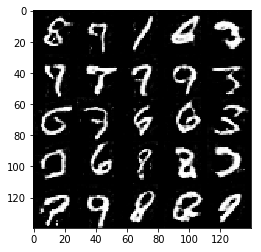

Epoch 5/5... Batch 1010... Discriminator Loss: 0.7094... Generator Loss: 1.2660
Epoch 5/5... Batch 1020... Discriminator Loss: 1.0275... Generator Loss: 2.5818
Epoch 5/5... Batch 1030... Discriminator Loss: 0.7238... Generator Loss: 1.3321
Epoch 5/5... Batch 1040... Discriminator Loss: 0.8546... Generator Loss: 1.0826
Epoch 5/5... Batch 1050... Discriminator Loss: 0.5306... Generator Loss: 2.1401
Epoch 5/5... Batch 1060... Discriminator Loss: 0.6647... Generator Loss: 1.4816
Epoch 5/5... Batch 1070... Discriminator Loss: 0.5320... Generator Loss: 1.9305
Epoch 5/5... Batch 1080... Discriminator Loss: 0.8583... Generator Loss: 1.0462
Epoch 5/5... Batch 1090... Discriminator Loss: 0.7724... Generator Loss: 1.1805
Epoch 5/5... Batch 1100... Discriminator Loss: 0.6093... Generator Loss: 1.6195


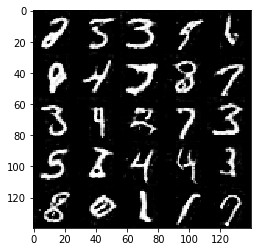

Epoch 5/5... Batch 1110... Discriminator Loss: 1.2717... Generator Loss: 0.7165
Epoch 5/5... Batch 1120... Discriminator Loss: 0.6034... Generator Loss: 2.7782
Epoch 5/5... Batch 1130... Discriminator Loss: 0.5046... Generator Loss: 2.0701
Epoch 5/5... Batch 1140... Discriminator Loss: 0.7295... Generator Loss: 1.2741
Epoch 5/5... Batch 1150... Discriminator Loss: 0.5449... Generator Loss: 2.0838
Epoch 5/5... Batch 1160... Discriminator Loss: 0.7631... Generator Loss: 1.2622
Epoch 5/5... Batch 1170... Discriminator Loss: 1.2951... Generator Loss: 0.6770
Epoch 5/5... Batch 1180... Discriminator Loss: 0.7759... Generator Loss: 1.2061
Epoch 5/5... Batch 1190... Discriminator Loss: 0.5657... Generator Loss: 1.8314
Epoch 5/5... Batch 1200... Discriminator Loss: 0.8738... Generator Loss: 1.0667


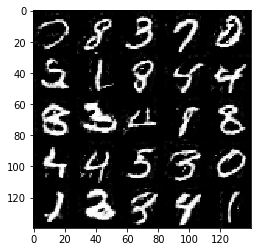

Epoch 5/5... Batch 1210... Discriminator Loss: 0.6739... Generator Loss: 1.4091
Epoch 5/5... Batch 1220... Discriminator Loss: 0.9856... Generator Loss: 0.8218
Epoch 5/5... Batch 1230... Discriminator Loss: 0.8068... Generator Loss: 1.1637
Epoch 5/5... Batch 1240... Discriminator Loss: 0.7712... Generator Loss: 1.2876
Epoch 5/5... Batch 1250... Discriminator Loss: 1.7030... Generator Loss: 0.4858
Epoch 5/5... Batch 1260... Discriminator Loss: 0.6961... Generator Loss: 1.3773
Epoch 5/5... Batch 1270... Discriminator Loss: 1.6886... Generator Loss: 0.4128
Epoch 5/5... Batch 1280... Discriminator Loss: 0.4276... Generator Loss: 2.6538
Epoch 5/5... Batch 1290... Discriminator Loss: 0.6372... Generator Loss: 1.4969
Epoch 5/5... Batch 1300... Discriminator Loss: 0.8784... Generator Loss: 1.0779


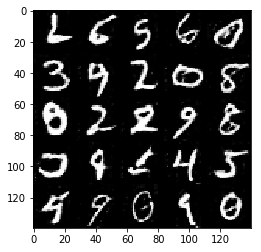

Epoch 5/5... Batch 1310... Discriminator Loss: 1.0133... Generator Loss: 1.1702
Epoch 5/5... Batch 1320... Discriminator Loss: 0.9964... Generator Loss: 0.8867
Epoch 5/5... Batch 1330... Discriminator Loss: 0.6944... Generator Loss: 1.3620
Epoch 5/5... Batch 1340... Discriminator Loss: 0.7514... Generator Loss: 1.2918
Epoch 5/5... Batch 1350... Discriminator Loss: 0.6569... Generator Loss: 1.5798
Epoch 5/5... Batch 1360... Discriminator Loss: 2.7796... Generator Loss: 0.2374
Epoch 5/5... Batch 1370... Discriminator Loss: 0.6090... Generator Loss: 1.6933
Epoch 5/5... Batch 1380... Discriminator Loss: 0.5858... Generator Loss: 1.7203
Epoch 5/5... Batch 1390... Discriminator Loss: 1.0955... Generator Loss: 0.8049
Epoch 5/5... Batch 1400... Discriminator Loss: 1.0261... Generator Loss: 0.8693


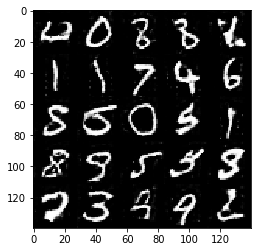

Epoch 5/5... Batch 1410... Discriminator Loss: 0.7761... Generator Loss: 1.2121
Epoch 5/5... Batch 1420... Discriminator Loss: 1.4651... Generator Loss: 0.6093
Epoch 5/5... Batch 1430... Discriminator Loss: 0.8324... Generator Loss: 1.1842
Epoch 5/5... Batch 1440... Discriminator Loss: 0.7742... Generator Loss: 1.1356
Epoch 5/5... Batch 1450... Discriminator Loss: 0.7285... Generator Loss: 1.2712
Epoch 5/5... Batch 1460... Discriminator Loss: 0.5609... Generator Loss: 2.0561
Epoch 5/5... Batch 1470... Discriminator Loss: 0.7397... Generator Loss: 1.2101
Epoch 5/5... Batch 1480... Discriminator Loss: 0.6975... Generator Loss: 1.5717
Epoch 5/5... Batch 1490... Discriminator Loss: 1.1084... Generator Loss: 0.7647
Epoch 5/5... Batch 1500... Discriminator Loss: 0.5858... Generator Loss: 1.7115


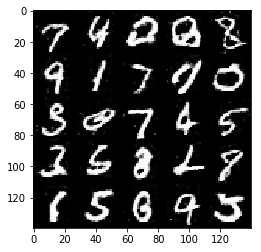

Epoch 5/5... Batch 1510... Discriminator Loss: 1.0738... Generator Loss: 0.9242
Epoch 5/5... Batch 1520... Discriminator Loss: 0.7445... Generator Loss: 1.2407
Epoch 5/5... Batch 1530... Discriminator Loss: 0.8842... Generator Loss: 3.1320
Epoch 5/5... Batch 1540... Discriminator Loss: 0.6087... Generator Loss: 1.5995
Epoch 5/5... Batch 1550... Discriminator Loss: 0.5868... Generator Loss: 1.7141
Epoch 5/5... Batch 1560... Discriminator Loss: 0.7947... Generator Loss: 1.2137
Epoch 5/5... Batch 1570... Discriminator Loss: 0.4776... Generator Loss: 2.2437
Epoch 5/5... Batch 1580... Discriminator Loss: 0.6777... Generator Loss: 1.3814
Epoch 5/5... Batch 1590... Discriminator Loss: 0.7312... Generator Loss: 1.2847
Epoch 5/5... Batch 1600... Discriminator Loss: 0.5511... Generator Loss: 1.9124


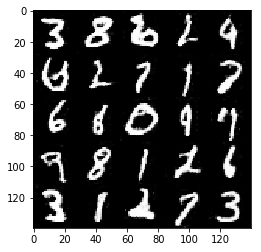

Epoch 5/5... Batch 1610... Discriminator Loss: 0.6668... Generator Loss: 1.4443
Epoch 5/5... Batch 1620... Discriminator Loss: 1.2484... Generator Loss: 0.6864
Epoch 5/5... Batch 1630... Discriminator Loss: 0.8247... Generator Loss: 2.6636
Epoch 5/5... Batch 1640... Discriminator Loss: 0.9715... Generator Loss: 1.1000
Epoch 5/5... Batch 1650... Discriminator Loss: 0.6804... Generator Loss: 1.3784
Epoch 5/5... Batch 1660... Discriminator Loss: 0.5004... Generator Loss: 2.2181
Epoch 5/5... Batch 1670... Discriminator Loss: 0.8923... Generator Loss: 1.0992
Epoch 5/5... Batch 1680... Discriminator Loss: 0.6798... Generator Loss: 1.8985
Epoch 5/5... Batch 1690... Discriminator Loss: 1.5852... Generator Loss: 0.6903
Epoch 5/5... Batch 1700... Discriminator Loss: 1.4329... Generator Loss: 0.5743


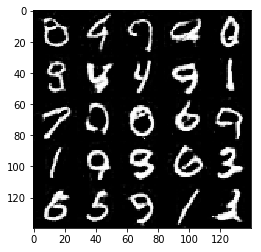

Epoch 5/5... Batch 1710... Discriminator Loss: 0.4665... Generator Loss: 2.3227
Epoch 5/5... Batch 1720... Discriminator Loss: 2.0336... Generator Loss: 0.6851
Epoch 5/5... Batch 1730... Discriminator Loss: 1.6860... Generator Loss: 0.6777
Epoch 5/5... Batch 1740... Discriminator Loss: 0.7585... Generator Loss: 2.0509
Epoch 5/5... Batch 1750... Discriminator Loss: 0.8739... Generator Loss: 1.1037
Epoch 5/5... Batch 1760... Discriminator Loss: 1.2829... Generator Loss: 0.7314
Epoch 5/5... Batch 1770... Discriminator Loss: 0.9743... Generator Loss: 0.8933
Epoch 5/5... Batch 1780... Discriminator Loss: 1.0418... Generator Loss: 0.8927
Epoch 5/5... Batch 1790... Discriminator Loss: 0.7674... Generator Loss: 1.2482
Epoch 5/5... Batch 1800... Discriminator Loss: 0.5106... Generator Loss: 2.1845


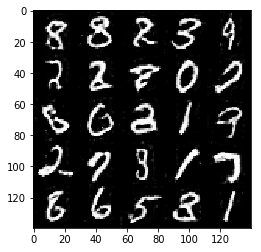

Epoch 5/5... Batch 1810... Discriminator Loss: 0.4781... Generator Loss: 2.3314
Epoch 5/5... Batch 1820... Discriminator Loss: 0.8012... Generator Loss: 1.1777
Epoch 5/5... Batch 1830... Discriminator Loss: 1.3244... Generator Loss: 0.5885
Epoch 5/5... Batch 1840... Discriminator Loss: 0.6361... Generator Loss: 1.9234
Epoch 5/5... Batch 1850... Discriminator Loss: 0.8067... Generator Loss: 1.2499
Epoch 5/5... Batch 1860... Discriminator Loss: 1.2517... Generator Loss: 0.6896
Epoch 5/5... Batch 1870... Discriminator Loss: 0.6396... Generator Loss: 1.5507


In [22]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... Batch 10... Discriminator Loss: 4.9688... Generator Loss: 0.0149
Epoch 1/2... Batch 20... Discriminator Loss: 5.6123... Generator Loss: 0.0074
Epoch 1/2... Batch 30... Discriminator Loss: 3.1060... Generator Loss: 0.0828
Epoch 1/2... Batch 40... Discriminator Loss: 2.4479... Generator Loss: 0.1956
Epoch 1/2... Batch 50... Discriminator Loss: 1.6389... Generator Loss: 0.4734
Epoch 1/2... Batch 60... Discriminator Loss: 1.6807... Generator Loss: 1.2218
Epoch 1/2... Batch 70... Discriminator Loss: 1.5885... Generator Loss: 1.1081
Epoch 1/2... Batch 80... Discriminator Loss: 1.7634... Generator Loss: 1.0323
Epoch 1/2... Batch 90... Discriminator Loss: 1.7413... Generator Loss: 0.8534
Epoch 1/2... Batch 100... Discriminator Loss: 2.2495... Generator Loss: 0.1760


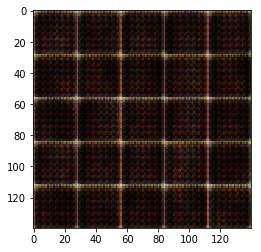

Epoch 1/2... Batch 110... Discriminator Loss: 2.0090... Generator Loss: 0.2450
Epoch 1/2... Batch 120... Discriminator Loss: 1.9015... Generator Loss: 0.2585
Epoch 1/2... Batch 130... Discriminator Loss: 1.7732... Generator Loss: 0.4197
Epoch 1/2... Batch 140... Discriminator Loss: 1.8760... Generator Loss: 1.5388
Epoch 1/2... Batch 150... Discriminator Loss: 1.4628... Generator Loss: 0.8939
Epoch 1/2... Batch 160... Discriminator Loss: 1.9761... Generator Loss: 0.2350
Epoch 1/2... Batch 170... Discriminator Loss: 1.9589... Generator Loss: 0.3395
Epoch 1/2... Batch 180... Discriminator Loss: 2.1668... Generator Loss: 0.2153
Epoch 1/2... Batch 190... Discriminator Loss: 1.5068... Generator Loss: 0.6701
Epoch 1/2... Batch 200... Discriminator Loss: 1.4018... Generator Loss: 1.1578


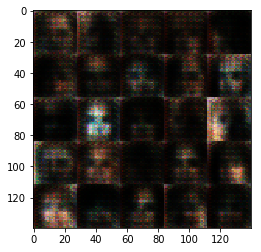

Epoch 1/2... Batch 210... Discriminator Loss: 1.2965... Generator Loss: 0.7136
Epoch 1/2... Batch 220... Discriminator Loss: 1.4975... Generator Loss: 0.4247
Epoch 1/2... Batch 230... Discriminator Loss: 2.2740... Generator Loss: 0.1752
Epoch 1/2... Batch 240... Discriminator Loss: 1.5926... Generator Loss: 0.8391
Epoch 1/2... Batch 250... Discriminator Loss: 1.3248... Generator Loss: 1.7143
Epoch 1/2... Batch 260... Discriminator Loss: 1.3954... Generator Loss: 1.1871
Epoch 1/2... Batch 270... Discriminator Loss: 1.6450... Generator Loss: 1.3027
Epoch 1/2... Batch 280... Discriminator Loss: 1.5408... Generator Loss: 1.3196
Epoch 1/2... Batch 290... Discriminator Loss: 1.5542... Generator Loss: 0.5545
Epoch 1/2... Batch 300... Discriminator Loss: 1.6442... Generator Loss: 0.7698


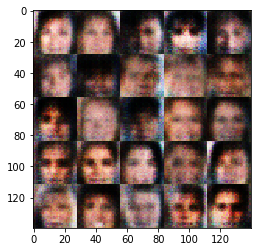

Epoch 1/2... Batch 310... Discriminator Loss: 1.6163... Generator Loss: 0.4553
Epoch 1/2... Batch 320... Discriminator Loss: 1.7701... Generator Loss: 0.3197
Epoch 1/2... Batch 330... Discriminator Loss: 1.5829... Generator Loss: 0.5430
Epoch 1/2... Batch 340... Discriminator Loss: 1.5302... Generator Loss: 0.4975
Epoch 1/2... Batch 350... Discriminator Loss: 1.4370... Generator Loss: 0.5149
Epoch 1/2... Batch 360... Discriminator Loss: 1.5814... Generator Loss: 0.4335
Epoch 1/2... Batch 370... Discriminator Loss: 1.6202... Generator Loss: 0.4280
Epoch 1/2... Batch 380... Discriminator Loss: 1.6596... Generator Loss: 0.3667
Epoch 1/2... Batch 390... Discriminator Loss: 1.3399... Generator Loss: 0.8689
Epoch 1/2... Batch 400... Discriminator Loss: 1.3569... Generator Loss: 1.1003


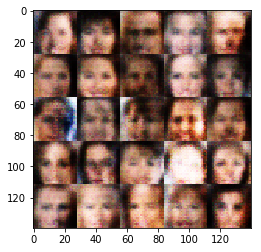

Epoch 1/2... Batch 410... Discriminator Loss: 1.4213... Generator Loss: 0.5130
Epoch 1/2... Batch 420... Discriminator Loss: 1.7484... Generator Loss: 0.3234
Epoch 1/2... Batch 430... Discriminator Loss: 1.5780... Generator Loss: 0.4421
Epoch 1/2... Batch 440... Discriminator Loss: 1.2844... Generator Loss: 1.1436
Epoch 1/2... Batch 450... Discriminator Loss: 1.3149... Generator Loss: 0.9613
Epoch 1/2... Batch 460... Discriminator Loss: 1.5986... Generator Loss: 0.4002
Epoch 1/2... Batch 470... Discriminator Loss: 1.9749... Generator Loss: 0.2846
Epoch 1/2... Batch 480... Discriminator Loss: 1.5733... Generator Loss: 0.4557
Epoch 1/2... Batch 490... Discriminator Loss: 1.3212... Generator Loss: 0.9938
Epoch 1/2... Batch 500... Discriminator Loss: 1.9528... Generator Loss: 0.2503


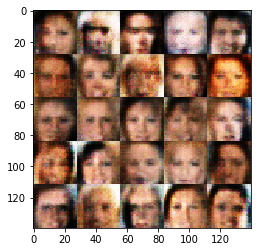

Epoch 1/2... Batch 510... Discriminator Loss: 1.3977... Generator Loss: 0.5564
Epoch 1/2... Batch 520... Discriminator Loss: 1.2610... Generator Loss: 1.1234
Epoch 1/2... Batch 530... Discriminator Loss: 1.5183... Generator Loss: 0.7819
Epoch 1/2... Batch 540... Discriminator Loss: 1.1301... Generator Loss: 1.1210
Epoch 1/2... Batch 550... Discriminator Loss: 1.4492... Generator Loss: 0.8471
Epoch 1/2... Batch 560... Discriminator Loss: 1.3044... Generator Loss: 1.7408
Epoch 1/2... Batch 570... Discriminator Loss: 1.1688... Generator Loss: 1.3898
Epoch 1/2... Batch 580... Discriminator Loss: 1.5199... Generator Loss: 0.7569
Epoch 1/2... Batch 590... Discriminator Loss: 1.9449... Generator Loss: 1.9607
Epoch 1/2... Batch 600... Discriminator Loss: 1.0131... Generator Loss: 1.7976


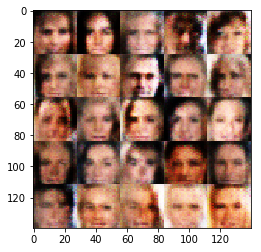

Epoch 1/2... Batch 610... Discriminator Loss: 0.8703... Generator Loss: 1.4087
Epoch 1/2... Batch 620... Discriminator Loss: 1.3270... Generator Loss: 1.5564
Epoch 1/2... Batch 630... Discriminator Loss: 1.4061... Generator Loss: 1.3606
Epoch 1/2... Batch 640... Discriminator Loss: 1.2586... Generator Loss: 0.6188
Epoch 1/2... Batch 650... Discriminator Loss: 1.2881... Generator Loss: 1.2718
Epoch 1/2... Batch 660... Discriminator Loss: 1.0623... Generator Loss: 1.4423
Epoch 1/2... Batch 670... Discriminator Loss: 1.6688... Generator Loss: 1.0521
Epoch 1/2... Batch 680... Discriminator Loss: 1.1327... Generator Loss: 1.4349
Epoch 1/2... Batch 690... Discriminator Loss: 1.2098... Generator Loss: 1.8257
Epoch 1/2... Batch 700... Discriminator Loss: 1.1277... Generator Loss: 1.6647


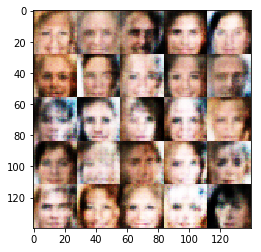

Epoch 1/2... Batch 710... Discriminator Loss: 0.8229... Generator Loss: 2.1453
Epoch 1/2... Batch 720... Discriminator Loss: 0.9013... Generator Loss: 1.1667
Epoch 1/2... Batch 730... Discriminator Loss: 1.3797... Generator Loss: 1.2350
Epoch 1/2... Batch 740... Discriminator Loss: 1.3780... Generator Loss: 0.4949
Epoch 1/2... Batch 750... Discriminator Loss: 1.2540... Generator Loss: 0.5514
Epoch 1/2... Batch 760... Discriminator Loss: 1.7165... Generator Loss: 0.3586
Epoch 1/2... Batch 770... Discriminator Loss: 1.4531... Generator Loss: 0.4495
Epoch 1/2... Batch 780... Discriminator Loss: 1.2786... Generator Loss: 0.5329
Epoch 1/2... Batch 790... Discriminator Loss: 0.6676... Generator Loss: 1.5933
Epoch 1/2... Batch 800... Discriminator Loss: 1.1439... Generator Loss: 0.7292


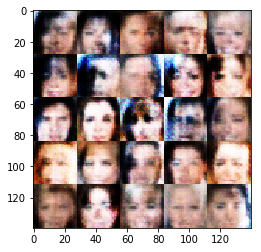

Epoch 1/2... Batch 810... Discriminator Loss: 1.3545... Generator Loss: 0.4932
Epoch 1/2... Batch 820... Discriminator Loss: 0.8983... Generator Loss: 0.9335
Epoch 1/2... Batch 830... Discriminator Loss: 1.1653... Generator Loss: 4.1377
Epoch 1/2... Batch 840... Discriminator Loss: 0.6066... Generator Loss: 1.6298
Epoch 1/2... Batch 850... Discriminator Loss: 0.8323... Generator Loss: 3.3956
Epoch 1/2... Batch 860... Discriminator Loss: 0.6802... Generator Loss: 1.4249
Epoch 1/2... Batch 870... Discriminator Loss: 0.9087... Generator Loss: 0.9274
Epoch 1/2... Batch 880... Discriminator Loss: 0.8240... Generator Loss: 0.9938
Epoch 1/2... Batch 890... Discriminator Loss: 0.5803... Generator Loss: 1.7268
Epoch 1/2... Batch 900... Discriminator Loss: 0.7106... Generator Loss: 1.3588


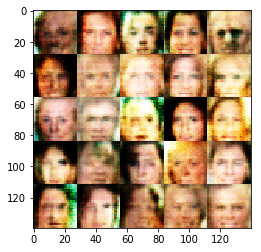

Epoch 1/2... Batch 910... Discriminator Loss: 1.3487... Generator Loss: 4.0272
Epoch 1/2... Batch 920... Discriminator Loss: 0.7600... Generator Loss: 1.1462
Epoch 1/2... Batch 930... Discriminator Loss: 0.7432... Generator Loss: 3.5183
Epoch 1/2... Batch 940... Discriminator Loss: 0.4619... Generator Loss: 2.4710
Epoch 1/2... Batch 950... Discriminator Loss: 0.4761... Generator Loss: 3.4845
Epoch 1/2... Batch 960... Discriminator Loss: 0.7934... Generator Loss: 1.2129
Epoch 1/2... Batch 970... Discriminator Loss: 0.6208... Generator Loss: 1.4532
Epoch 1/2... Batch 980... Discriminator Loss: 1.5419... Generator Loss: 3.8899
Epoch 1/2... Batch 990... Discriminator Loss: 0.9759... Generator Loss: 1.3178
Epoch 1/2... Batch 1000... Discriminator Loss: 0.6769... Generator Loss: 1.4925


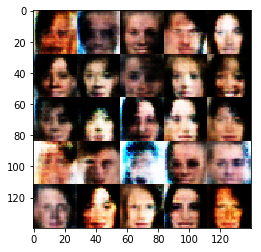

Epoch 1/2... Batch 1010... Discriminator Loss: 0.7584... Generator Loss: 1.1273
Epoch 1/2... Batch 1020... Discriminator Loss: 0.4991... Generator Loss: 2.0002
Epoch 1/2... Batch 1030... Discriminator Loss: 1.5131... Generator Loss: 0.4442
Epoch 1/2... Batch 1040... Discriminator Loss: 1.0292... Generator Loss: 0.8021
Epoch 1/2... Batch 1050... Discriminator Loss: 0.3879... Generator Loss: 3.3406
Epoch 1/2... Batch 1060... Discriminator Loss: 0.6617... Generator Loss: 1.4785
Epoch 1/2... Batch 1070... Discriminator Loss: 0.6060... Generator Loss: 4.5019
Epoch 1/2... Batch 1080... Discriminator Loss: 0.8305... Generator Loss: 1.0040
Epoch 1/2... Batch 1090... Discriminator Loss: 0.5747... Generator Loss: 1.7420
Epoch 1/2... Batch 1100... Discriminator Loss: 0.4124... Generator Loss: 4.0632


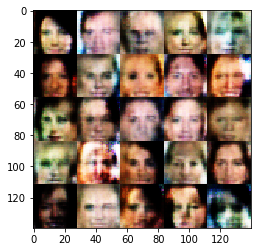

Epoch 1/2... Batch 1110... Discriminator Loss: 0.4813... Generator Loss: 2.4569
Epoch 1/2... Batch 1120... Discriminator Loss: 0.4225... Generator Loss: 3.1624
Epoch 1/2... Batch 1130... Discriminator Loss: 1.5427... Generator Loss: 0.3906
Epoch 1/2... Batch 1140... Discriminator Loss: 0.6214... Generator Loss: 1.5742
Epoch 1/2... Batch 1150... Discriminator Loss: 0.6426... Generator Loss: 1.4732
Epoch 1/2... Batch 1160... Discriminator Loss: 0.6839... Generator Loss: 2.4601
Epoch 1/2... Batch 1170... Discriminator Loss: 0.4982... Generator Loss: 3.8597
Epoch 1/2... Batch 1180... Discriminator Loss: 0.4333... Generator Loss: 2.8878
Epoch 1/2... Batch 1190... Discriminator Loss: 0.5899... Generator Loss: 1.6017
Epoch 1/2... Batch 1200... Discriminator Loss: 0.4648... Generator Loss: 4.1875


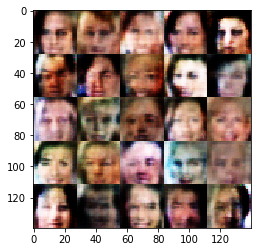

Epoch 1/2... Batch 1210... Discriminator Loss: 0.8471... Generator Loss: 1.0115
Epoch 1/2... Batch 1220... Discriminator Loss: 0.4570... Generator Loss: 2.5139
Epoch 1/2... Batch 1230... Discriminator Loss: 0.4089... Generator Loss: 3.2260
Epoch 1/2... Batch 1240... Discriminator Loss: 1.9486... Generator Loss: 4.0536
Epoch 1/2... Batch 1250... Discriminator Loss: 0.4690... Generator Loss: 3.8217
Epoch 1/2... Batch 1260... Discriminator Loss: 0.8426... Generator Loss: 0.9922
Epoch 1/2... Batch 1270... Discriminator Loss: 0.6866... Generator Loss: 2.7610
Epoch 1/2... Batch 1280... Discriminator Loss: 0.5655... Generator Loss: 4.2265
Epoch 1/2... Batch 1290... Discriminator Loss: 1.3192... Generator Loss: 3.1297
Epoch 1/2... Batch 1300... Discriminator Loss: 0.9311... Generator Loss: 3.4514


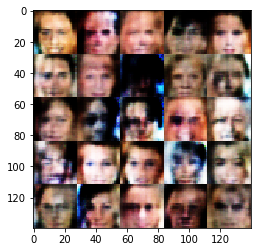

Epoch 1/2... Batch 1310... Discriminator Loss: 0.3934... Generator Loss: 4.1436
Epoch 1/2... Batch 1320... Discriminator Loss: 1.2734... Generator Loss: 0.6075
Epoch 1/2... Batch 1330... Discriminator Loss: 0.9514... Generator Loss: 0.9191
Epoch 1/2... Batch 1340... Discriminator Loss: 1.0132... Generator Loss: 0.7800
Epoch 1/2... Batch 1350... Discriminator Loss: 0.7887... Generator Loss: 1.1368
Epoch 1/2... Batch 1360... Discriminator Loss: 1.1868... Generator Loss: 3.1962
Epoch 1/2... Batch 1370... Discriminator Loss: 1.6698... Generator Loss: 0.3462
Epoch 1/2... Batch 1380... Discriminator Loss: 0.7210... Generator Loss: 1.3254
Epoch 1/2... Batch 1390... Discriminator Loss: 0.4810... Generator Loss: 2.3723
Epoch 1/2... Batch 1400... Discriminator Loss: 0.5507... Generator Loss: 1.8480


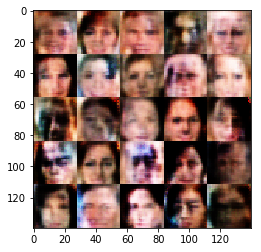

Epoch 1/2... Batch 1410... Discriminator Loss: 0.7681... Generator Loss: 4.1778
Epoch 1/2... Batch 1420... Discriminator Loss: 0.5931... Generator Loss: 1.8764
Epoch 1/2... Batch 1430... Discriminator Loss: 0.5183... Generator Loss: 2.0566
Epoch 1/2... Batch 1440... Discriminator Loss: 0.5030... Generator Loss: 2.0193
Epoch 1/2... Batch 1450... Discriminator Loss: 0.6595... Generator Loss: 1.5486
Epoch 1/2... Batch 1460... Discriminator Loss: 0.4878... Generator Loss: 2.2933
Epoch 1/2... Batch 1470... Discriminator Loss: 0.6452... Generator Loss: 1.5789
Epoch 1/2... Batch 1480... Discriminator Loss: 0.8428... Generator Loss: 1.3467
Epoch 1/2... Batch 1490... Discriminator Loss: 0.8834... Generator Loss: 2.9488
Epoch 1/2... Batch 1500... Discriminator Loss: 0.6179... Generator Loss: 4.8801


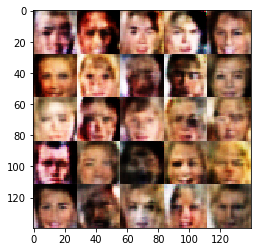

Epoch 1/2... Batch 1510... Discriminator Loss: 0.5919... Generator Loss: 1.7441
Epoch 1/2... Batch 1520... Discriminator Loss: 0.5248... Generator Loss: 1.9795
Epoch 1/2... Batch 1530... Discriminator Loss: 1.2683... Generator Loss: 0.5626
Epoch 1/2... Batch 1540... Discriminator Loss: 0.5684... Generator Loss: 2.1934
Epoch 1/2... Batch 1550... Discriminator Loss: 0.7100... Generator Loss: 3.9390
Epoch 1/2... Batch 1560... Discriminator Loss: 0.6258... Generator Loss: 3.7058
Epoch 1/2... Batch 1570... Discriminator Loss: 0.3755... Generator Loss: 3.6864
Epoch 1/2... Batch 1580... Discriminator Loss: 0.4302... Generator Loss: 2.6101
Epoch 1/2... Batch 1590... Discriminator Loss: 0.4719... Generator Loss: 2.7305
Epoch 1/2... Batch 1600... Discriminator Loss: 0.8203... Generator Loss: 2.8881


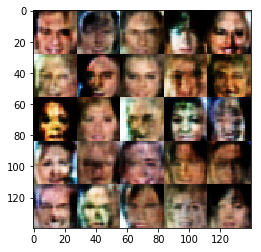

Epoch 1/2... Batch 1610... Discriminator Loss: 1.1959... Generator Loss: 0.6614
Epoch 1/2... Batch 1620... Discriminator Loss: 0.7103... Generator Loss: 1.3737
Epoch 1/2... Batch 1630... Discriminator Loss: 0.5457... Generator Loss: 2.5980
Epoch 1/2... Batch 1640... Discriminator Loss: 0.4150... Generator Loss: 3.3490
Epoch 1/2... Batch 1650... Discriminator Loss: 0.9009... Generator Loss: 0.9429
Epoch 1/2... Batch 1660... Discriminator Loss: 0.6239... Generator Loss: 4.2083
Epoch 1/2... Batch 1670... Discriminator Loss: 0.5195... Generator Loss: 3.3747
Epoch 1/2... Batch 1680... Discriminator Loss: 1.1834... Generator Loss: 0.6435
Epoch 1/2... Batch 1690... Discriminator Loss: 0.4585... Generator Loss: 2.6190
Epoch 1/2... Batch 1700... Discriminator Loss: 0.5279... Generator Loss: 1.9034


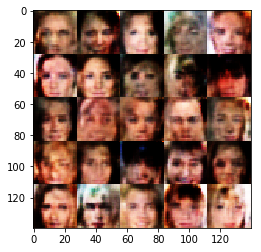

Epoch 1/2... Batch 1710... Discriminator Loss: 0.4913... Generator Loss: 2.4065
Epoch 1/2... Batch 1720... Discriminator Loss: 0.6396... Generator Loss: 2.3172
Epoch 1/2... Batch 1730... Discriminator Loss: 0.8921... Generator Loss: 4.1869
Epoch 1/2... Batch 1740... Discriminator Loss: 0.4912... Generator Loss: 3.7144
Epoch 1/2... Batch 1750... Discriminator Loss: 0.5822... Generator Loss: 1.6603
Epoch 1/2... Batch 1760... Discriminator Loss: 0.6420... Generator Loss: 4.6526
Epoch 1/2... Batch 1770... Discriminator Loss: 0.4298... Generator Loss: 2.9529
Epoch 1/2... Batch 1780... Discriminator Loss: 0.4200... Generator Loss: 2.8593
Epoch 1/2... Batch 1790... Discriminator Loss: 0.6986... Generator Loss: 1.3343
Epoch 1/2... Batch 1800... Discriminator Loss: 0.6781... Generator Loss: 1.3712


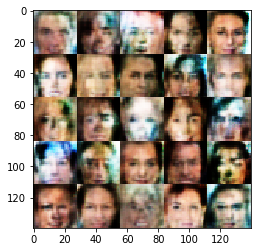

Epoch 1/2... Batch 1810... Discriminator Loss: 0.5267... Generator Loss: 1.9404
Epoch 1/2... Batch 1820... Discriminator Loss: 0.3696... Generator Loss: 3.5381
Epoch 1/2... Batch 1830... Discriminator Loss: 1.3062... Generator Loss: 0.5483
Epoch 1/2... Batch 1840... Discriminator Loss: 0.4850... Generator Loss: 3.7137
Epoch 1/2... Batch 1850... Discriminator Loss: 0.8881... Generator Loss: 3.6234
Epoch 1/2... Batch 1860... Discriminator Loss: 0.4116... Generator Loss: 4.1143
Epoch 1/2... Batch 1870... Discriminator Loss: 1.2105... Generator Loss: 0.6754
Epoch 1/2... Batch 1880... Discriminator Loss: 0.6219... Generator Loss: 1.5474
Epoch 1/2... Batch 1890... Discriminator Loss: 0.4273... Generator Loss: 3.9151
Epoch 1/2... Batch 1900... Discriminator Loss: 0.4980... Generator Loss: 3.5598


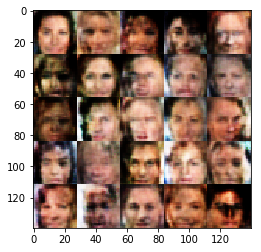

Epoch 1/2... Batch 1910... Discriminator Loss: 0.6388... Generator Loss: 2.6265
Epoch 1/2... Batch 1920... Discriminator Loss: 0.4621... Generator Loss: 2.4304
Epoch 1/2... Batch 1930... Discriminator Loss: 0.4658... Generator Loss: 2.3679
Epoch 1/2... Batch 1940... Discriminator Loss: 0.4619... Generator Loss: 2.4181
Epoch 1/2... Batch 1950... Discriminator Loss: 0.5308... Generator Loss: 1.9140
Epoch 1/2... Batch 1960... Discriminator Loss: 0.4319... Generator Loss: 2.7057
Epoch 1/2... Batch 1970... Discriminator Loss: 3.8573... Generator Loss: 4.5923
Epoch 1/2... Batch 1980... Discriminator Loss: 0.8481... Generator Loss: 1.1128
Epoch 1/2... Batch 1990... Discriminator Loss: 0.4356... Generator Loss: 4.5143
Epoch 1/2... Batch 2000... Discriminator Loss: 0.4986... Generator Loss: 4.0889


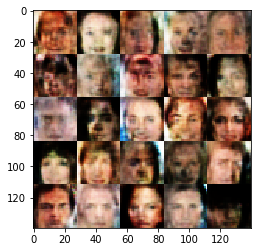

Epoch 1/2... Batch 2010... Discriminator Loss: 0.5624... Generator Loss: 1.8501
Epoch 1/2... Batch 2020... Discriminator Loss: 1.0999... Generator Loss: 0.7263
Epoch 1/2... Batch 2030... Discriminator Loss: 0.5015... Generator Loss: 2.1762
Epoch 1/2... Batch 2040... Discriminator Loss: 0.5212... Generator Loss: 1.9195
Epoch 1/2... Batch 2050... Discriminator Loss: 0.4549... Generator Loss: 3.0046
Epoch 1/2... Batch 2060... Discriminator Loss: 0.5524... Generator Loss: 2.6537
Epoch 1/2... Batch 2070... Discriminator Loss: 0.5885... Generator Loss: 3.4830
Epoch 1/2... Batch 2080... Discriminator Loss: 0.4202... Generator Loss: 4.6351
Epoch 1/2... Batch 2090... Discriminator Loss: 0.3725... Generator Loss: 4.2285
Epoch 1/2... Batch 2100... Discriminator Loss: 0.5948... Generator Loss: 1.8160


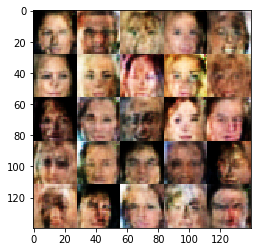

Epoch 1/2... Batch 2110... Discriminator Loss: 0.5896... Generator Loss: 3.8568
Epoch 1/2... Batch 2120... Discriminator Loss: 0.4581... Generator Loss: 2.6559
Epoch 1/2... Batch 2130... Discriminator Loss: 0.5037... Generator Loss: 2.1884
Epoch 1/2... Batch 2140... Discriminator Loss: 1.5128... Generator Loss: 0.4923
Epoch 1/2... Batch 2150... Discriminator Loss: 0.4551... Generator Loss: 2.8066
Epoch 1/2... Batch 2160... Discriminator Loss: 0.6633... Generator Loss: 1.4779
Epoch 1/2... Batch 2170... Discriminator Loss: 0.3709... Generator Loss: 4.0013
Epoch 1/2... Batch 2180... Discriminator Loss: 1.7199... Generator Loss: 3.6853
Epoch 1/2... Batch 2190... Discriminator Loss: 0.3724... Generator Loss: 4.0314
Epoch 1/2... Batch 2200... Discriminator Loss: 0.4256... Generator Loss: 2.7459


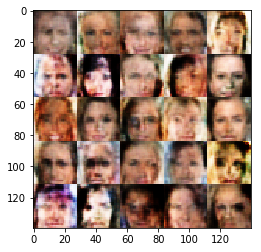

Epoch 1/2... Batch 2210... Discriminator Loss: 0.3880... Generator Loss: 3.5075
Epoch 1/2... Batch 2220... Discriminator Loss: 0.6573... Generator Loss: 1.4275
Epoch 1/2... Batch 2230... Discriminator Loss: 0.6785... Generator Loss: 5.9641
Epoch 1/2... Batch 2240... Discriminator Loss: 0.3732... Generator Loss: 3.6468
Epoch 1/2... Batch 2250... Discriminator Loss: 0.3769... Generator Loss: 4.9895
Epoch 1/2... Batch 2260... Discriminator Loss: 0.4336... Generator Loss: 4.5434
Epoch 1/2... Batch 2270... Discriminator Loss: 3.2448... Generator Loss: 4.1341
Epoch 1/2... Batch 2280... Discriminator Loss: 0.4419... Generator Loss: 2.6674
Epoch 1/2... Batch 2290... Discriminator Loss: 0.4331... Generator Loss: 3.9132
Epoch 1/2... Batch 2300... Discriminator Loss: 1.8153... Generator Loss: 0.4384


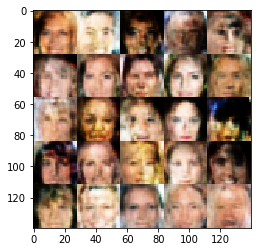

Epoch 1/2... Batch 2310... Discriminator Loss: 0.8794... Generator Loss: 2.7770
Epoch 1/2... Batch 2320... Discriminator Loss: 0.5421... Generator Loss: 2.1765
Epoch 1/2... Batch 2330... Discriminator Loss: 0.4572... Generator Loss: 3.7438
Epoch 1/2... Batch 2340... Discriminator Loss: 0.4999... Generator Loss: 3.7659
Epoch 1/2... Batch 2350... Discriminator Loss: 0.4474... Generator Loss: 3.4519
Epoch 1/2... Batch 2360... Discriminator Loss: 0.4885... Generator Loss: 3.5657
Epoch 1/2... Batch 2370... Discriminator Loss: 0.6514... Generator Loss: 4.2886
Epoch 1/2... Batch 2380... Discriminator Loss: 0.9988... Generator Loss: 2.8293
Epoch 1/2... Batch 2390... Discriminator Loss: 0.5184... Generator Loss: 2.9555
Epoch 1/2... Batch 2400... Discriminator Loss: 0.4041... Generator Loss: 3.2145


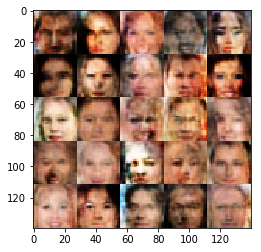

Epoch 1/2... Batch 2410... Discriminator Loss: 0.4636... Generator Loss: 2.2649
Epoch 1/2... Batch 2420... Discriminator Loss: 0.6139... Generator Loss: 1.6031
Epoch 1/2... Batch 2430... Discriminator Loss: 0.4512... Generator Loss: 2.9675
Epoch 1/2... Batch 2440... Discriminator Loss: 0.3722... Generator Loss: 3.5142
Epoch 1/2... Batch 2450... Discriminator Loss: 0.4406... Generator Loss: 4.2107
Epoch 1/2... Batch 2460... Discriminator Loss: 0.7699... Generator Loss: 4.1537
Epoch 1/2... Batch 2470... Discriminator Loss: 0.6599... Generator Loss: 2.6184
Epoch 1/2... Batch 2480... Discriminator Loss: 0.7720... Generator Loss: 3.1952
Epoch 1/2... Batch 2490... Discriminator Loss: 0.5311... Generator Loss: 2.4030
Epoch 1/2... Batch 2500... Discriminator Loss: 1.1257... Generator Loss: 0.6689


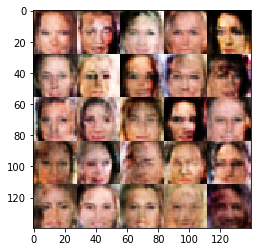

Epoch 1/2... Batch 2510... Discriminator Loss: 0.4032... Generator Loss: 2.8795
Epoch 1/2... Batch 2520... Discriminator Loss: 0.6223... Generator Loss: 1.5591
Epoch 1/2... Batch 2530... Discriminator Loss: 0.4074... Generator Loss: 2.9342
Epoch 1/2... Batch 2540... Discriminator Loss: 0.9747... Generator Loss: 4.3651
Epoch 1/2... Batch 2550... Discriminator Loss: 0.4168... Generator Loss: 3.3235
Epoch 1/2... Batch 2560... Discriminator Loss: 2.0898... Generator Loss: 0.2292
Epoch 1/2... Batch 2570... Discriminator Loss: 0.6862... Generator Loss: 1.6378
Epoch 1/2... Batch 2580... Discriminator Loss: 0.5422... Generator Loss: 3.5443
Epoch 1/2... Batch 2590... Discriminator Loss: 0.3851... Generator Loss: 3.3186
Epoch 1/2... Batch 2600... Discriminator Loss: 1.3087... Generator Loss: 4.0753


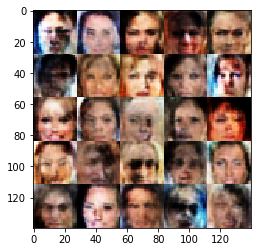

Epoch 1/2... Batch 2610... Discriminator Loss: 0.3745... Generator Loss: 3.8260
Epoch 1/2... Batch 2620... Discriminator Loss: 0.4849... Generator Loss: 3.5376
Epoch 1/2... Batch 2630... Discriminator Loss: 0.3769... Generator Loss: 4.5376
Epoch 1/2... Batch 2640... Discriminator Loss: 0.8139... Generator Loss: 5.2229
Epoch 1/2... Batch 2650... Discriminator Loss: 0.4175... Generator Loss: 3.2762
Epoch 1/2... Batch 2660... Discriminator Loss: 0.3897... Generator Loss: 3.7640
Epoch 1/2... Batch 2670... Discriminator Loss: 0.3563... Generator Loss: 4.1968
Epoch 1/2... Batch 2680... Discriminator Loss: 0.3649... Generator Loss: 3.8995
Epoch 1/2... Batch 2690... Discriminator Loss: 1.0886... Generator Loss: 2.7148
Epoch 1/2... Batch 2700... Discriminator Loss: 0.4479... Generator Loss: 3.1597


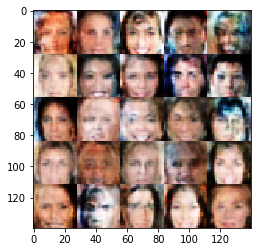

Epoch 1/2... Batch 2710... Discriminator Loss: 1.7768... Generator Loss: 3.3553
Epoch 1/2... Batch 2720... Discriminator Loss: 0.3879... Generator Loss: 3.1866
Epoch 1/2... Batch 2730... Discriminator Loss: 0.3854... Generator Loss: 3.4839
Epoch 1/2... Batch 2740... Discriminator Loss: 0.4739... Generator Loss: 5.2328
Epoch 1/2... Batch 2750... Discriminator Loss: 1.0559... Generator Loss: 4.7393
Epoch 1/2... Batch 2760... Discriminator Loss: 0.4190... Generator Loss: 3.9570
Epoch 1/2... Batch 2770... Discriminator Loss: 1.4593... Generator Loss: 5.1339
Epoch 1/2... Batch 2780... Discriminator Loss: 0.7057... Generator Loss: 1.6503
Epoch 1/2... Batch 2790... Discriminator Loss: 0.5288... Generator Loss: 1.9070
Epoch 1/2... Batch 2800... Discriminator Loss: 0.7042... Generator Loss: 1.3766


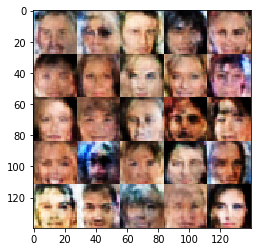

Epoch 1/2... Batch 2810... Discriminator Loss: 0.4057... Generator Loss: 3.2580
Epoch 1/2... Batch 2820... Discriminator Loss: 0.4487... Generator Loss: 3.3127
Epoch 1/2... Batch 2830... Discriminator Loss: 0.3638... Generator Loss: 3.9120
Epoch 1/2... Batch 2840... Discriminator Loss: 0.4308... Generator Loss: 2.7194
Epoch 1/2... Batch 2850... Discriminator Loss: 0.3839... Generator Loss: 3.5778
Epoch 1/2... Batch 2860... Discriminator Loss: 0.3596... Generator Loss: 4.0961
Epoch 1/2... Batch 2870... Discriminator Loss: 0.6311... Generator Loss: 1.9366
Epoch 1/2... Batch 2880... Discriminator Loss: 0.4250... Generator Loss: 2.9755
Epoch 1/2... Batch 2890... Discriminator Loss: 0.7641... Generator Loss: 2.9876
Epoch 1/2... Batch 2900... Discriminator Loss: 0.7997... Generator Loss: 1.1802


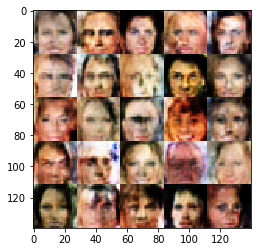

Epoch 1/2... Batch 2910... Discriminator Loss: 1.1710... Generator Loss: 3.3100
Epoch 1/2... Batch 2920... Discriminator Loss: 0.8346... Generator Loss: 1.2637
Epoch 1/2... Batch 2930... Discriminator Loss: 0.4015... Generator Loss: 3.0142
Epoch 1/2... Batch 2940... Discriminator Loss: 1.2556... Generator Loss: 5.1014
Epoch 1/2... Batch 2950... Discriminator Loss: 0.4030... Generator Loss: 3.6189
Epoch 1/2... Batch 2960... Discriminator Loss: 0.4342... Generator Loss: 3.0729
Epoch 1/2... Batch 2970... Discriminator Loss: 0.4014... Generator Loss: 2.8930
Epoch 1/2... Batch 2980... Discriminator Loss: 0.4486... Generator Loss: 4.4130
Epoch 1/2... Batch 2990... Discriminator Loss: 0.4631... Generator Loss: 4.6203
Epoch 1/2... Batch 3000... Discriminator Loss: 0.4258... Generator Loss: 3.8477


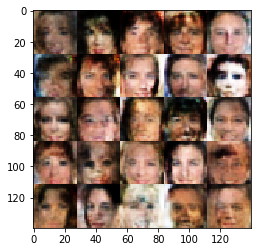

Epoch 1/2... Batch 3010... Discriminator Loss: 0.3434... Generator Loss: 4.7111
Epoch 1/2... Batch 3020... Discriminator Loss: 0.3991... Generator Loss: 3.1869
Epoch 1/2... Batch 3030... Discriminator Loss: 0.6685... Generator Loss: 4.9915
Epoch 1/2... Batch 3040... Discriminator Loss: 0.6698... Generator Loss: 2.7564
Epoch 1/2... Batch 3050... Discriminator Loss: 0.3591... Generator Loss: 4.3284
Epoch 1/2... Batch 3060... Discriminator Loss: 0.4895... Generator Loss: 4.1587
Epoch 1/2... Batch 3070... Discriminator Loss: 0.3919... Generator Loss: 3.8200
Epoch 1/2... Batch 3080... Discriminator Loss: 0.3601... Generator Loss: 3.9596
Epoch 1/2... Batch 3090... Discriminator Loss: 0.6220... Generator Loss: 1.6755
Epoch 1/2... Batch 3100... Discriminator Loss: 0.4374... Generator Loss: 2.7851


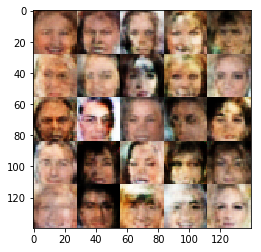

Epoch 1/2... Batch 3110... Discriminator Loss: 0.8727... Generator Loss: 0.9915
Epoch 1/2... Batch 3120... Discriminator Loss: 0.5125... Generator Loss: 2.0590
Epoch 1/2... Batch 3130... Discriminator Loss: 0.3974... Generator Loss: 3.3019
Epoch 1/2... Batch 3140... Discriminator Loss: 0.9948... Generator Loss: 1.1713
Epoch 1/2... Batch 3150... Discriminator Loss: 0.6800... Generator Loss: 2.2162
Epoch 1/2... Batch 3160... Discriminator Loss: 0.4696... Generator Loss: 2.3849
Epoch 1/2... Batch 3170... Discriminator Loss: 1.1615... Generator Loss: 5.0742
Epoch 1/2... Batch 3180... Discriminator Loss: 0.5051... Generator Loss: 2.0525
Epoch 1/2... Batch 3190... Discriminator Loss: 0.4004... Generator Loss: 4.0789
Epoch 1/2... Batch 3200... Discriminator Loss: 0.5400... Generator Loss: 2.6639


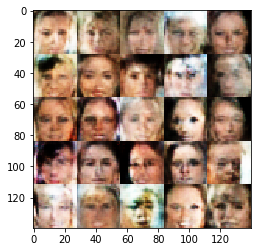

Epoch 1/2... Batch 3210... Discriminator Loss: 0.3914... Generator Loss: 3.3250
Epoch 1/2... Batch 3220... Discriminator Loss: 1.0339... Generator Loss: 0.9233
Epoch 1/2... Batch 3230... Discriminator Loss: 0.4127... Generator Loss: 3.1956
Epoch 1/2... Batch 3240... Discriminator Loss: 0.4235... Generator Loss: 2.6917
Epoch 1/2... Batch 3250... Discriminator Loss: 0.4765... Generator Loss: 2.2115
Epoch 1/2... Batch 3260... Discriminator Loss: 0.4194... Generator Loss: 2.8999
Epoch 1/2... Batch 3270... Discriminator Loss: 1.8190... Generator Loss: 0.3290
Epoch 1/2... Batch 3280... Discriminator Loss: 0.7228... Generator Loss: 1.7646
Epoch 1/2... Batch 3290... Discriminator Loss: 2.8159... Generator Loss: 5.2665
Epoch 1/2... Batch 3300... Discriminator Loss: 0.4318... Generator Loss: 3.0318


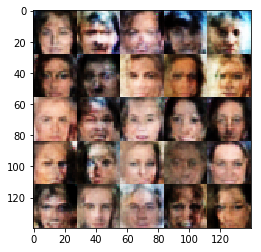

Epoch 1/2... Batch 3310... Discriminator Loss: 0.8475... Generator Loss: 1.9283
Epoch 1/2... Batch 3320... Discriminator Loss: 1.4278... Generator Loss: 0.5074
Epoch 1/2... Batch 3330... Discriminator Loss: 0.8580... Generator Loss: 1.0124
Epoch 1/2... Batch 3340... Discriminator Loss: 0.4139... Generator Loss: 3.8004
Epoch 1/2... Batch 3350... Discriminator Loss: 0.4110... Generator Loss: 3.6259
Epoch 1/2... Batch 3360... Discriminator Loss: 0.3914... Generator Loss: 3.3474
Epoch 1/2... Batch 3370... Discriminator Loss: 0.5015... Generator Loss: 3.7518
Epoch 1/2... Batch 3380... Discriminator Loss: 0.3812... Generator Loss: 5.6737
Epoch 1/2... Batch 3390... Discriminator Loss: 0.5623... Generator Loss: 3.9363
Epoch 1/2... Batch 3400... Discriminator Loss: 0.7144... Generator Loss: 1.3068


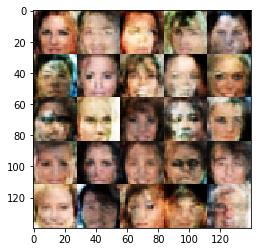

Epoch 1/2... Batch 3410... Discriminator Loss: 1.0115... Generator Loss: 0.7983
Epoch 1/2... Batch 3420... Discriminator Loss: 0.6645... Generator Loss: 1.4010
Epoch 1/2... Batch 3430... Discriminator Loss: 0.3773... Generator Loss: 3.2576
Epoch 1/2... Batch 3440... Discriminator Loss: 0.4781... Generator Loss: 2.3269
Epoch 1/2... Batch 3450... Discriminator Loss: 0.7011... Generator Loss: 1.2945
Epoch 1/2... Batch 3460... Discriminator Loss: 0.4259... Generator Loss: 2.7596
Epoch 1/2... Batch 3470... Discriminator Loss: 0.5698... Generator Loss: 5.6042
Epoch 1/2... Batch 3480... Discriminator Loss: 0.7637... Generator Loss: 1.5242
Epoch 1/2... Batch 3490... Discriminator Loss: 0.3645... Generator Loss: 3.8302
Epoch 1/2... Batch 3500... Discriminator Loss: 0.9105... Generator Loss: 4.9557


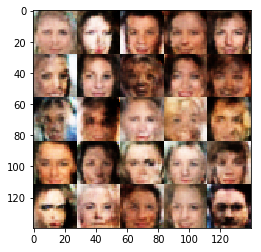

Epoch 1/2... Batch 3510... Discriminator Loss: 0.4215... Generator Loss: 2.6648
Epoch 1/2... Batch 3520... Discriminator Loss: 0.4769... Generator Loss: 2.6851
Epoch 1/2... Batch 3530... Discriminator Loss: 0.3446... Generator Loss: 5.7129
Epoch 1/2... Batch 3540... Discriminator Loss: 0.5398... Generator Loss: 2.0811
Epoch 1/2... Batch 3550... Discriminator Loss: 0.3672... Generator Loss: 3.7670
Epoch 1/2... Batch 3560... Discriminator Loss: 0.7112... Generator Loss: 1.4949
Epoch 1/2... Batch 3570... Discriminator Loss: 1.0665... Generator Loss: 2.8898
Epoch 1/2... Batch 3580... Discriminator Loss: 0.4046... Generator Loss: 3.0406
Epoch 1/2... Batch 3590... Discriminator Loss: 0.4179... Generator Loss: 2.8673
Epoch 1/2... Batch 3600... Discriminator Loss: 0.4255... Generator Loss: 5.5480


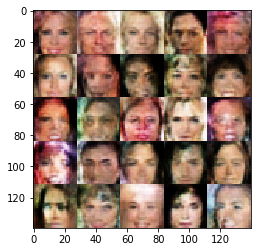

Epoch 1/2... Batch 3610... Discriminator Loss: 0.9973... Generator Loss: 2.3939
Epoch 1/2... Batch 3620... Discriminator Loss: 0.6035... Generator Loss: 3.0502
Epoch 1/2... Batch 3630... Discriminator Loss: 0.4765... Generator Loss: 2.9429
Epoch 1/2... Batch 3640... Discriminator Loss: 0.3741... Generator Loss: 3.5112
Epoch 1/2... Batch 3650... Discriminator Loss: 0.5078... Generator Loss: 4.3535
Epoch 1/2... Batch 3660... Discriminator Loss: 0.6076... Generator Loss: 1.7355
Epoch 1/2... Batch 3670... Discriminator Loss: 0.5264... Generator Loss: 1.9853
Epoch 1/2... Batch 3680... Discriminator Loss: 0.5377... Generator Loss: 5.5351
Epoch 1/2... Batch 3690... Discriminator Loss: 0.4282... Generator Loss: 2.8333
Epoch 1/2... Batch 3700... Discriminator Loss: 0.3510... Generator Loss: 4.4335


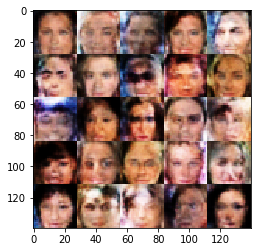

Epoch 1/2... Batch 3710... Discriminator Loss: 1.7005... Generator Loss: 0.3634
Epoch 1/2... Batch 3720... Discriminator Loss: 0.4923... Generator Loss: 2.9638
Epoch 1/2... Batch 3730... Discriminator Loss: 1.7051... Generator Loss: 0.3586
Epoch 1/2... Batch 3740... Discriminator Loss: 0.6641... Generator Loss: 1.4541
Epoch 1/2... Batch 3750... Discriminator Loss: 0.4055... Generator Loss: 2.9912
Epoch 1/2... Batch 3760... Discriminator Loss: 0.7134... Generator Loss: 3.4701
Epoch 1/2... Batch 3770... Discriminator Loss: 0.4837... Generator Loss: 2.2455
Epoch 1/2... Batch 3780... Discriminator Loss: 0.3835... Generator Loss: 4.6331
Epoch 1/2... Batch 3790... Discriminator Loss: 0.5488... Generator Loss: 2.2378
Epoch 1/2... Batch 3800... Discriminator Loss: 0.6652... Generator Loss: 1.4426


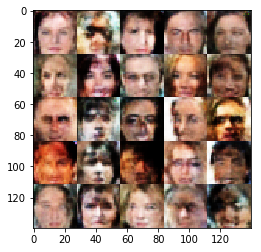

Epoch 1/2... Batch 3810... Discriminator Loss: 2.2514... Generator Loss: 3.9816
Epoch 1/2... Batch 3820... Discriminator Loss: 0.4249... Generator Loss: 2.5965
Epoch 1/2... Batch 3830... Discriminator Loss: 0.3581... Generator Loss: 4.1173
Epoch 1/2... Batch 3840... Discriminator Loss: 0.7044... Generator Loss: 4.8875
Epoch 1/2... Batch 3850... Discriminator Loss: 0.3904... Generator Loss: 4.3457
Epoch 1/2... Batch 3860... Discriminator Loss: 0.4292... Generator Loss: 3.7642
Epoch 1/2... Batch 3870... Discriminator Loss: 0.3585... Generator Loss: 4.2052
Epoch 1/2... Batch 3880... Discriminator Loss: 1.4861... Generator Loss: 0.4298
Epoch 1/2... Batch 3890... Discriminator Loss: 0.4850... Generator Loss: 3.1209
Epoch 1/2... Batch 3900... Discriminator Loss: 0.3710... Generator Loss: 3.9570


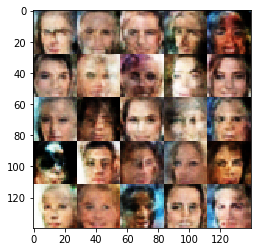

Epoch 1/2... Batch 3910... Discriminator Loss: 0.3865... Generator Loss: 3.4311
Epoch 1/2... Batch 3920... Discriminator Loss: 0.3841... Generator Loss: 3.3010
Epoch 1/2... Batch 3930... Discriminator Loss: 0.4253... Generator Loss: 3.0707
Epoch 1/2... Batch 3940... Discriminator Loss: 0.3717... Generator Loss: 4.0198
Epoch 1/2... Batch 3950... Discriminator Loss: 0.3484... Generator Loss: 4.5138
Epoch 1/2... Batch 3960... Discriminator Loss: 0.3598... Generator Loss: 4.6423
Epoch 1/2... Batch 3970... Discriminator Loss: 1.6370... Generator Loss: 3.0329
Epoch 1/2... Batch 3980... Discriminator Loss: 0.4490... Generator Loss: 2.6083
Epoch 1/2... Batch 3990... Discriminator Loss: 0.6615... Generator Loss: 4.7462
Epoch 1/2... Batch 4000... Discriminator Loss: 0.3582... Generator Loss: 4.1431


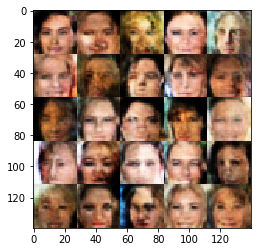

Epoch 1/2... Batch 4010... Discriminator Loss: 0.6478... Generator Loss: 1.6047
Epoch 1/2... Batch 4020... Discriminator Loss: 0.4137... Generator Loss: 3.9215
Epoch 1/2... Batch 4030... Discriminator Loss: 0.6570... Generator Loss: 3.9604
Epoch 1/2... Batch 4040... Discriminator Loss: 0.6248... Generator Loss: 2.5328
Epoch 1/2... Batch 4050... Discriminator Loss: 0.6464... Generator Loss: 3.1158
Epoch 1/2... Batch 4060... Discriminator Loss: 0.8156... Generator Loss: 1.3655
Epoch 1/2... Batch 4070... Discriminator Loss: 0.3458... Generator Loss: 4.7249
Epoch 1/2... Batch 4080... Discriminator Loss: 0.6227... Generator Loss: 4.4957
Epoch 1/2... Batch 4090... Discriminator Loss: 0.4294... Generator Loss: 2.8354
Epoch 1/2... Batch 4100... Discriminator Loss: 0.3970... Generator Loss: 3.7242


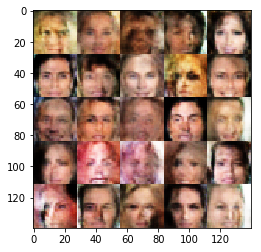

Epoch 1/2... Batch 4110... Discriminator Loss: 0.3826... Generator Loss: 3.7266
Epoch 1/2... Batch 4120... Discriminator Loss: 0.6268... Generator Loss: 1.6913
Epoch 1/2... Batch 4130... Discriminator Loss: 0.3970... Generator Loss: 3.7537
Epoch 1/2... Batch 4140... Discriminator Loss: 1.6866... Generator Loss: 3.3583
Epoch 1/2... Batch 4150... Discriminator Loss: 0.3864... Generator Loss: 4.7324
Epoch 1/2... Batch 4160... Discriminator Loss: 0.5067... Generator Loss: 2.4766
Epoch 1/2... Batch 4170... Discriminator Loss: 0.4177... Generator Loss: 3.2467
Epoch 1/2... Batch 4180... Discriminator Loss: 1.1283... Generator Loss: 3.0943
Epoch 1/2... Batch 4190... Discriminator Loss: 0.7213... Generator Loss: 3.7785
Epoch 1/2... Batch 4200... Discriminator Loss: 0.5285... Generator Loss: 3.8779


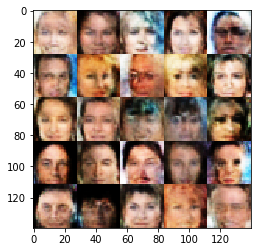

Epoch 1/2... Batch 4210... Discriminator Loss: 1.3819... Generator Loss: 3.6160
Epoch 1/2... Batch 4220... Discriminator Loss: 0.4145... Generator Loss: 2.8386
Epoch 1/2... Batch 4230... Discriminator Loss: 0.3764... Generator Loss: 3.6160
Epoch 1/2... Batch 4240... Discriminator Loss: 0.5506... Generator Loss: 2.2150
Epoch 1/2... Batch 4250... Discriminator Loss: 0.3948... Generator Loss: 3.1470
Epoch 1/2... Batch 4260... Discriminator Loss: 0.3494... Generator Loss: 4.3396
Epoch 1/2... Batch 4270... Discriminator Loss: 1.0144... Generator Loss: 0.8150
Epoch 1/2... Batch 4280... Discriminator Loss: 0.3877... Generator Loss: 3.4192
Epoch 1/2... Batch 4290... Discriminator Loss: 0.3594... Generator Loss: 4.2134
Epoch 1/2... Batch 4300... Discriminator Loss: 0.7321... Generator Loss: 3.9216


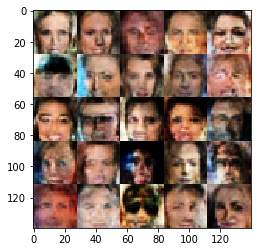

Epoch 1/2... Batch 4310... Discriminator Loss: 0.3774... Generator Loss: 3.8466
Epoch 1/2... Batch 4320... Discriminator Loss: 0.4386... Generator Loss: 2.8079
Epoch 1/2... Batch 4330... Discriminator Loss: 0.3979... Generator Loss: 3.9552
Epoch 1/2... Batch 4340... Discriminator Loss: 0.3638... Generator Loss: 4.0728
Epoch 1/2... Batch 4350... Discriminator Loss: 0.6411... Generator Loss: 1.7253
Epoch 1/2... Batch 4360... Discriminator Loss: 0.3738... Generator Loss: 4.9486
Epoch 1/2... Batch 4370... Discriminator Loss: 0.3523... Generator Loss: 5.0631
Epoch 1/2... Batch 4380... Discriminator Loss: 0.6008... Generator Loss: 2.3398
Epoch 1/2... Batch 4390... Discriminator Loss: 0.8071... Generator Loss: 1.5314
Epoch 1/2... Batch 4400... Discriminator Loss: 0.4473... Generator Loss: 2.5112


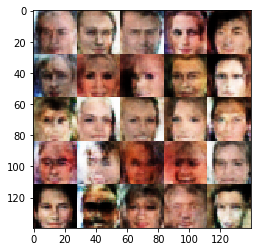

Epoch 1/2... Batch 4410... Discriminator Loss: 1.0199... Generator Loss: 4.8990
Epoch 1/2... Batch 4420... Discriminator Loss: 0.4203... Generator Loss: 2.7048
Epoch 1/2... Batch 4430... Discriminator Loss: 0.3671... Generator Loss: 3.8705
Epoch 1/2... Batch 4440... Discriminator Loss: 0.4038... Generator Loss: 3.0354
Epoch 1/2... Batch 4450... Discriminator Loss: 0.5532... Generator Loss: 1.9655
Epoch 1/2... Batch 4460... Discriminator Loss: 0.3479... Generator Loss: 5.2907
Epoch 1/2... Batch 4470... Discriminator Loss: 0.3555... Generator Loss: 4.8726
Epoch 1/2... Batch 4480... Discriminator Loss: 0.3596... Generator Loss: 3.9650
Epoch 1/2... Batch 4490... Discriminator Loss: 0.3703... Generator Loss: 3.5802
Epoch 1/2... Batch 4500... Discriminator Loss: 0.3726... Generator Loss: 3.9093


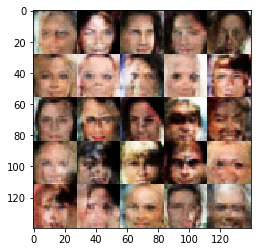

Epoch 1/2... Batch 4510... Discriminator Loss: 5.5564... Generator Loss: 6.9998
Epoch 1/2... Batch 4520... Discriminator Loss: 0.4433... Generator Loss: 2.5647
Epoch 1/2... Batch 4530... Discriminator Loss: 0.6288... Generator Loss: 1.5115
Epoch 1/2... Batch 4540... Discriminator Loss: 0.9433... Generator Loss: 3.1506
Epoch 1/2... Batch 4550... Discriminator Loss: 0.3704... Generator Loss: 3.5654
Epoch 1/2... Batch 4560... Discriminator Loss: 0.4058... Generator Loss: 2.8312
Epoch 1/2... Batch 4570... Discriminator Loss: 0.4015... Generator Loss: 4.4669
Epoch 1/2... Batch 4580... Discriminator Loss: 0.3425... Generator Loss: 4.9732
Epoch 1/2... Batch 4590... Discriminator Loss: 0.3608... Generator Loss: 5.1437
Epoch 1/2... Batch 4600... Discriminator Loss: 0.3473... Generator Loss: 5.2382


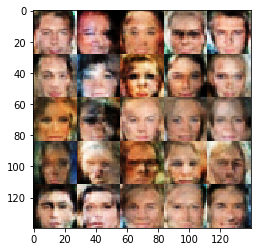

Epoch 1/2... Batch 4610... Discriminator Loss: 0.6506... Generator Loss: 4.8766
Epoch 1/2... Batch 4620... Discriminator Loss: 0.4095... Generator Loss: 4.8213
Epoch 1/2... Batch 4630... Discriminator Loss: 0.4275... Generator Loss: 3.6834
Epoch 1/2... Batch 4640... Discriminator Loss: 0.5778... Generator Loss: 1.7264
Epoch 1/2... Batch 4650... Discriminator Loss: 0.4032... Generator Loss: 5.3334
Epoch 1/2... Batch 4660... Discriminator Loss: 0.3727... Generator Loss: 3.9708
Epoch 1/2... Batch 4670... Discriminator Loss: 0.4026... Generator Loss: 3.4156
Epoch 1/2... Batch 4680... Discriminator Loss: 0.3892... Generator Loss: 5.1190
Epoch 1/2... Batch 4690... Discriminator Loss: 0.3366... Generator Loss: 5.1747
Epoch 1/2... Batch 4700... Discriminator Loss: 0.6248... Generator Loss: 2.8891


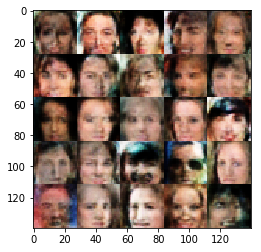

Epoch 1/2... Batch 4710... Discriminator Loss: 2.4157... Generator Loss: 4.0798
Epoch 1/2... Batch 4720... Discriminator Loss: 0.4034... Generator Loss: 3.6291
Epoch 1/2... Batch 4730... Discriminator Loss: 0.5491... Generator Loss: 5.4213
Epoch 1/2... Batch 4740... Discriminator Loss: 0.4939... Generator Loss: 2.9696
Epoch 1/2... Batch 4750... Discriminator Loss: 0.4192... Generator Loss: 5.1995
Epoch 1/2... Batch 4760... Discriminator Loss: 0.4856... Generator Loss: 2.2871
Epoch 1/2... Batch 4770... Discriminator Loss: 0.4190... Generator Loss: 2.7515
Epoch 1/2... Batch 4780... Discriminator Loss: 0.3830... Generator Loss: 3.6845
Epoch 1/2... Batch 4790... Discriminator Loss: 0.3698... Generator Loss: 3.6075
Epoch 1/2... Batch 4800... Discriminator Loss: 0.4890... Generator Loss: 3.5134


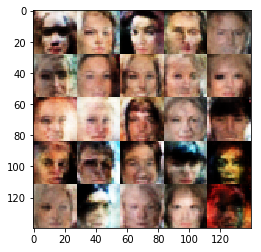

Epoch 1/2... Batch 4810... Discriminator Loss: 1.5745... Generator Loss: 3.3373
Epoch 1/2... Batch 4820... Discriminator Loss: 0.4221... Generator Loss: 2.7658
Epoch 1/2... Batch 4830... Discriminator Loss: 0.4121... Generator Loss: 3.1149
Epoch 1/2... Batch 4840... Discriminator Loss: 0.3479... Generator Loss: 4.4808
Epoch 1/2... Batch 4850... Discriminator Loss: 2.2323... Generator Loss: 0.2144
Epoch 1/2... Batch 4860... Discriminator Loss: 0.3964... Generator Loss: 3.0559
Epoch 1/2... Batch 4870... Discriminator Loss: 0.7353... Generator Loss: 4.9778
Epoch 1/2... Batch 4880... Discriminator Loss: 0.8669... Generator Loss: 1.7676
Epoch 1/2... Batch 4890... Discriminator Loss: 0.4973... Generator Loss: 2.4137
Epoch 1/2... Batch 4900... Discriminator Loss: 0.6609... Generator Loss: 1.4049


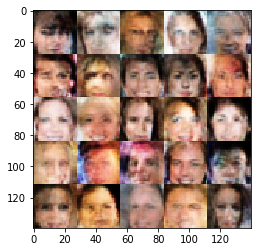

Epoch 1/2... Batch 4910... Discriminator Loss: 0.3591... Generator Loss: 3.8805
Epoch 1/2... Batch 4920... Discriminator Loss: 0.3908... Generator Loss: 3.9895
Epoch 1/2... Batch 4930... Discriminator Loss: 0.3562... Generator Loss: 4.4867
Epoch 1/2... Batch 4940... Discriminator Loss: 0.3785... Generator Loss: 3.8977
Epoch 1/2... Batch 4950... Discriminator Loss: 1.6108... Generator Loss: 3.9314
Epoch 1/2... Batch 4960... Discriminator Loss: 0.3635... Generator Loss: 3.8472
Epoch 1/2... Batch 4970... Discriminator Loss: 0.4360... Generator Loss: 2.5088
Epoch 1/2... Batch 4980... Discriminator Loss: 0.4036... Generator Loss: 3.0687
Epoch 1/2... Batch 4990... Discriminator Loss: 0.3677... Generator Loss: 4.1201
Epoch 1/2... Batch 5000... Discriminator Loss: 0.4077... Generator Loss: 4.2750


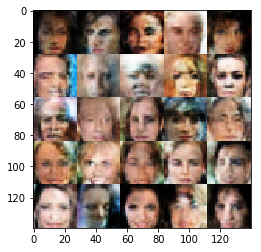

Epoch 1/2... Batch 5010... Discriminator Loss: 1.5716... Generator Loss: 3.7463
Epoch 1/2... Batch 5020... Discriminator Loss: 0.4021... Generator Loss: 3.8732
Epoch 1/2... Batch 5030... Discriminator Loss: 0.6324... Generator Loss: 4.0357
Epoch 1/2... Batch 5040... Discriminator Loss: 0.4512... Generator Loss: 3.8001
Epoch 1/2... Batch 5050... Discriminator Loss: 0.4730... Generator Loss: 4.6926
Epoch 1/2... Batch 5060... Discriminator Loss: 1.3567... Generator Loss: 3.2992
Epoch 1/2... Batch 5070... Discriminator Loss: 0.3870... Generator Loss: 3.8377
Epoch 1/2... Batch 5080... Discriminator Loss: 0.5688... Generator Loss: 1.9813
Epoch 1/2... Batch 5090... Discriminator Loss: 0.3671... Generator Loss: 5.3297
Epoch 1/2... Batch 5100... Discriminator Loss: 0.4139... Generator Loss: 2.9672


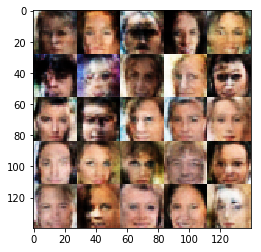

Epoch 1/2... Batch 5110... Discriminator Loss: 0.4407... Generator Loss: 2.4365
Epoch 1/2... Batch 5120... Discriminator Loss: 0.3666... Generator Loss: 5.7427
Epoch 1/2... Batch 5130... Discriminator Loss: 1.0161... Generator Loss: 5.8605
Epoch 1/2... Batch 5140... Discriminator Loss: 0.4052... Generator Loss: 2.9594
Epoch 1/2... Batch 5150... Discriminator Loss: 0.3585... Generator Loss: 4.0516
Epoch 1/2... Batch 5160... Discriminator Loss: 0.3452... Generator Loss: 4.6847
Epoch 1/2... Batch 5170... Discriminator Loss: 0.3569... Generator Loss: 4.5598
Epoch 1/2... Batch 5180... Discriminator Loss: 1.8061... Generator Loss: 3.0016
Epoch 1/2... Batch 5190... Discriminator Loss: 0.5765... Generator Loss: 2.1606
Epoch 1/2... Batch 5200... Discriminator Loss: 0.4119... Generator Loss: 2.9127


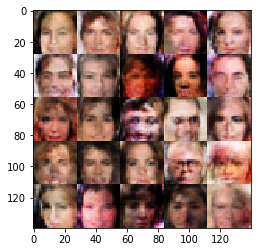

Epoch 1/2... Batch 5210... Discriminator Loss: 0.3881... Generator Loss: 3.3336
Epoch 1/2... Batch 5220... Discriminator Loss: 0.4165... Generator Loss: 3.5951
Epoch 1/2... Batch 5230... Discriminator Loss: 0.6474... Generator Loss: 1.7295
Epoch 1/2... Batch 5240... Discriminator Loss: 0.3774... Generator Loss: 5.0643
Epoch 1/2... Batch 5250... Discriminator Loss: 0.3601... Generator Loss: 4.2264
Epoch 1/2... Batch 5260... Discriminator Loss: 0.4589... Generator Loss: 2.3933
Epoch 1/2... Batch 5270... Discriminator Loss: 0.3642... Generator Loss: 4.9247
Epoch 1/2... Batch 5280... Discriminator Loss: 0.5081... Generator Loss: 3.8264
Epoch 1/2... Batch 5290... Discriminator Loss: 0.4541... Generator Loss: 4.0743
Epoch 1/2... Batch 5300... Discriminator Loss: 0.4172... Generator Loss: 5.2863


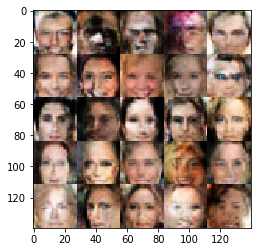

Epoch 1/2... Batch 5310... Discriminator Loss: 0.9562... Generator Loss: 1.6101
Epoch 1/2... Batch 5320... Discriminator Loss: 0.3576... Generator Loss: 3.9177
Epoch 1/2... Batch 5330... Discriminator Loss: 0.4926... Generator Loss: 2.5551
Epoch 1/2... Batch 5340... Discriminator Loss: 0.3758... Generator Loss: 3.5429
Epoch 1/2... Batch 5350... Discriminator Loss: 0.3621... Generator Loss: 4.1898
Epoch 1/2... Batch 5360... Discriminator Loss: 0.3826... Generator Loss: 3.3742
Epoch 1/2... Batch 5370... Discriminator Loss: 0.6642... Generator Loss: 3.8821
Epoch 1/2... Batch 5380... Discriminator Loss: 0.3552... Generator Loss: 4.9765
Epoch 1/2... Batch 5390... Discriminator Loss: 0.3463... Generator Loss: 5.1598
Epoch 1/2... Batch 5400... Discriminator Loss: 0.3576... Generator Loss: 4.1009


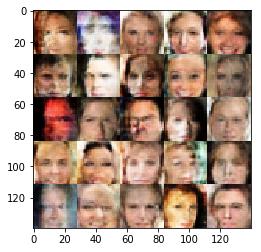

Epoch 1/2... Batch 5410... Discriminator Loss: 0.3548... Generator Loss: 4.2144
Epoch 1/2... Batch 5420... Discriminator Loss: 0.3446... Generator Loss: 4.9949
Epoch 1/2... Batch 5430... Discriminator Loss: 0.4163... Generator Loss: 2.7414
Epoch 1/2... Batch 5440... Discriminator Loss: 2.7437... Generator Loss: 0.1527
Epoch 1/2... Batch 5450... Discriminator Loss: 0.4785... Generator Loss: 2.7465
Epoch 1/2... Batch 5460... Discriminator Loss: 0.3769... Generator Loss: 3.5669
Epoch 1/2... Batch 5470... Discriminator Loss: 0.4716... Generator Loss: 2.8690
Epoch 1/2... Batch 5480... Discriminator Loss: 0.3853... Generator Loss: 3.3009
Epoch 1/2... Batch 5490... Discriminator Loss: 0.3738... Generator Loss: 3.5251
Epoch 1/2... Batch 5500... Discriminator Loss: 0.3705... Generator Loss: 5.4510


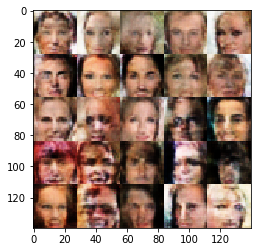

Epoch 1/2... Batch 5510... Discriminator Loss: 0.3514... Generator Loss: 4.3895
Epoch 1/2... Batch 5520... Discriminator Loss: 1.0174... Generator Loss: 6.6969
Epoch 1/2... Batch 5530... Discriminator Loss: 0.5058... Generator Loss: 2.0526
Epoch 1/2... Batch 5540... Discriminator Loss: 0.3622... Generator Loss: 4.3353
Epoch 1/2... Batch 5550... Discriminator Loss: 0.3872... Generator Loss: 3.5194
Epoch 1/2... Batch 5560... Discriminator Loss: 0.3723... Generator Loss: 5.4194
Epoch 1/2... Batch 5570... Discriminator Loss: 0.3736... Generator Loss: 5.3495
Epoch 1/2... Batch 5580... Discriminator Loss: 0.4907... Generator Loss: 4.0554
Epoch 1/2... Batch 5590... Discriminator Loss: 0.3762... Generator Loss: 3.6875
Epoch 1/2... Batch 5600... Discriminator Loss: 0.3484... Generator Loss: 5.9166


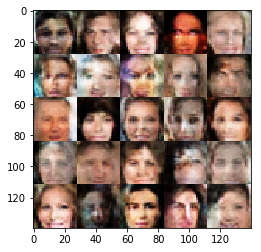

Epoch 1/2... Batch 5610... Discriminator Loss: 0.3612... Generator Loss: 4.4017
Epoch 1/2... Batch 5620... Discriminator Loss: 0.8550... Generator Loss: 1.2780
Epoch 1/2... Batch 5630... Discriminator Loss: 1.0476... Generator Loss: 0.8820
Epoch 1/2... Batch 5640... Discriminator Loss: 0.3525... Generator Loss: 4.3439
Epoch 1/2... Batch 5650... Discriminator Loss: 0.4673... Generator Loss: 4.2852
Epoch 1/2... Batch 5660... Discriminator Loss: 0.3951... Generator Loss: 3.1622
Epoch 1/2... Batch 5670... Discriminator Loss: 0.8361... Generator Loss: 6.0522
Epoch 1/2... Batch 5680... Discriminator Loss: 1.7484... Generator Loss: 0.3542
Epoch 1/2... Batch 5690... Discriminator Loss: 0.3554... Generator Loss: 4.8752
Epoch 1/2... Batch 5700... Discriminator Loss: 0.3734... Generator Loss: 4.0998


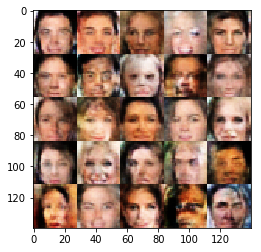

Epoch 1/2... Batch 5710... Discriminator Loss: 0.8489... Generator Loss: 1.0618
Epoch 1/2... Batch 5720... Discriminator Loss: 0.4771... Generator Loss: 2.2867
Epoch 1/2... Batch 5730... Discriminator Loss: 0.3989... Generator Loss: 3.9242
Epoch 1/2... Batch 5740... Discriminator Loss: 1.5562... Generator Loss: 0.4403
Epoch 1/2... Batch 5750... Discriminator Loss: 0.3861... Generator Loss: 3.2223
Epoch 1/2... Batch 5760... Discriminator Loss: 0.3756... Generator Loss: 3.5736
Epoch 1/2... Batch 5770... Discriminator Loss: 0.4287... Generator Loss: 5.5268
Epoch 1/2... Batch 5780... Discriminator Loss: 1.9979... Generator Loss: 3.6232
Epoch 1/2... Batch 5790... Discriminator Loss: 0.3490... Generator Loss: 4.4192
Epoch 1/2... Batch 5800... Discriminator Loss: 0.6285... Generator Loss: 4.2865


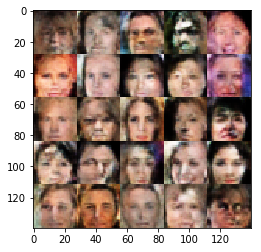

Epoch 1/2... Batch 5810... Discriminator Loss: 0.3802... Generator Loss: 4.9611
Epoch 1/2... Batch 5820... Discriminator Loss: 0.4265... Generator Loss: 2.7702
Epoch 1/2... Batch 5830... Discriminator Loss: 0.3463... Generator Loss: 4.8521
Epoch 1/2... Batch 5840... Discriminator Loss: 0.5453... Generator Loss: 5.4903
Epoch 1/2... Batch 5850... Discriminator Loss: 0.3742... Generator Loss: 3.7811
Epoch 1/2... Batch 5860... Discriminator Loss: 0.3905... Generator Loss: 3.4116
Epoch 1/2... Batch 5870... Discriminator Loss: 0.5469... Generator Loss: 1.9415
Epoch 1/2... Batch 5880... Discriminator Loss: 0.4737... Generator Loss: 2.2938
Epoch 1/2... Batch 5890... Discriminator Loss: 0.3558... Generator Loss: 4.5062
Epoch 1/2... Batch 5900... Discriminator Loss: 0.3417... Generator Loss: 5.5364


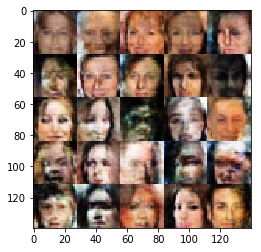

Epoch 1/2... Batch 5910... Discriminator Loss: 0.4520... Generator Loss: 2.6448
Epoch 1/2... Batch 5920... Discriminator Loss: 0.3824... Generator Loss: 6.0692
Epoch 1/2... Batch 5930... Discriminator Loss: 1.1558... Generator Loss: 0.7620
Epoch 1/2... Batch 5940... Discriminator Loss: 0.5240... Generator Loss: 2.0103
Epoch 1/2... Batch 5950... Discriminator Loss: 0.3574... Generator Loss: 4.3299
Epoch 1/2... Batch 5960... Discriminator Loss: 0.4429... Generator Loss: 3.0077
Epoch 1/2... Batch 5970... Discriminator Loss: 1.3686... Generator Loss: 3.6914
Epoch 1/2... Batch 5980... Discriminator Loss: 0.4679... Generator Loss: 2.8105
Epoch 1/2... Batch 5990... Discriminator Loss: 0.3534... Generator Loss: 4.5667
Epoch 1/2... Batch 6000... Discriminator Loss: 0.3756... Generator Loss: 4.5471


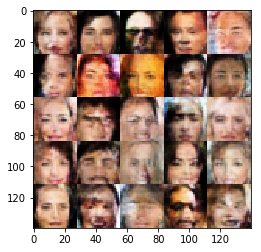

Epoch 1/2... Batch 6010... Discriminator Loss: 0.4612... Generator Loss: 2.7323
Epoch 1/2... Batch 6020... Discriminator Loss: 0.3676... Generator Loss: 4.3818
Epoch 1/2... Batch 6030... Discriminator Loss: 2.7631... Generator Loss: 0.1489
Epoch 1/2... Batch 6040... Discriminator Loss: 0.6248... Generator Loss: 1.5196
Epoch 1/2... Batch 6050... Discriminator Loss: 1.3667... Generator Loss: 0.5309
Epoch 1/2... Batch 6060... Discriminator Loss: 0.5511... Generator Loss: 2.7159
Epoch 1/2... Batch 6070... Discriminator Loss: 0.3588... Generator Loss: 4.1588
Epoch 1/2... Batch 6080... Discriminator Loss: 0.3604... Generator Loss: 4.1099
Epoch 1/2... Batch 6090... Discriminator Loss: 0.3698... Generator Loss: 3.9159
Epoch 1/2... Batch 6100... Discriminator Loss: 0.3590... Generator Loss: 3.8844


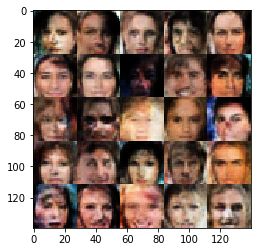

Epoch 1/2... Batch 6110... Discriminator Loss: 0.6085... Generator Loss: 2.1818
Epoch 1/2... Batch 6120... Discriminator Loss: 0.4002... Generator Loss: 5.2418
Epoch 1/2... Batch 6130... Discriminator Loss: 0.4273... Generator Loss: 4.2904
Epoch 1/2... Batch 6140... Discriminator Loss: 0.4063... Generator Loss: 3.9259
Epoch 1/2... Batch 6150... Discriminator Loss: 0.4772... Generator Loss: 5.5384
Epoch 1/2... Batch 6160... Discriminator Loss: 0.3748... Generator Loss: 4.7239
Epoch 1/2... Batch 6170... Discriminator Loss: 0.8226... Generator Loss: 1.0769
Epoch 1/2... Batch 6180... Discriminator Loss: 0.3716... Generator Loss: 3.9669
Epoch 1/2... Batch 6190... Discriminator Loss: 0.4032... Generator Loss: 3.0843
Epoch 1/2... Batch 6200... Discriminator Loss: 0.4017... Generator Loss: 4.7528


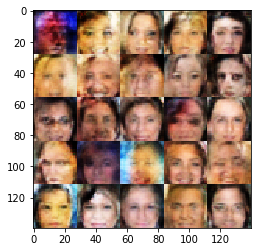

Epoch 1/2... Batch 6210... Discriminator Loss: 0.4463... Generator Loss: 2.7901
Epoch 1/2... Batch 6220... Discriminator Loss: 0.3592... Generator Loss: 4.1927
Epoch 1/2... Batch 6230... Discriminator Loss: 1.8282... Generator Loss: 0.3590
Epoch 1/2... Batch 6240... Discriminator Loss: 0.4387... Generator Loss: 2.7331
Epoch 1/2... Batch 6250... Discriminator Loss: 0.5799... Generator Loss: 4.4617
Epoch 1/2... Batch 6260... Discriminator Loss: 0.3487... Generator Loss: 4.7066
Epoch 1/2... Batch 6270... Discriminator Loss: 0.4714... Generator Loss: 2.3005
Epoch 1/2... Batch 6280... Discriminator Loss: 0.6399... Generator Loss: 1.5252
Epoch 1/2... Batch 6290... Discriminator Loss: 0.3692... Generator Loss: 3.7073
Epoch 1/2... Batch 6300... Discriminator Loss: 0.5802... Generator Loss: 1.9200


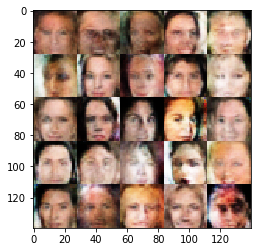

Epoch 1/2... Batch 6310... Discriminator Loss: 0.3613... Generator Loss: 4.6980
Epoch 1/2... Batch 6320... Discriminator Loss: 0.3587... Generator Loss: 3.8556
Epoch 1/2... Batch 6330... Discriminator Loss: 0.3559... Generator Loss: 4.2853
Epoch 2/2... Batch 10... Discriminator Loss: 0.4058... Generator Loss: 3.9062
Epoch 2/2... Batch 20... Discriminator Loss: 0.4131... Generator Loss: 2.9367
Epoch 2/2... Batch 30... Discriminator Loss: 0.3719... Generator Loss: 3.4532
Epoch 2/2... Batch 40... Discriminator Loss: 0.4851... Generator Loss: 4.2118
Epoch 2/2... Batch 50... Discriminator Loss: 1.5173... Generator Loss: 0.6005
Epoch 2/2... Batch 60... Discriminator Loss: 0.8364... Generator Loss: 1.1758
Epoch 2/2... Batch 70... Discriminator Loss: 0.8516... Generator Loss: 5.1661
Epoch 2/2... Batch 80... Discriminator Loss: 0.9995... Generator Loss: 3.3966
Epoch 2/2... Batch 90... Discriminator Loss: 0.3882... Generator Loss: 3.2604
Epoch 2/2... Batch 100... Discriminator Loss: 0.3476... Ge

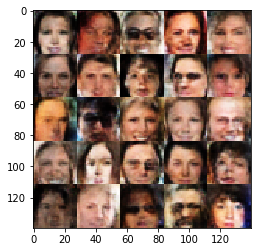

Epoch 2/2... Batch 110... Discriminator Loss: 0.5392... Generator Loss: 4.2073
Epoch 2/2... Batch 120... Discriminator Loss: 0.3972... Generator Loss: 4.9713
Epoch 2/2... Batch 130... Discriminator Loss: 0.3573... Generator Loss: 4.1171
Epoch 2/2... Batch 140... Discriminator Loss: 0.5880... Generator Loss: 5.2402
Epoch 2/2... Batch 150... Discriminator Loss: 0.3614... Generator Loss: 4.0768
Epoch 2/2... Batch 160... Discriminator Loss: 0.3518... Generator Loss: 6.0407
Epoch 2/2... Batch 170... Discriminator Loss: 0.3886... Generator Loss: 4.6986
Epoch 2/2... Batch 180... Discriminator Loss: 0.5809... Generator Loss: 4.4426
Epoch 2/2... Batch 190... Discriminator Loss: 1.7341... Generator Loss: 0.4342
Epoch 2/2... Batch 200... Discriminator Loss: 0.5353... Generator Loss: 5.3599


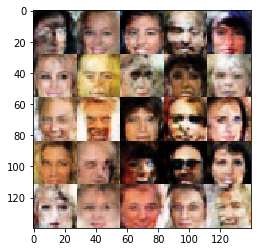

Epoch 2/2... Batch 210... Discriminator Loss: 0.9354... Generator Loss: 2.8241
Epoch 2/2... Batch 220... Discriminator Loss: 0.3805... Generator Loss: 4.3670
Epoch 2/2... Batch 230... Discriminator Loss: 1.9230... Generator Loss: 3.0226
Epoch 2/2... Batch 240... Discriminator Loss: 0.4857... Generator Loss: 5.2195
Epoch 2/2... Batch 250... Discriminator Loss: 0.3825... Generator Loss: 3.9123
Epoch 2/2... Batch 260... Discriminator Loss: 0.3986... Generator Loss: 3.6860
Epoch 2/2... Batch 270... Discriminator Loss: 0.3584... Generator Loss: 4.1826
Epoch 2/2... Batch 280... Discriminator Loss: 0.4093... Generator Loss: 5.1509
Epoch 2/2... Batch 290... Discriminator Loss: 0.5034... Generator Loss: 2.6805
Epoch 2/2... Batch 300... Discriminator Loss: 0.8340... Generator Loss: 1.2859


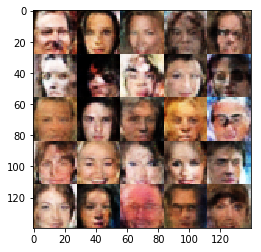

Epoch 2/2... Batch 310... Discriminator Loss: 0.3555... Generator Loss: 4.0738
Epoch 2/2... Batch 320... Discriminator Loss: 0.7261... Generator Loss: 4.5992
Epoch 2/2... Batch 330... Discriminator Loss: 0.6277... Generator Loss: 4.0240
Epoch 2/2... Batch 340... Discriminator Loss: 0.4067... Generator Loss: 5.4808
Epoch 2/2... Batch 350... Discriminator Loss: 0.3460... Generator Loss: 5.0032
Epoch 2/2... Batch 360... Discriminator Loss: 0.3599... Generator Loss: 4.5623
Epoch 2/2... Batch 370... Discriminator Loss: 0.3435... Generator Loss: 4.8602
Epoch 2/2... Batch 380... Discriminator Loss: 0.4469... Generator Loss: 3.0387
Epoch 2/2... Batch 390... Discriminator Loss: 0.3462... Generator Loss: 5.0941
Epoch 2/2... Batch 400... Discriminator Loss: 0.4438... Generator Loss: 3.3612


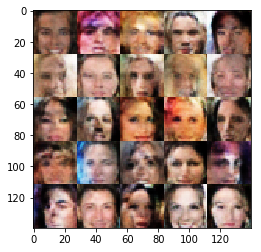

Epoch 2/2... Batch 410... Discriminator Loss: 0.5962... Generator Loss: 5.5821
Epoch 2/2... Batch 420... Discriminator Loss: 0.3557... Generator Loss: 4.5858
Epoch 2/2... Batch 430... Discriminator Loss: 0.3453... Generator Loss: 4.5392
Epoch 2/2... Batch 440... Discriminator Loss: 0.3866... Generator Loss: 4.5026
Epoch 2/2... Batch 450... Discriminator Loss: 0.4052... Generator Loss: 5.0872
Epoch 2/2... Batch 460... Discriminator Loss: 0.3668... Generator Loss: 3.6515
Epoch 2/2... Batch 470... Discriminator Loss: 0.4561... Generator Loss: 2.4228
Epoch 2/2... Batch 480... Discriminator Loss: 1.2766... Generator Loss: 0.6000
Epoch 2/2... Batch 490... Discriminator Loss: 0.5219... Generator Loss: 2.3223
Epoch 2/2... Batch 500... Discriminator Loss: 0.3641... Generator Loss: 4.3086


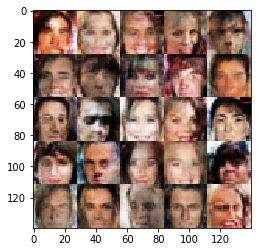

Epoch 2/2... Batch 510... Discriminator Loss: 0.3571... Generator Loss: 4.5944
Epoch 2/2... Batch 520... Discriminator Loss: 0.3802... Generator Loss: 3.4180
Epoch 2/2... Batch 530... Discriminator Loss: 0.3688... Generator Loss: 3.9835
Epoch 2/2... Batch 540... Discriminator Loss: 0.3770... Generator Loss: 3.8120
Epoch 2/2... Batch 550... Discriminator Loss: 0.3587... Generator Loss: 4.3861
Epoch 2/2... Batch 560... Discriminator Loss: 0.3522... Generator Loss: 5.2252
Epoch 2/2... Batch 570... Discriminator Loss: 0.3583... Generator Loss: 4.4623
Epoch 2/2... Batch 580... Discriminator Loss: 0.3445... Generator Loss: 5.5675
Epoch 2/2... Batch 590... Discriminator Loss: 0.3516... Generator Loss: 4.3314
Epoch 2/2... Batch 600... Discriminator Loss: 0.4699... Generator Loss: 2.2900


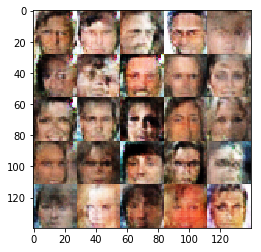

Epoch 2/2... Batch 610... Discriminator Loss: 0.5260... Generator Loss: 1.9554
Epoch 2/2... Batch 620... Discriminator Loss: 0.3916... Generator Loss: 3.2668
Epoch 2/2... Batch 630... Discriminator Loss: 0.5393... Generator Loss: 1.9588
Epoch 2/2... Batch 640... Discriminator Loss: 0.3591... Generator Loss: 6.0150
Epoch 2/2... Batch 650... Discriminator Loss: 0.3650... Generator Loss: 4.0182
Epoch 2/2... Batch 660... Discriminator Loss: 1.0112... Generator Loss: 7.4603
Epoch 2/2... Batch 670... Discriminator Loss: 0.5489... Generator Loss: 2.6139
Epoch 2/2... Batch 680... Discriminator Loss: 0.3569... Generator Loss: 5.1055
Epoch 2/2... Batch 690... Discriminator Loss: 0.3387... Generator Loss: 5.4094
Epoch 2/2... Batch 700... Discriminator Loss: 0.3556... Generator Loss: 4.9201


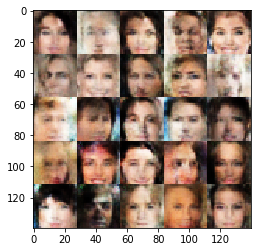

Epoch 2/2... Batch 710... Discriminator Loss: 0.3431... Generator Loss: 6.4092
Epoch 2/2... Batch 720... Discriminator Loss: 0.9186... Generator Loss: 4.5633
Epoch 2/2... Batch 730... Discriminator Loss: 0.3808... Generator Loss: 4.2145
Epoch 2/2... Batch 740... Discriminator Loss: 0.3884... Generator Loss: 4.7926
Epoch 2/2... Batch 750... Discriminator Loss: 0.5259... Generator Loss: 2.5614
Epoch 2/2... Batch 760... Discriminator Loss: 0.3846... Generator Loss: 3.9703
Epoch 2/2... Batch 770... Discriminator Loss: 0.4699... Generator Loss: 2.6333
Epoch 2/2... Batch 780... Discriminator Loss: 0.6450... Generator Loss: 2.2654
Epoch 2/2... Batch 790... Discriminator Loss: 0.3595... Generator Loss: 4.4888
Epoch 2/2... Batch 800... Discriminator Loss: 0.4220... Generator Loss: 5.1194


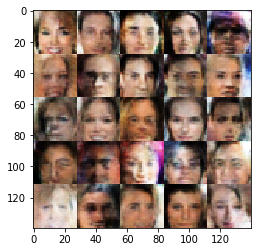

Epoch 2/2... Batch 810... Discriminator Loss: 1.9520... Generator Loss: 5.2150
Epoch 2/2... Batch 820... Discriminator Loss: 0.7025... Generator Loss: 3.3093
Epoch 2/2... Batch 830... Discriminator Loss: 0.4188... Generator Loss: 2.9929
Epoch 2/2... Batch 840... Discriminator Loss: 0.4403... Generator Loss: 3.2649
Epoch 2/2... Batch 850... Discriminator Loss: 0.4624... Generator Loss: 4.3298
Epoch 2/2... Batch 860... Discriminator Loss: 0.3472... Generator Loss: 5.0290
Epoch 2/2... Batch 870... Discriminator Loss: 0.3786... Generator Loss: 4.6446
Epoch 2/2... Batch 880... Discriminator Loss: 1.8736... Generator Loss: 4.4033
Epoch 2/2... Batch 890... Discriminator Loss: 0.4568... Generator Loss: 2.5274
Epoch 2/2... Batch 900... Discriminator Loss: 0.7633... Generator Loss: 1.3988


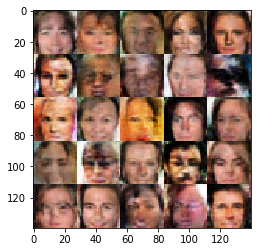

Epoch 2/2... Batch 910... Discriminator Loss: 0.8236... Generator Loss: 1.2180
Epoch 2/2... Batch 920... Discriminator Loss: 0.3838... Generator Loss: 4.9447
Epoch 2/2... Batch 930... Discriminator Loss: 0.3531... Generator Loss: 4.9704
Epoch 2/2... Batch 940... Discriminator Loss: 0.3395... Generator Loss: 5.5340
Epoch 2/2... Batch 950... Discriminator Loss: 0.3804... Generator Loss: 6.0095
Epoch 2/2... Batch 960... Discriminator Loss: 0.5650... Generator Loss: 2.0607
Epoch 2/2... Batch 970... Discriminator Loss: 0.3697... Generator Loss: 3.6844
Epoch 2/2... Batch 980... Discriminator Loss: 2.2808... Generator Loss: 0.2304
Epoch 2/2... Batch 990... Discriminator Loss: 0.5832... Generator Loss: 3.7511
Epoch 2/2... Batch 1000... Discriminator Loss: 0.6162... Generator Loss: 2.2341


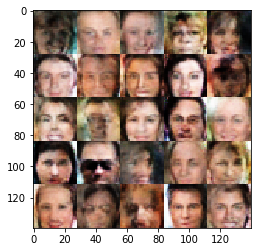

Epoch 2/2... Batch 1010... Discriminator Loss: 0.5644... Generator Loss: 2.3610
Epoch 2/2... Batch 1020... Discriminator Loss: 0.3794... Generator Loss: 4.6388
Epoch 2/2... Batch 1030... Discriminator Loss: 1.3318... Generator Loss: 5.1074
Epoch 2/2... Batch 1040... Discriminator Loss: 0.3630... Generator Loss: 4.1768
Epoch 2/2... Batch 1050... Discriminator Loss: 0.3883... Generator Loss: 4.8795
Epoch 2/2... Batch 1060... Discriminator Loss: 0.5032... Generator Loss: 3.1130
Epoch 2/2... Batch 1070... Discriminator Loss: 0.5250... Generator Loss: 3.4016
Epoch 2/2... Batch 1080... Discriminator Loss: 0.3521... Generator Loss: 4.7059
Epoch 2/2... Batch 1090... Discriminator Loss: 0.5258... Generator Loss: 2.1442
Epoch 2/2... Batch 1100... Discriminator Loss: 0.4285... Generator Loss: 2.6478


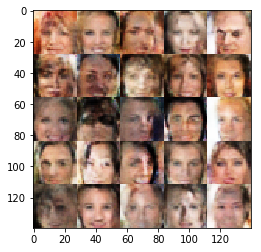

Epoch 2/2... Batch 1110... Discriminator Loss: 0.3496... Generator Loss: 4.5429
Epoch 2/2... Batch 1120... Discriminator Loss: 0.3539... Generator Loss: 4.6628
Epoch 2/2... Batch 1130... Discriminator Loss: 0.3941... Generator Loss: 4.5096
Epoch 2/2... Batch 1140... Discriminator Loss: 0.6409... Generator Loss: 1.8376
Epoch 2/2... Batch 1150... Discriminator Loss: 0.4086... Generator Loss: 2.8673
Epoch 2/2... Batch 1160... Discriminator Loss: 0.3977... Generator Loss: 3.1932
Epoch 2/2... Batch 1170... Discriminator Loss: 0.4145... Generator Loss: 4.5062
Epoch 2/2... Batch 1180... Discriminator Loss: 0.3716... Generator Loss: 4.0269
Epoch 2/2... Batch 1190... Discriminator Loss: 0.3581... Generator Loss: 4.2754
Epoch 2/2... Batch 1200... Discriminator Loss: 0.3435... Generator Loss: 5.3725


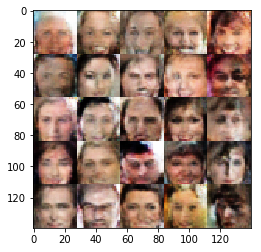

Epoch 2/2... Batch 1210... Discriminator Loss: 0.3725... Generator Loss: 4.1126
Epoch 2/2... Batch 1220... Discriminator Loss: 0.3485... Generator Loss: 4.6949
Epoch 2/2... Batch 1230... Discriminator Loss: 0.3741... Generator Loss: 4.4365
Epoch 2/2... Batch 1240... Discriminator Loss: 0.3497... Generator Loss: 4.4471
Epoch 2/2... Batch 1250... Discriminator Loss: 2.4463... Generator Loss: 4.5946
Epoch 2/2... Batch 1260... Discriminator Loss: 0.4827... Generator Loss: 2.4597
Epoch 2/2... Batch 1270... Discriminator Loss: 0.3818... Generator Loss: 4.6421
Epoch 2/2... Batch 1280... Discriminator Loss: 0.5049... Generator Loss: 2.9738
Epoch 2/2... Batch 1290... Discriminator Loss: 0.4935... Generator Loss: 3.0408
Epoch 2/2... Batch 1300... Discriminator Loss: 0.3554... Generator Loss: 5.2535


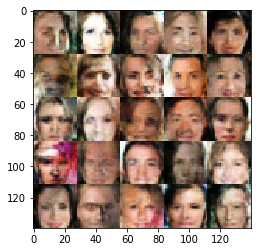

Epoch 2/2... Batch 1310... Discriminator Loss: 0.5185... Generator Loss: 2.1419
Epoch 2/2... Batch 1320... Discriminator Loss: 0.3666... Generator Loss: 4.2663
Epoch 2/2... Batch 1330... Discriminator Loss: 0.4377... Generator Loss: 5.4161
Epoch 2/2... Batch 1340... Discriminator Loss: 0.3634... Generator Loss: 4.6066
Epoch 2/2... Batch 1350... Discriminator Loss: 0.3578... Generator Loss: 4.0413
Epoch 2/2... Batch 1360... Discriminator Loss: 0.3612... Generator Loss: 4.9884
Epoch 2/2... Batch 1370... Discriminator Loss: 1.2880... Generator Loss: 0.7607
Epoch 2/2... Batch 1380... Discriminator Loss: 0.7496... Generator Loss: 5.1139
Epoch 2/2... Batch 1390... Discriminator Loss: 0.3646... Generator Loss: 3.7363
Epoch 2/2... Batch 1400... Discriminator Loss: 0.4156... Generator Loss: 4.0059


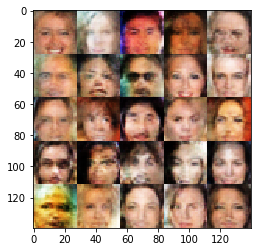

Epoch 2/2... Batch 1410... Discriminator Loss: 0.3987... Generator Loss: 5.8353
Epoch 2/2... Batch 1420... Discriminator Loss: 0.3774... Generator Loss: 3.6097
Epoch 2/2... Batch 1430... Discriminator Loss: 2.0024... Generator Loss: 0.2718
Epoch 2/2... Batch 1440... Discriminator Loss: 0.3630... Generator Loss: 4.8009
Epoch 2/2... Batch 1450... Discriminator Loss: 0.3907... Generator Loss: 3.9837
Epoch 2/2... Batch 1460... Discriminator Loss: 0.5626... Generator Loss: 6.0901
Epoch 2/2... Batch 1470... Discriminator Loss: 0.5335... Generator Loss: 2.5381
Epoch 2/2... Batch 1480... Discriminator Loss: 0.3761... Generator Loss: 3.6762
Epoch 2/2... Batch 1490... Discriminator Loss: 0.3429... Generator Loss: 4.9686
Epoch 2/2... Batch 1500... Discriminator Loss: 0.3770... Generator Loss: 4.3825


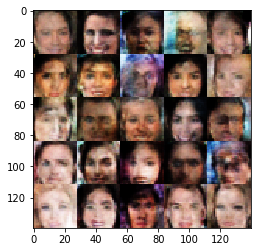

Epoch 2/2... Batch 1510... Discriminator Loss: 0.4196... Generator Loss: 4.2486
Epoch 2/2... Batch 1520... Discriminator Loss: 1.2329... Generator Loss: 3.5613
Epoch 2/2... Batch 1530... Discriminator Loss: 0.4608... Generator Loss: 2.7881
Epoch 2/2... Batch 1540... Discriminator Loss: 0.4677... Generator Loss: 5.7278
Epoch 2/2... Batch 1550... Discriminator Loss: 0.3831... Generator Loss: 4.1460
Epoch 2/2... Batch 1560... Discriminator Loss: 1.5094... Generator Loss: 0.5175
Epoch 2/2... Batch 1570... Discriminator Loss: 0.5342... Generator Loss: 1.9833
Epoch 2/2... Batch 1580... Discriminator Loss: 0.3531... Generator Loss: 5.7713
Epoch 2/2... Batch 1590... Discriminator Loss: 1.3810... Generator Loss: 0.6313
Epoch 2/2... Batch 1600... Discriminator Loss: 0.5045... Generator Loss: 2.0332


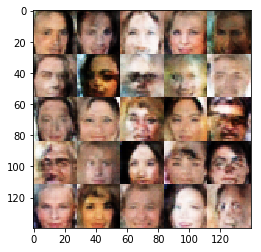

Epoch 2/2... Batch 1610... Discriminator Loss: 0.4135... Generator Loss: 3.3221
Epoch 2/2... Batch 1620... Discriminator Loss: 0.3471... Generator Loss: 4.7619
Epoch 2/2... Batch 1630... Discriminator Loss: 0.4161... Generator Loss: 3.7910
Epoch 2/2... Batch 1640... Discriminator Loss: 0.3433... Generator Loss: 5.5963
Epoch 2/2... Batch 1650... Discriminator Loss: 0.3470... Generator Loss: 5.4045
Epoch 2/2... Batch 1660... Discriminator Loss: 0.3578... Generator Loss: 3.7990
Epoch 2/2... Batch 1670... Discriminator Loss: 0.3462... Generator Loss: 5.3489
Epoch 2/2... Batch 1680... Discriminator Loss: 2.0467... Generator Loss: 0.3130
Epoch 2/2... Batch 1690... Discriminator Loss: 0.4584... Generator Loss: 2.4826
Epoch 2/2... Batch 1700... Discriminator Loss: 0.3826... Generator Loss: 4.3753


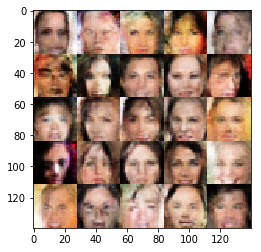

Epoch 2/2... Batch 1710... Discriminator Loss: 0.3950... Generator Loss: 5.1967
Epoch 2/2... Batch 1720... Discriminator Loss: 0.3898... Generator Loss: 3.6536
Epoch 2/2... Batch 1730... Discriminator Loss: 0.3609... Generator Loss: 5.3586
Epoch 2/2... Batch 1740... Discriminator Loss: 1.2333... Generator Loss: 2.2611
Epoch 2/2... Batch 1750... Discriminator Loss: 0.5185... Generator Loss: 3.0400
Epoch 2/2... Batch 1760... Discriminator Loss: 0.6737... Generator Loss: 5.0337
Epoch 2/2... Batch 1770... Discriminator Loss: 0.4775... Generator Loss: 2.9835
Epoch 2/2... Batch 1780... Discriminator Loss: 0.4028... Generator Loss: 3.1061
Epoch 2/2... Batch 1790... Discriminator Loss: 0.3807... Generator Loss: 3.5227
Epoch 2/2... Batch 1800... Discriminator Loss: 0.4124... Generator Loss: 3.2104


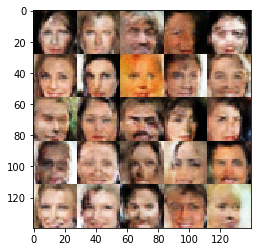

Epoch 2/2... Batch 1810... Discriminator Loss: 0.3459... Generator Loss: 4.7353
Epoch 2/2... Batch 1820... Discriminator Loss: 0.8420... Generator Loss: 2.0442
Epoch 2/2... Batch 1830... Discriminator Loss: 0.4110... Generator Loss: 2.9595
Epoch 2/2... Batch 1840... Discriminator Loss: 0.4491... Generator Loss: 5.0718
Epoch 2/2... Batch 1850... Discriminator Loss: 0.3471... Generator Loss: 4.6684
Epoch 2/2... Batch 1860... Discriminator Loss: 0.3480... Generator Loss: 5.3803
Epoch 2/2... Batch 1870... Discriminator Loss: 0.4341... Generator Loss: 3.0921
Epoch 2/2... Batch 1880... Discriminator Loss: 0.3759... Generator Loss: 5.9961
Epoch 2/2... Batch 1890... Discriminator Loss: 0.3737... Generator Loss: 5.4706
Epoch 2/2... Batch 1900... Discriminator Loss: 0.3775... Generator Loss: 3.5453


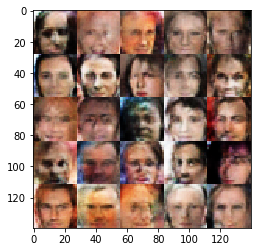

Epoch 2/2... Batch 1910... Discriminator Loss: 0.3764... Generator Loss: 3.4785
Epoch 2/2... Batch 1920... Discriminator Loss: 0.3797... Generator Loss: 3.4666
Epoch 2/2... Batch 1930... Discriminator Loss: 0.3389... Generator Loss: 5.6344
Epoch 2/2... Batch 1940... Discriminator Loss: 0.3451... Generator Loss: 5.7719
Epoch 2/2... Batch 1950... Discriminator Loss: 0.3555... Generator Loss: 4.3085
Epoch 2/2... Batch 1960... Discriminator Loss: 0.4644... Generator Loss: 5.3391
Epoch 2/2... Batch 1970... Discriminator Loss: 0.3835... Generator Loss: 4.9053
Epoch 2/2... Batch 1980... Discriminator Loss: 0.5665... Generator Loss: 1.7813
Epoch 2/2... Batch 1990... Discriminator Loss: 0.4084... Generator Loss: 4.8823
Epoch 2/2... Batch 2000... Discriminator Loss: 0.3497... Generator Loss: 4.7534


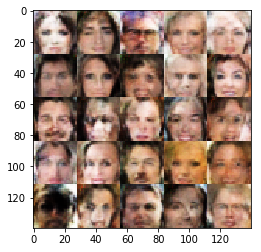

Epoch 2/2... Batch 2010... Discriminator Loss: 0.3518... Generator Loss: 4.8932
Epoch 2/2... Batch 2020... Discriminator Loss: 0.4152... Generator Loss: 4.2494
Epoch 2/2... Batch 2030... Discriminator Loss: 0.7814... Generator Loss: 2.8737
Epoch 2/2... Batch 2040... Discriminator Loss: 0.3647... Generator Loss: 4.5134
Epoch 2/2... Batch 2050... Discriminator Loss: 3.7518... Generator Loss: 0.0924
Epoch 2/2... Batch 2060... Discriminator Loss: 0.7023... Generator Loss: 1.3519
Epoch 2/2... Batch 2070... Discriminator Loss: 0.3678... Generator Loss: 4.3920
Epoch 2/2... Batch 2080... Discriminator Loss: 0.7514... Generator Loss: 1.9214
Epoch 2/2... Batch 2090... Discriminator Loss: 0.4023... Generator Loss: 4.2124
Epoch 2/2... Batch 2100... Discriminator Loss: 0.3593... Generator Loss: 5.2173


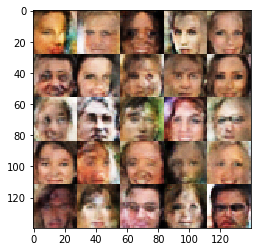

Epoch 2/2... Batch 2110... Discriminator Loss: 0.6702... Generator Loss: 2.5478
Epoch 2/2... Batch 2120... Discriminator Loss: 0.4020... Generator Loss: 2.9095
Epoch 2/2... Batch 2130... Discriminator Loss: 0.9341... Generator Loss: 3.8506
Epoch 2/2... Batch 2140... Discriminator Loss: 0.3720... Generator Loss: 4.7350
Epoch 2/2... Batch 2150... Discriminator Loss: 0.5155... Generator Loss: 5.5813
Epoch 2/2... Batch 2160... Discriminator Loss: 0.4653... Generator Loss: 4.5092
Epoch 2/2... Batch 2170... Discriminator Loss: 0.3627... Generator Loss: 3.8002
Epoch 2/2... Batch 2180... Discriminator Loss: 0.5579... Generator Loss: 4.7701
Epoch 2/2... Batch 2190... Discriminator Loss: 0.5151... Generator Loss: 2.2121
Epoch 2/2... Batch 2200... Discriminator Loss: 0.4534... Generator Loss: 3.3984


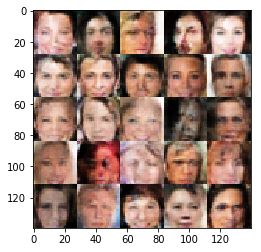

Epoch 2/2... Batch 2210... Discriminator Loss: 0.4062... Generator Loss: 3.4187
Epoch 2/2... Batch 2220... Discriminator Loss: 1.1904... Generator Loss: 4.4520
Epoch 2/2... Batch 2230... Discriminator Loss: 0.6742... Generator Loss: 1.7160
Epoch 2/2... Batch 2240... Discriminator Loss: 0.4839... Generator Loss: 4.5194
Epoch 2/2... Batch 2250... Discriminator Loss: 0.4075... Generator Loss: 3.1148
Epoch 2/2... Batch 2260... Discriminator Loss: 0.5009... Generator Loss: 2.4479
Epoch 2/2... Batch 2270... Discriminator Loss: 0.3736... Generator Loss: 5.1111
Epoch 2/2... Batch 2280... Discriminator Loss: 0.3961... Generator Loss: 3.5027
Epoch 2/2... Batch 2290... Discriminator Loss: 0.6214... Generator Loss: 4.3418
Epoch 2/2... Batch 2300... Discriminator Loss: 0.3656... Generator Loss: 4.7519


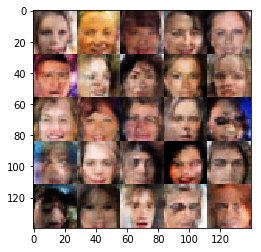

Epoch 2/2... Batch 2310... Discriminator Loss: 0.3925... Generator Loss: 4.7910
Epoch 2/2... Batch 2320... Discriminator Loss: 1.1928... Generator Loss: 0.7440
Epoch 2/2... Batch 2330... Discriminator Loss: 0.4117... Generator Loss: 3.5000
Epoch 2/2... Batch 2340... Discriminator Loss: 0.3878... Generator Loss: 3.3153
Epoch 2/2... Batch 2350... Discriminator Loss: 0.4072... Generator Loss: 3.0413
Epoch 2/2... Batch 2360... Discriminator Loss: 0.4004... Generator Loss: 5.7757
Epoch 2/2... Batch 2370... Discriminator Loss: 0.3400... Generator Loss: 5.2451
Epoch 2/2... Batch 2380... Discriminator Loss: 0.3453... Generator Loss: 5.6180
Epoch 2/2... Batch 2390... Discriminator Loss: 0.3459... Generator Loss: 4.8932
Epoch 2/2... Batch 2400... Discriminator Loss: 0.4324... Generator Loss: 4.0130


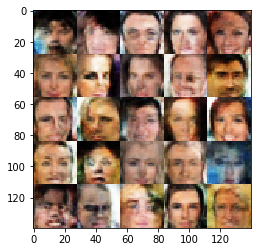

Epoch 2/2... Batch 2410... Discriminator Loss: 0.3392... Generator Loss: 6.1032
Epoch 2/2... Batch 2420... Discriminator Loss: 0.3763... Generator Loss: 6.0185
Epoch 2/2... Batch 2430... Discriminator Loss: 2.4253... Generator Loss: 4.9638
Epoch 2/2... Batch 2440... Discriminator Loss: 1.2549... Generator Loss: 0.6703
Epoch 2/2... Batch 2450... Discriminator Loss: 0.3866... Generator Loss: 3.7680
Epoch 2/2... Batch 2460... Discriminator Loss: 0.4468... Generator Loss: 4.6382
Epoch 2/2... Batch 2470... Discriminator Loss: 0.3859... Generator Loss: 3.8229
Epoch 2/2... Batch 2480... Discriminator Loss: 1.7871... Generator Loss: 4.2617
Epoch 2/2... Batch 2490... Discriminator Loss: 0.3862... Generator Loss: 3.1770
Epoch 2/2... Batch 2500... Discriminator Loss: 0.4920... Generator Loss: 4.9727


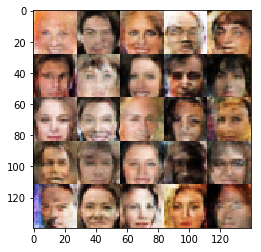

Epoch 2/2... Batch 2510... Discriminator Loss: 0.3451... Generator Loss: 6.3624
Epoch 2/2... Batch 2520... Discriminator Loss: 1.5282... Generator Loss: 3.1973
Epoch 2/2... Batch 2530... Discriminator Loss: 0.3756... Generator Loss: 3.7629
Epoch 2/2... Batch 2540... Discriminator Loss: 0.4131... Generator Loss: 3.0874
Epoch 2/2... Batch 2550... Discriminator Loss: 0.3583... Generator Loss: 4.9049
Epoch 2/2... Batch 2560... Discriminator Loss: 0.4099... Generator Loss: 3.3584
Epoch 2/2... Batch 2570... Discriminator Loss: 0.6358... Generator Loss: 1.8890
Epoch 2/2... Batch 2580... Discriminator Loss: 0.3979... Generator Loss: 4.4087
Epoch 2/2... Batch 2590... Discriminator Loss: 0.4290... Generator Loss: 2.7192
Epoch 2/2... Batch 2600... Discriminator Loss: 0.4002... Generator Loss: 3.5442


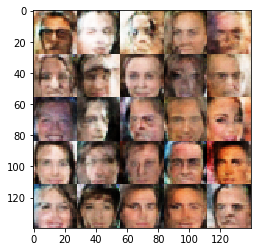

Epoch 2/2... Batch 2610... Discriminator Loss: 0.5171... Generator Loss: 4.9563
Epoch 2/2... Batch 2620... Discriminator Loss: 0.8817... Generator Loss: 0.9933
Epoch 2/2... Batch 2630... Discriminator Loss: 0.4023... Generator Loss: 3.0194
Epoch 2/2... Batch 2640... Discriminator Loss: 1.6529... Generator Loss: 6.1533
Epoch 2/2... Batch 2650... Discriminator Loss: 0.4233... Generator Loss: 2.7428
Epoch 2/2... Batch 2660... Discriminator Loss: 0.3675... Generator Loss: 3.8614
Epoch 2/2... Batch 2670... Discriminator Loss: 0.3534... Generator Loss: 4.6401
Epoch 2/2... Batch 2680... Discriminator Loss: 0.3647... Generator Loss: 4.4762
Epoch 2/2... Batch 2690... Discriminator Loss: 0.8844... Generator Loss: 1.4825
Epoch 2/2... Batch 2700... Discriminator Loss: 0.4080... Generator Loss: 5.5587


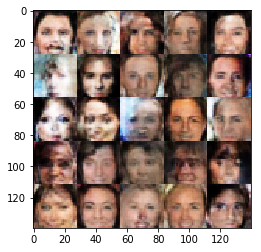

Epoch 2/2... Batch 2710... Discriminator Loss: 0.8185... Generator Loss: 5.0978
Epoch 2/2... Batch 2720... Discriminator Loss: 0.4627... Generator Loss: 3.0115
Epoch 2/2... Batch 2730... Discriminator Loss: 0.4535... Generator Loss: 4.1586
Epoch 2/2... Batch 2740... Discriminator Loss: 0.3694... Generator Loss: 5.0300
Epoch 2/2... Batch 2750... Discriminator Loss: 0.4131... Generator Loss: 2.9050
Epoch 2/2... Batch 2760... Discriminator Loss: 0.4296... Generator Loss: 4.4228
Epoch 2/2... Batch 2770... Discriminator Loss: 0.4043... Generator Loss: 5.1921
Epoch 2/2... Batch 2780... Discriminator Loss: 0.3385... Generator Loss: 5.6351
Epoch 2/2... Batch 2790... Discriminator Loss: 1.1397... Generator Loss: 0.9737
Epoch 2/2... Batch 2800... Discriminator Loss: 0.3662... Generator Loss: 5.2718


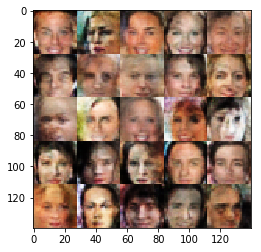

Epoch 2/2... Batch 2810... Discriminator Loss: 0.3466... Generator Loss: 4.9236
Epoch 2/2... Batch 2820... Discriminator Loss: 0.5982... Generator Loss: 6.0432
Epoch 2/2... Batch 2830... Discriminator Loss: 0.3460... Generator Loss: 4.5245
Epoch 2/2... Batch 2840... Discriminator Loss: 0.3922... Generator Loss: 3.2473
Epoch 2/2... Batch 2850... Discriminator Loss: 0.3368... Generator Loss: 6.5672
Epoch 2/2... Batch 2860... Discriminator Loss: 0.4501... Generator Loss: 2.4756
Epoch 2/2... Batch 2870... Discriminator Loss: 0.4336... Generator Loss: 4.3967
Epoch 2/2... Batch 2880... Discriminator Loss: 0.3802... Generator Loss: 3.6889
Epoch 2/2... Batch 2890... Discriminator Loss: 0.3575... Generator Loss: 5.3625
Epoch 2/2... Batch 2900... Discriminator Loss: 0.4098... Generator Loss: 2.9926


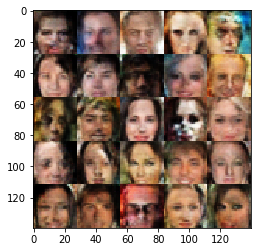

Epoch 2/2... Batch 2910... Discriminator Loss: 0.3473... Generator Loss: 5.1471
Epoch 2/2... Batch 2920... Discriminator Loss: 2.6749... Generator Loss: 0.1732
Epoch 2/2... Batch 2930... Discriminator Loss: 0.8151... Generator Loss: 1.0501
Epoch 2/2... Batch 2940... Discriminator Loss: 0.3664... Generator Loss: 3.9707
Epoch 2/2... Batch 2950... Discriminator Loss: 0.3855... Generator Loss: 3.7475
Epoch 2/2... Batch 2960... Discriminator Loss: 2.1700... Generator Loss: 0.2657
Epoch 2/2... Batch 2970... Discriminator Loss: 0.4657... Generator Loss: 2.7430
Epoch 2/2... Batch 2980... Discriminator Loss: 0.4112... Generator Loss: 5.4349
Epoch 2/2... Batch 2990... Discriminator Loss: 0.3846... Generator Loss: 6.1787
Epoch 2/2... Batch 3000... Discriminator Loss: 0.6261... Generator Loss: 1.6063


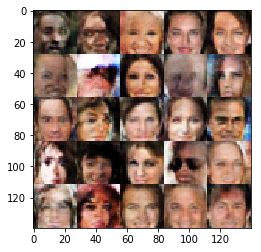

Epoch 2/2... Batch 3010... Discriminator Loss: 0.4277... Generator Loss: 2.6736
Epoch 2/2... Batch 3020... Discriminator Loss: 0.3741... Generator Loss: 4.6100
Epoch 2/2... Batch 3030... Discriminator Loss: 0.4053... Generator Loss: 4.9967
Epoch 2/2... Batch 3040... Discriminator Loss: 0.3855... Generator Loss: 4.3347
Epoch 2/2... Batch 3050... Discriminator Loss: 0.3523... Generator Loss: 6.1146
Epoch 2/2... Batch 3060... Discriminator Loss: 0.4159... Generator Loss: 5.2754
Epoch 2/2... Batch 3070... Discriminator Loss: 0.8568... Generator Loss: 3.0233
Epoch 2/2... Batch 3080... Discriminator Loss: 0.4230... Generator Loss: 3.3073
Epoch 2/2... Batch 3090... Discriminator Loss: 0.3562... Generator Loss: 4.6179
Epoch 2/2... Batch 3100... Discriminator Loss: 2.0057... Generator Loss: 0.2711


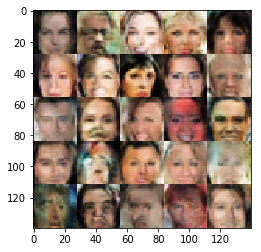

Epoch 2/2... Batch 3110... Discriminator Loss: 0.3798... Generator Loss: 3.7208
Epoch 2/2... Batch 3120... Discriminator Loss: 0.3617... Generator Loss: 4.7003
Epoch 2/2... Batch 3130... Discriminator Loss: 0.3748... Generator Loss: 3.3810
Epoch 2/2... Batch 3140... Discriminator Loss: 0.3673... Generator Loss: 4.2392
Epoch 2/2... Batch 3150... Discriminator Loss: 1.6116... Generator Loss: 3.8876
Epoch 2/2... Batch 3160... Discriminator Loss: 0.6270... Generator Loss: 1.6573
Epoch 2/2... Batch 3170... Discriminator Loss: 0.3597... Generator Loss: 5.6516
Epoch 2/2... Batch 3180... Discriminator Loss: 0.4548... Generator Loss: 2.5351
Epoch 2/2... Batch 3190... Discriminator Loss: 0.3858... Generator Loss: 3.1848
Epoch 2/2... Batch 3200... Discriminator Loss: 0.5007... Generator Loss: 2.0826


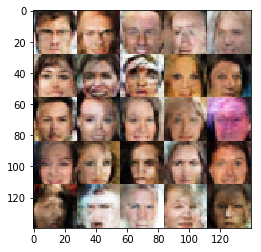

Epoch 2/2... Batch 3210... Discriminator Loss: 0.4328... Generator Loss: 6.1166
Epoch 2/2... Batch 3220... Discriminator Loss: 0.4099... Generator Loss: 3.8203
Epoch 2/2... Batch 3230... Discriminator Loss: 0.3563... Generator Loss: 6.0011
Epoch 2/2... Batch 3240... Discriminator Loss: 0.3637... Generator Loss: 3.9919
Epoch 2/2... Batch 3250... Discriminator Loss: 0.3458... Generator Loss: 4.8881
Epoch 2/2... Batch 3260... Discriminator Loss: 3.1920... Generator Loss: 3.7702
Epoch 2/2... Batch 3270... Discriminator Loss: 0.7663... Generator Loss: 2.4360
Epoch 2/2... Batch 3280... Discriminator Loss: 0.4290... Generator Loss: 3.0736
Epoch 2/2... Batch 3290... Discriminator Loss: 0.4430... Generator Loss: 3.4552
Epoch 2/2... Batch 3300... Discriminator Loss: 0.4613... Generator Loss: 3.1054


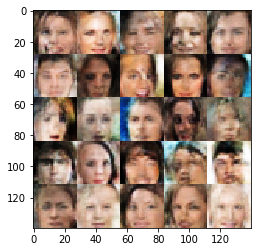

Epoch 2/2... Batch 3310... Discriminator Loss: 0.5936... Generator Loss: 1.7339
Epoch 2/2... Batch 3320... Discriminator Loss: 0.3620... Generator Loss: 4.7163
Epoch 2/2... Batch 3330... Discriminator Loss: 0.3572... Generator Loss: 4.8612
Epoch 2/2... Batch 3340... Discriminator Loss: 0.3753... Generator Loss: 4.1232
Epoch 2/2... Batch 3350... Discriminator Loss: 0.5129... Generator Loss: 3.7619
Epoch 2/2... Batch 3360... Discriminator Loss: 0.3608... Generator Loss: 4.1617
Epoch 2/2... Batch 3370... Discriminator Loss: 0.8902... Generator Loss: 1.0993
Epoch 2/2... Batch 3380... Discriminator Loss: 0.3607... Generator Loss: 4.0682
Epoch 2/2... Batch 3390... Discriminator Loss: 0.3615... Generator Loss: 4.6954
Epoch 2/2... Batch 3400... Discriminator Loss: 0.6428... Generator Loss: 6.4558


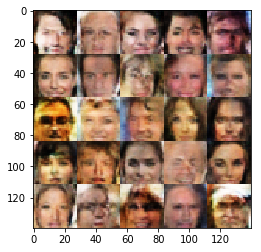

Epoch 2/2... Batch 3410... Discriminator Loss: 0.7817... Generator Loss: 2.7897
Epoch 2/2... Batch 3420... Discriminator Loss: 0.3606... Generator Loss: 4.3450
Epoch 2/2... Batch 3430... Discriminator Loss: 1.1817... Generator Loss: 0.7747
Epoch 2/2... Batch 3440... Discriminator Loss: 0.7086... Generator Loss: 4.0288
Epoch 2/2... Batch 3450... Discriminator Loss: 0.4123... Generator Loss: 4.2600
Epoch 2/2... Batch 3460... Discriminator Loss: 0.3875... Generator Loss: 4.0110
Epoch 2/2... Batch 3470... Discriminator Loss: 0.3626... Generator Loss: 4.9070
Epoch 2/2... Batch 3480... Discriminator Loss: 0.3988... Generator Loss: 2.9897
Epoch 2/2... Batch 3490... Discriminator Loss: 0.3504... Generator Loss: 5.4218
Epoch 2/2... Batch 3500... Discriminator Loss: 0.5850... Generator Loss: 5.2807


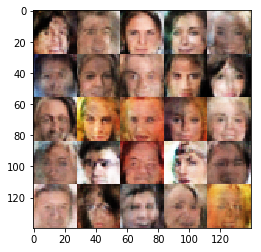

Epoch 2/2... Batch 3510... Discriminator Loss: 0.3698... Generator Loss: 3.8430
Epoch 2/2... Batch 3520... Discriminator Loss: 0.3483... Generator Loss: 4.3074
Epoch 2/2... Batch 3530... Discriminator Loss: 0.3447... Generator Loss: 5.5249
Epoch 2/2... Batch 3540... Discriminator Loss: 0.4241... Generator Loss: 4.1760
Epoch 2/2... Batch 3550... Discriminator Loss: 0.8460... Generator Loss: 2.3820
Epoch 2/2... Batch 3560... Discriminator Loss: 0.5285... Generator Loss: 2.2400
Epoch 2/2... Batch 3570... Discriminator Loss: 0.3549... Generator Loss: 5.4759
Epoch 2/2... Batch 3580... Discriminator Loss: 2.0046... Generator Loss: 3.4236
Epoch 2/2... Batch 3590... Discriminator Loss: 0.3462... Generator Loss: 4.8872
Epoch 2/2... Batch 3600... Discriminator Loss: 0.5508... Generator Loss: 4.5171


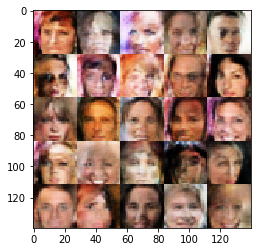

Epoch 2/2... Batch 3610... Discriminator Loss: 0.3714... Generator Loss: 3.5529
Epoch 2/2... Batch 3620... Discriminator Loss: 0.3555... Generator Loss: 5.3505
Epoch 2/2... Batch 3630... Discriminator Loss: 0.3495... Generator Loss: 4.7288
Epoch 2/2... Batch 3640... Discriminator Loss: 0.3979... Generator Loss: 3.0852
Epoch 2/2... Batch 3650... Discriminator Loss: 0.3566... Generator Loss: 4.3484
Epoch 2/2... Batch 3660... Discriminator Loss: 0.3651... Generator Loss: 3.5733
Epoch 2/2... Batch 3670... Discriminator Loss: 0.3369... Generator Loss: 5.9845
Epoch 2/2... Batch 3680... Discriminator Loss: 0.4122... Generator Loss: 4.5934
Epoch 2/2... Batch 3690... Discriminator Loss: 0.6458... Generator Loss: 1.9329
Epoch 2/2... Batch 3700... Discriminator Loss: 0.3610... Generator Loss: 4.0259


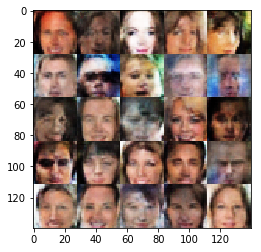

Epoch 2/2... Batch 3710... Discriminator Loss: 1.2288... Generator Loss: 0.6995
Epoch 2/2... Batch 3720... Discriminator Loss: 0.3610... Generator Loss: 4.5365
Epoch 2/2... Batch 3730... Discriminator Loss: 0.3803... Generator Loss: 3.3278
Epoch 2/2... Batch 3740... Discriminator Loss: 0.6866... Generator Loss: 1.5608
Epoch 2/2... Batch 3750... Discriminator Loss: 0.3835... Generator Loss: 4.9829
Epoch 2/2... Batch 3760... Discriminator Loss: 0.3502... Generator Loss: 5.1024
Epoch 2/2... Batch 3770... Discriminator Loss: 0.3483... Generator Loss: 4.6305
Epoch 2/2... Batch 3780... Discriminator Loss: 0.3598... Generator Loss: 4.1995
Epoch 2/2... Batch 3790... Discriminator Loss: 2.0987... Generator Loss: 0.2446
Epoch 2/2... Batch 3800... Discriminator Loss: 0.5225... Generator Loss: 3.1508


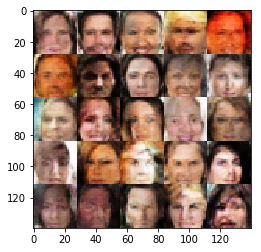

Epoch 2/2... Batch 3810... Discriminator Loss: 0.4031... Generator Loss: 5.2316
Epoch 2/2... Batch 3820... Discriminator Loss: 0.3530... Generator Loss: 4.9561
Epoch 2/2... Batch 3830... Discriminator Loss: 0.3510... Generator Loss: 4.3246
Epoch 2/2... Batch 3840... Discriminator Loss: 0.3933... Generator Loss: 4.5295
Epoch 2/2... Batch 3850... Discriminator Loss: 1.1022... Generator Loss: 3.9454
Epoch 2/2... Batch 3860... Discriminator Loss: 0.5703... Generator Loss: 1.9186
Epoch 2/2... Batch 3870... Discriminator Loss: 0.4249... Generator Loss: 2.6555
Epoch 2/2... Batch 3880... Discriminator Loss: 0.5598... Generator Loss: 1.9694
Epoch 2/2... Batch 3890... Discriminator Loss: 0.3753... Generator Loss: 3.5744
Epoch 2/2... Batch 3900... Discriminator Loss: 0.5314... Generator Loss: 5.1489


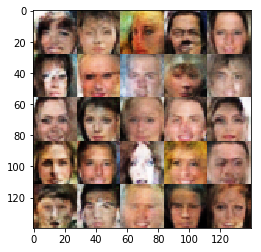

Epoch 2/2... Batch 3910... Discriminator Loss: 0.3544... Generator Loss: 4.1986
Epoch 2/2... Batch 3920... Discriminator Loss: 0.3525... Generator Loss: 5.4045
Epoch 2/2... Batch 3930... Discriminator Loss: 0.3549... Generator Loss: 4.6714
Epoch 2/2... Batch 3940... Discriminator Loss: 0.4126... Generator Loss: 3.0372
Epoch 2/2... Batch 3950... Discriminator Loss: 0.3869... Generator Loss: 3.2841
Epoch 2/2... Batch 3960... Discriminator Loss: 0.4060... Generator Loss: 5.3227
Epoch 2/2... Batch 3970... Discriminator Loss: 0.4184... Generator Loss: 3.0689
Epoch 2/2... Batch 3980... Discriminator Loss: 0.3699... Generator Loss: 5.5441
Epoch 2/2... Batch 3990... Discriminator Loss: 0.8465... Generator Loss: 6.1347
Epoch 2/2... Batch 4000... Discriminator Loss: 0.4710... Generator Loss: 6.4749


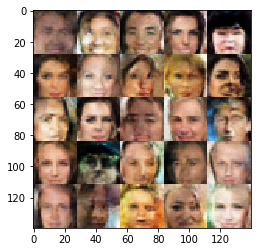

Epoch 2/2... Batch 4010... Discriminator Loss: 0.4595... Generator Loss: 6.0123
Epoch 2/2... Batch 4020... Discriminator Loss: 0.3446... Generator Loss: 4.8115
Epoch 2/2... Batch 4030... Discriminator Loss: 0.5437... Generator Loss: 1.8944
Epoch 2/2... Batch 4040... Discriminator Loss: 0.4081... Generator Loss: 2.8259
Epoch 2/2... Batch 4050... Discriminator Loss: 0.3392... Generator Loss: 5.3473
Epoch 2/2... Batch 4060... Discriminator Loss: 1.3476... Generator Loss: 0.6180
Epoch 2/2... Batch 4070... Discriminator Loss: 0.3576... Generator Loss: 4.5808
Epoch 2/2... Batch 4080... Discriminator Loss: 0.3683... Generator Loss: 4.5038
Epoch 2/2... Batch 4090... Discriminator Loss: 0.4408... Generator Loss: 2.9529
Epoch 2/2... Batch 4100... Discriminator Loss: 0.3492... Generator Loss: 5.3906


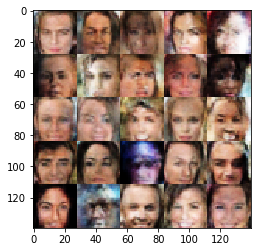

Epoch 2/2... Batch 4110... Discriminator Loss: 0.7479... Generator Loss: 5.2558
Epoch 2/2... Batch 4120... Discriminator Loss: 0.3509... Generator Loss: 5.6113
Epoch 2/2... Batch 4130... Discriminator Loss: 0.3467... Generator Loss: 5.1173
Epoch 2/2... Batch 4140... Discriminator Loss: 0.3817... Generator Loss: 3.8080
Epoch 2/2... Batch 4150... Discriminator Loss: 0.3765... Generator Loss: 5.4359
Epoch 2/2... Batch 4160... Discriminator Loss: 0.3707... Generator Loss: 5.2054
Epoch 2/2... Batch 4170... Discriminator Loss: 5.1102... Generator Loss: 7.1841
Epoch 2/2... Batch 4180... Discriminator Loss: 0.4188... Generator Loss: 2.6288
Epoch 2/2... Batch 4190... Discriminator Loss: 0.5047... Generator Loss: 6.5600
Epoch 2/2... Batch 4200... Discriminator Loss: 0.5200... Generator Loss: 2.4710


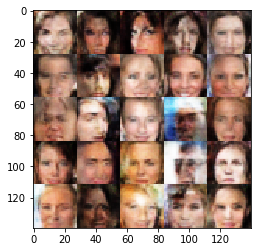

Epoch 2/2... Batch 4210... Discriminator Loss: 0.9025... Generator Loss: 5.6785
Epoch 2/2... Batch 4220... Discriminator Loss: 0.3601... Generator Loss: 4.5585
Epoch 2/2... Batch 4230... Discriminator Loss: 0.4309... Generator Loss: 4.3346
Epoch 2/2... Batch 4240... Discriminator Loss: 0.4475... Generator Loss: 3.9273
Epoch 2/2... Batch 4250... Discriminator Loss: 0.3704... Generator Loss: 3.6887
Epoch 2/2... Batch 4260... Discriminator Loss: 0.3585... Generator Loss: 5.0996
Epoch 2/2... Batch 4270... Discriminator Loss: 0.7858... Generator Loss: 3.1759
Epoch 2/2... Batch 4280... Discriminator Loss: 0.3939... Generator Loss: 3.5548
Epoch 2/2... Batch 4290... Discriminator Loss: 0.3667... Generator Loss: 4.7833
Epoch 2/2... Batch 4300... Discriminator Loss: 0.6866... Generator Loss: 4.1666


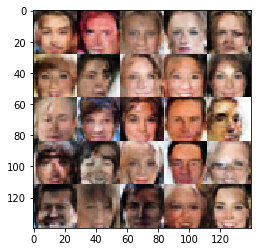

Epoch 2/2... Batch 4310... Discriminator Loss: 0.5213... Generator Loss: 2.7444
Epoch 2/2... Batch 4320... Discriminator Loss: 0.4101... Generator Loss: 3.2165
Epoch 2/2... Batch 4330... Discriminator Loss: 0.3838... Generator Loss: 3.3821
Epoch 2/2... Batch 4340... Discriminator Loss: 0.4018... Generator Loss: 3.4558
Epoch 2/2... Batch 4350... Discriminator Loss: 0.3784... Generator Loss: 4.0374
Epoch 2/2... Batch 4360... Discriminator Loss: 0.3495... Generator Loss: 4.8031
Epoch 2/2... Batch 4370... Discriminator Loss: 0.5926... Generator Loss: 2.0376
Epoch 2/2... Batch 4380... Discriminator Loss: 0.3488... Generator Loss: 4.5772
Epoch 2/2... Batch 4390... Discriminator Loss: 0.3839... Generator Loss: 3.6324
Epoch 2/2... Batch 4400... Discriminator Loss: 0.3485... Generator Loss: 4.6721


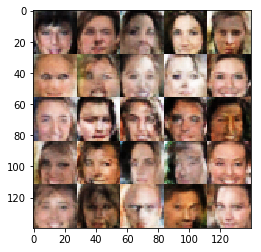

Epoch 2/2... Batch 4410... Discriminator Loss: 0.3771... Generator Loss: 4.1332
Epoch 2/2... Batch 4420... Discriminator Loss: 0.3883... Generator Loss: 3.7161
Epoch 2/2... Batch 4430... Discriminator Loss: 0.3605... Generator Loss: 5.4351
Epoch 2/2... Batch 4440... Discriminator Loss: 0.3508... Generator Loss: 6.5613
Epoch 2/2... Batch 4450... Discriminator Loss: 1.0085... Generator Loss: 1.1609
Epoch 2/2... Batch 4460... Discriminator Loss: 0.6300... Generator Loss: 1.4929
Epoch 2/2... Batch 4470... Discriminator Loss: 0.4137... Generator Loss: 5.6306
Epoch 2/2... Batch 4480... Discriminator Loss: 0.4759... Generator Loss: 4.0684
Epoch 2/2... Batch 4490... Discriminator Loss: 0.5766... Generator Loss: 1.9011
Epoch 2/2... Batch 4500... Discriminator Loss: 1.6177... Generator Loss: 0.5289


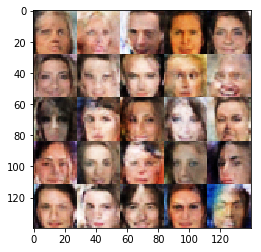

Epoch 2/2... Batch 4510... Discriminator Loss: 0.3548... Generator Loss: 4.3050
Epoch 2/2... Batch 4520... Discriminator Loss: 0.7495... Generator Loss: 1.6057
Epoch 2/2... Batch 4530... Discriminator Loss: 0.7400... Generator Loss: 1.2113
Epoch 2/2... Batch 4540... Discriminator Loss: 0.4007... Generator Loss: 3.4482
Epoch 2/2... Batch 4550... Discriminator Loss: 0.5020... Generator Loss: 2.5460
Epoch 2/2... Batch 4560... Discriminator Loss: 0.4093... Generator Loss: 4.1038
Epoch 2/2... Batch 4570... Discriminator Loss: 0.3473... Generator Loss: 5.3403
Epoch 2/2... Batch 4580... Discriminator Loss: 0.3466... Generator Loss: 6.2173
Epoch 2/2... Batch 4590... Discriminator Loss: 0.3590... Generator Loss: 4.1471
Epoch 2/2... Batch 4600... Discriminator Loss: 0.4273... Generator Loss: 2.7378


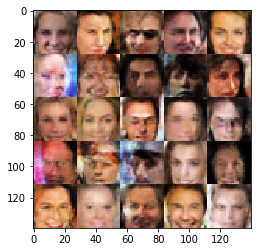

Epoch 2/2... Batch 4610... Discriminator Loss: 0.3885... Generator Loss: 5.8299
Epoch 2/2... Batch 4620... Discriminator Loss: 0.4995... Generator Loss: 3.5624
Epoch 2/2... Batch 4630... Discriminator Loss: 0.3674... Generator Loss: 4.3925
Epoch 2/2... Batch 4640... Discriminator Loss: 0.7739... Generator Loss: 1.4960
Epoch 2/2... Batch 4650... Discriminator Loss: 0.4529... Generator Loss: 3.7060
Epoch 2/2... Batch 4660... Discriminator Loss: 0.4018... Generator Loss: 3.0949
Epoch 2/2... Batch 4670... Discriminator Loss: 0.3709... Generator Loss: 4.3739
Epoch 2/2... Batch 4680... Discriminator Loss: 1.7064... Generator Loss: 5.7046
Epoch 2/2... Batch 4690... Discriminator Loss: 0.5274... Generator Loss: 2.1699
Epoch 2/2... Batch 4700... Discriminator Loss: 2.0894... Generator Loss: 0.3037


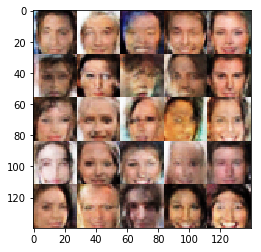

Epoch 2/2... Batch 4710... Discriminator Loss: 0.5064... Generator Loss: 2.6500
Epoch 2/2... Batch 4720... Discriminator Loss: 0.3607... Generator Loss: 3.8664
Epoch 2/2... Batch 4730... Discriminator Loss: 0.7836... Generator Loss: 1.2997
Epoch 2/2... Batch 4740... Discriminator Loss: 0.5217... Generator Loss: 5.4031
Epoch 2/2... Batch 4750... Discriminator Loss: 0.6464... Generator Loss: 4.4524
Epoch 2/2... Batch 4760... Discriminator Loss: 2.8207... Generator Loss: 4.9469
Epoch 2/2... Batch 4770... Discriminator Loss: 0.3887... Generator Loss: 3.2034
Epoch 2/2... Batch 4780... Discriminator Loss: 0.3822... Generator Loss: 5.0764
Epoch 2/2... Batch 4790... Discriminator Loss: 0.5119... Generator Loss: 2.8603
Epoch 2/2... Batch 4800... Discriminator Loss: 0.4099... Generator Loss: 5.7903


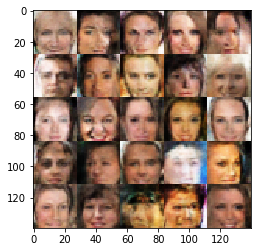

Epoch 2/2... Batch 4810... Discriminator Loss: 0.5077... Generator Loss: 5.1063
Epoch 2/2... Batch 4820... Discriminator Loss: 0.9645... Generator Loss: 1.0371
Epoch 2/2... Batch 4830... Discriminator Loss: 0.3950... Generator Loss: 3.3466
Epoch 2/2... Batch 4840... Discriminator Loss: 0.4043... Generator Loss: 3.4778
Epoch 2/2... Batch 4850... Discriminator Loss: 0.3464... Generator Loss: 5.1093
Epoch 2/2... Batch 4860... Discriminator Loss: 1.3663... Generator Loss: 0.6402
Epoch 2/2... Batch 4870... Discriminator Loss: 0.3386... Generator Loss: 5.1182
Epoch 2/2... Batch 4880... Discriminator Loss: 0.3941... Generator Loss: 4.8796
Epoch 2/2... Batch 4890... Discriminator Loss: 0.3458... Generator Loss: 5.4092
Epoch 2/2... Batch 4900... Discriminator Loss: 0.3417... Generator Loss: 5.1743


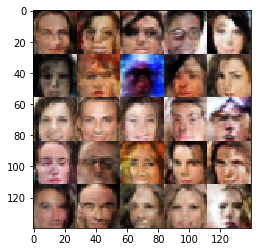

Epoch 2/2... Batch 4910... Discriminator Loss: 0.3950... Generator Loss: 3.2861
Epoch 2/2... Batch 4920... Discriminator Loss: 0.7082... Generator Loss: 5.0014
Epoch 2/2... Batch 4930... Discriminator Loss: 0.4787... Generator Loss: 3.0049
Epoch 2/2... Batch 4940... Discriminator Loss: 0.3810... Generator Loss: 3.9602
Epoch 2/2... Batch 4950... Discriminator Loss: 0.4358... Generator Loss: 4.0176
Epoch 2/2... Batch 4960... Discriminator Loss: 0.3534... Generator Loss: 6.1789
Epoch 2/2... Batch 4970... Discriminator Loss: 0.3614... Generator Loss: 4.5386
Epoch 2/2... Batch 4980... Discriminator Loss: 0.3679... Generator Loss: 3.8406
Epoch 2/2... Batch 4990... Discriminator Loss: 0.3641... Generator Loss: 5.2957
Epoch 2/2... Batch 5000... Discriminator Loss: 0.3483... Generator Loss: 5.9914


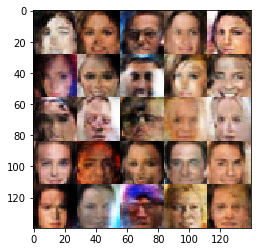

Epoch 2/2... Batch 5010... Discriminator Loss: 0.3574... Generator Loss: 5.0032
Epoch 2/2... Batch 5020... Discriminator Loss: 0.3844... Generator Loss: 4.3040
Epoch 2/2... Batch 5030... Discriminator Loss: 0.3559... Generator Loss: 5.8084
Epoch 2/2... Batch 5040... Discriminator Loss: 0.3500... Generator Loss: 6.7553
Epoch 2/2... Batch 5050... Discriminator Loss: 0.3655... Generator Loss: 4.3562
Epoch 2/2... Batch 5060... Discriminator Loss: 2.0885... Generator Loss: 4.4735
Epoch 2/2... Batch 5070... Discriminator Loss: 0.3518... Generator Loss: 4.7144
Epoch 2/2... Batch 5080... Discriminator Loss: 0.3627... Generator Loss: 4.4894
Epoch 2/2... Batch 5090... Discriminator Loss: 1.7953... Generator Loss: 0.3640
Epoch 2/2... Batch 5100... Discriminator Loss: 0.4515... Generator Loss: 2.9098


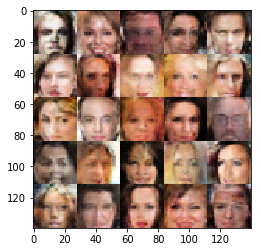

Epoch 2/2... Batch 5110... Discriminator Loss: 0.3863... Generator Loss: 3.9931
Epoch 2/2... Batch 5120... Discriminator Loss: 0.3959... Generator Loss: 3.9090
Epoch 2/2... Batch 5130... Discriminator Loss: 0.3430... Generator Loss: 6.0057
Epoch 2/2... Batch 5140... Discriminator Loss: 0.3836... Generator Loss: 3.9024
Epoch 2/2... Batch 5150... Discriminator Loss: 0.3459... Generator Loss: 5.1228
Epoch 2/2... Batch 5160... Discriminator Loss: 0.3453... Generator Loss: 5.7606
Epoch 2/2... Batch 5170... Discriminator Loss: 0.3577... Generator Loss: 5.2740
Epoch 2/2... Batch 5180... Discriminator Loss: 0.3493... Generator Loss: 5.9323
Epoch 2/2... Batch 5190... Discriminator Loss: 3.3582... Generator Loss: 0.1041
Epoch 2/2... Batch 5200... Discriminator Loss: 0.8056... Generator Loss: 1.2332


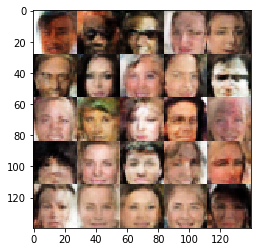

Epoch 2/2... Batch 5210... Discriminator Loss: 0.3905... Generator Loss: 3.3728
Epoch 2/2... Batch 5220... Discriminator Loss: 0.3612... Generator Loss: 4.7971
Epoch 2/2... Batch 5230... Discriminator Loss: 0.5957... Generator Loss: 2.0206
Epoch 2/2... Batch 5240... Discriminator Loss: 0.3469... Generator Loss: 6.3848
Epoch 2/2... Batch 5250... Discriminator Loss: 0.3485... Generator Loss: 5.2454
Epoch 2/2... Batch 5260... Discriminator Loss: 0.3676... Generator Loss: 4.7301
Epoch 2/2... Batch 5270... Discriminator Loss: 0.5342... Generator Loss: 2.5982
Epoch 2/2... Batch 5280... Discriminator Loss: 0.3951... Generator Loss: 3.4079
Epoch 2/2... Batch 5290... Discriminator Loss: 0.4502... Generator Loss: 4.5500
Epoch 2/2... Batch 5300... Discriminator Loss: 0.3772... Generator Loss: 4.5262


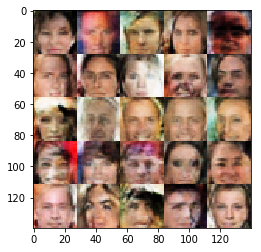

Epoch 2/2... Batch 5310... Discriminator Loss: 0.8880... Generator Loss: 1.2343
Epoch 2/2... Batch 5320... Discriminator Loss: 0.8091... Generator Loss: 2.2903
Epoch 2/2... Batch 5330... Discriminator Loss: 0.4030... Generator Loss: 4.0817
Epoch 2/2... Batch 5340... Discriminator Loss: 0.3585... Generator Loss: 4.0555
Epoch 2/2... Batch 5350... Discriminator Loss: 0.3735... Generator Loss: 3.7656
Epoch 2/2... Batch 5360... Discriminator Loss: 0.3582... Generator Loss: 4.4672
Epoch 2/2... Batch 5370... Discriminator Loss: 0.3571... Generator Loss: 4.5027
Epoch 2/2... Batch 5380... Discriminator Loss: 0.6651... Generator Loss: 2.0061
Epoch 2/2... Batch 5390... Discriminator Loss: 0.7213... Generator Loss: 7.4822
Epoch 2/2... Batch 5400... Discriminator Loss: 0.4653... Generator Loss: 5.9058


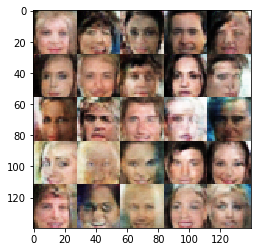

Epoch 2/2... Batch 5410... Discriminator Loss: 0.3802... Generator Loss: 3.9221
Epoch 2/2... Batch 5420... Discriminator Loss: 0.4320... Generator Loss: 5.5203
Epoch 2/2... Batch 5430... Discriminator Loss: 0.8338... Generator Loss: 3.9964
Epoch 2/2... Batch 5440... Discriminator Loss: 1.4765... Generator Loss: 0.5507
Epoch 2/2... Batch 5450... Discriminator Loss: 0.6546... Generator Loss: 4.7052
Epoch 2/2... Batch 5460... Discriminator Loss: 0.7385... Generator Loss: 4.9057
Epoch 2/2... Batch 5470... Discriminator Loss: 0.4018... Generator Loss: 3.3541
Epoch 2/2... Batch 5480... Discriminator Loss: 0.7211... Generator Loss: 1.7060
Epoch 2/2... Batch 5490... Discriminator Loss: 0.9840... Generator Loss: 0.9154
Epoch 2/2... Batch 5500... Discriminator Loss: 0.4172... Generator Loss: 3.2875


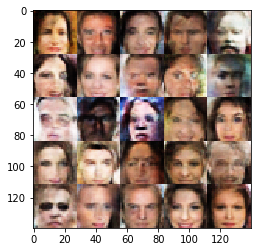

Epoch 2/2... Batch 5510... Discriminator Loss: 0.3443... Generator Loss: 5.2982
Epoch 2/2... Batch 5520... Discriminator Loss: 0.7170... Generator Loss: 3.3661
Epoch 2/2... Batch 5530... Discriminator Loss: 0.5929... Generator Loss: 1.9171
Epoch 2/2... Batch 5540... Discriminator Loss: 1.0285... Generator Loss: 7.4513
Epoch 2/2... Batch 5550... Discriminator Loss: 1.1538... Generator Loss: 5.9165
Epoch 2/2... Batch 5560... Discriminator Loss: 0.3617... Generator Loss: 5.3702
Epoch 2/2... Batch 5570... Discriminator Loss: 0.6827... Generator Loss: 5.4112
Epoch 2/2... Batch 5580... Discriminator Loss: 0.4462... Generator Loss: 5.2985
Epoch 2/2... Batch 5590... Discriminator Loss: 0.3617... Generator Loss: 4.3596
Epoch 2/2... Batch 5600... Discriminator Loss: 0.3710... Generator Loss: 3.7611


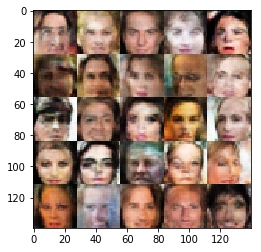

Epoch 2/2... Batch 5610... Discriminator Loss: 0.3423... Generator Loss: 5.6459
Epoch 2/2... Batch 5620... Discriminator Loss: 0.5782... Generator Loss: 2.5083
Epoch 2/2... Batch 5630... Discriminator Loss: 0.3847... Generator Loss: 5.3306
Epoch 2/2... Batch 5640... Discriminator Loss: 0.3530... Generator Loss: 5.0428
Epoch 2/2... Batch 5650... Discriminator Loss: 1.0796... Generator Loss: 0.7923
Epoch 2/2... Batch 5660... Discriminator Loss: 0.3965... Generator Loss: 3.2629
Epoch 2/2... Batch 5670... Discriminator Loss: 0.3635... Generator Loss: 4.8722
Epoch 2/2... Batch 5680... Discriminator Loss: 0.3555... Generator Loss: 4.6568
Epoch 2/2... Batch 5690... Discriminator Loss: 0.3749... Generator Loss: 4.4547
Epoch 2/2... Batch 5700... Discriminator Loss: 0.3700... Generator Loss: 4.7106


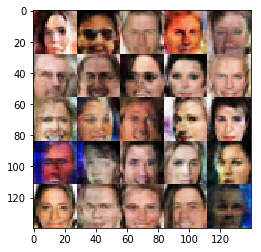

Epoch 2/2... Batch 5710... Discriminator Loss: 0.6179... Generator Loss: 2.0337
Epoch 2/2... Batch 5720... Discriminator Loss: 0.3692... Generator Loss: 3.8837
Epoch 2/2... Batch 5730... Discriminator Loss: 0.5085... Generator Loss: 3.2925
Epoch 2/2... Batch 5740... Discriminator Loss: 1.0248... Generator Loss: 0.9223
Epoch 2/2... Batch 5750... Discriminator Loss: 0.4549... Generator Loss: 3.1042
Epoch 2/2... Batch 5760... Discriminator Loss: 0.3593... Generator Loss: 4.3798
Epoch 2/2... Batch 5770... Discriminator Loss: 0.3419... Generator Loss: 6.0070
Epoch 2/2... Batch 5780... Discriminator Loss: 0.3646... Generator Loss: 4.8965
Epoch 2/2... Batch 5790... Discriminator Loss: 1.3810... Generator Loss: 2.9756
Epoch 2/2... Batch 5800... Discriminator Loss: 0.4688... Generator Loss: 2.6784


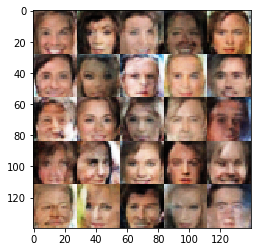

Epoch 2/2... Batch 5810... Discriminator Loss: 0.4189... Generator Loss: 4.1106
Epoch 2/2... Batch 5820... Discriminator Loss: 0.4847... Generator Loss: 3.4241
Epoch 2/2... Batch 5830... Discriminator Loss: 0.3978... Generator Loss: 3.3220
Epoch 2/2... Batch 5840... Discriminator Loss: 0.3587... Generator Loss: 3.9820
Epoch 2/2... Batch 5850... Discriminator Loss: 0.6619... Generator Loss: 2.4516
Epoch 2/2... Batch 5860... Discriminator Loss: 0.3710... Generator Loss: 4.7257
Epoch 2/2... Batch 5870... Discriminator Loss: 0.3761... Generator Loss: 4.4694
Epoch 2/2... Batch 5880... Discriminator Loss: 0.3469... Generator Loss: 5.0279
Epoch 2/2... Batch 5890... Discriminator Loss: 0.4056... Generator Loss: 4.2143
Epoch 2/2... Batch 5900... Discriminator Loss: 0.3708... Generator Loss: 4.8481


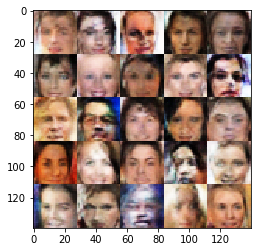

Epoch 2/2... Batch 5910... Discriminator Loss: 0.3499... Generator Loss: 4.6654
Epoch 2/2... Batch 5920... Discriminator Loss: 0.3914... Generator Loss: 3.4005
Epoch 2/2... Batch 5930... Discriminator Loss: 0.4372... Generator Loss: 3.4622
Epoch 2/2... Batch 5940... Discriminator Loss: 1.1852... Generator Loss: 0.8368
Epoch 2/2... Batch 5950... Discriminator Loss: 0.3567... Generator Loss: 4.0324
Epoch 2/2... Batch 5960... Discriminator Loss: 0.6037... Generator Loss: 4.9832
Epoch 2/2... Batch 5970... Discriminator Loss: 0.6233... Generator Loss: 2.1513
Epoch 2/2... Batch 5980... Discriminator Loss: 0.5921... Generator Loss: 2.1562
Epoch 2/2... Batch 5990... Discriminator Loss: 0.3624... Generator Loss: 3.9527
Epoch 2/2... Batch 6000... Discriminator Loss: 0.7222... Generator Loss: 2.6869


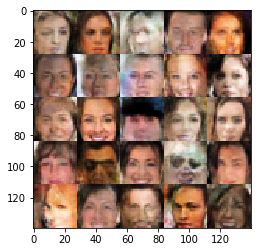

Epoch 2/2... Batch 6010... Discriminator Loss: 0.3525... Generator Loss: 4.3451
Epoch 2/2... Batch 6020... Discriminator Loss: 0.3735... Generator Loss: 4.3483
Epoch 2/2... Batch 6030... Discriminator Loss: 1.0244... Generator Loss: 3.0336
Epoch 2/2... Batch 6040... Discriminator Loss: 0.5055... Generator Loss: 2.3725
Epoch 2/2... Batch 6050... Discriminator Loss: 0.3581... Generator Loss: 4.2426
Epoch 2/2... Batch 6060... Discriminator Loss: 0.3596... Generator Loss: 5.2475
Epoch 2/2... Batch 6070... Discriminator Loss: 0.3872... Generator Loss: 3.6802
Epoch 2/2... Batch 6080... Discriminator Loss: 0.4455... Generator Loss: 3.0559
Epoch 2/2... Batch 6090... Discriminator Loss: 0.3730... Generator Loss: 4.2226
Epoch 2/2... Batch 6100... Discriminator Loss: 0.3832... Generator Loss: 3.3242


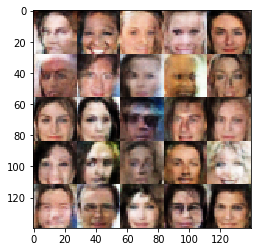

Epoch 2/2... Batch 6110... Discriminator Loss: 0.4995... Generator Loss: 3.2054
Epoch 2/2... Batch 6120... Discriminator Loss: 0.3491... Generator Loss: 5.7564
Epoch 2/2... Batch 6130... Discriminator Loss: 1.6380... Generator Loss: 4.0894
Epoch 2/2... Batch 6140... Discriminator Loss: 0.5176... Generator Loss: 2.3254
Epoch 2/2... Batch 6150... Discriminator Loss: 0.3698... Generator Loss: 4.9327
Epoch 2/2... Batch 6160... Discriminator Loss: 0.5390... Generator Loss: 2.6254
Epoch 2/2... Batch 6170... Discriminator Loss: 0.7090... Generator Loss: 1.5219
Epoch 2/2... Batch 6180... Discriminator Loss: 0.3386... Generator Loss: 6.0324
Epoch 2/2... Batch 6190... Discriminator Loss: 0.3601... Generator Loss: 4.2150
Epoch 2/2... Batch 6200... Discriminator Loss: 0.3494... Generator Loss: 4.9982


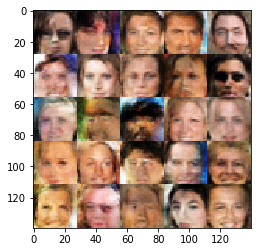

Epoch 2/2... Batch 6210... Discriminator Loss: 0.4133... Generator Loss: 3.0106
Epoch 2/2... Batch 6220... Discriminator Loss: 0.6405... Generator Loss: 1.7251
Epoch 2/2... Batch 6230... Discriminator Loss: 0.4983... Generator Loss: 3.1705
Epoch 2/2... Batch 6240... Discriminator Loss: 0.3764... Generator Loss: 5.3647
Epoch 2/2... Batch 6250... Discriminator Loss: 0.3682... Generator Loss: 4.6094
Epoch 2/2... Batch 6260... Discriminator Loss: 0.3471... Generator Loss: 5.1110
Epoch 2/2... Batch 6270... Discriminator Loss: 0.3972... Generator Loss: 4.9488
Epoch 2/2... Batch 6280... Discriminator Loss: 0.3666... Generator Loss: 4.5991
Epoch 2/2... Batch 6290... Discriminator Loss: 0.5664... Generator Loss: 1.7204
Epoch 2/2... Batch 6300... Discriminator Loss: 0.7055... Generator Loss: 4.8163


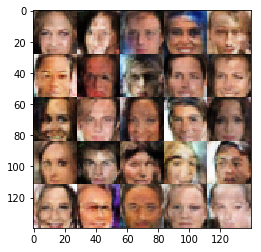

Epoch 2/2... Batch 6310... Discriminator Loss: 0.3556... Generator Loss: 5.0185
Epoch 2/2... Batch 6320... Discriminator Loss: 0.4454... Generator Loss: 2.4963
Epoch 2/2... Batch 6330... Discriminator Loss: 0.3338... Generator Loss: 6.3482


In [23]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.